### Import Packages

In [1]:
import os
import numpy as np
import pandas as pd
import csv
from scipy import stats
from scipy.special import inv_boxcox
import sklearn.metrics as met
import statsmodels.api as sm
from sklearn.model_selection import train_test_split, LeaveOneOut
from sklearn.linear_model import Lasso, Ridge, LinearRegression, LogisticRegression
from sklearn.kernel_ridge import KernelRidge

import itertools
import multiprocessing
import matplotlib.pyplot as plt
import seaborn as sns

from datetime import datetime

from numpy.linalg import inv
from sklearn.utils import shuffle

import timeit

### Import Clean Data
excluding students that failed out.
This is from running the DataCleanup_PTNdata1 file.

In [2]:
#expanding viewing capability
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
PTNdata1Path = ('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_clean.csv')
PTNdata1 = pd.read_csv(PTNdata1Path)
PTNdata1 = PTNdata1.iloc[0:, 1:] #get rid of row just counting overall observation
PTNdata1.head()

,Student ID,Training Date,Flight/Sim #,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Heat to Guns Setup,Heat to Guns Maneuvering,Fuel Awareness/Management,Advanced Handling,Perch Setups,Maneuver Selection,Offensive Fighter Mnvr Exec,Defensive Fighter Mnvr Exec,CZ Recognition,Air to Air Weapons Employ,HA Lead Turn Exercise,HA Butterfly Setups,HA BFM Flt Analysis,SA Conventional Range,SA Tactical Range Proc,SA Safe-Excape Maneuver,SA Threat Reaction,SA Weapons Employment,Air to Ground Error Analysis,TACS/JFIRE Procedures,Air to Gnd 2-Ship Mutual Supt,Mission Management,VFR Arrival,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations,Device,Training Exercise,Total MIF
0,1,2018-04-02,Sim #2,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,36
1,1,2018-04-03,Sim #3,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,49
2,1,2018-04-04,Flight #1,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,57
3,1,2018-04-06,Sim #5,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,3.0,3.0,0.0,3.0

In [4]:
#define maneuver categories 

basicManeuverNames = ['Mission Analysis/Products', 'Ground Ops','Takeoff','Departure','Basic Aircraft Control','Cross-Check','Enroute Descent / Recovery','Inflight Checks','Inflight Planning','Clearing / Visual Lookout','Communication','Risk Mgmt / Decision Making','Situational Awareness','Task Management','Emergency Procedures','General Knowledge']
patternsNames = ['Overhead/Closed Pattern', 'Visual St-In', 'Landing', 'No-Flap Landing', 'Go-Around', 'Emergency Landing Pattern']
contactNames = ['G-Awareness', 'TP Stalls', 'Slow Flight', 'Power On Stalls', 'Contact Recoveries', 'Spin Recovery', 'Aileron Roll', 'Barrel Roll', 'Pitchback / Sliceback', 'Cloverleaf', 'Cuban Eight', 'Immelmann', 'Lazy Eight', 'Loop', 'Split S']
instrumentNames =['Vertical S', 'Unusual Attitudes', 'Steep Turns', 'Intercept / Maintain Arc', 'Fix to Fix', 'Holding', 'Full Procedure Approach', 'Non-Precision Final', 'Precision Final', 'Circling Approach', 'Missed Approach', 'Night Landing']
basicFormationNames = ['Wing Takeoff', 'Interval Takeoff', 'Instrument Trail', 'G-Warmup / Awareness', 'Lead Platform', 'Pitchout (Both)', 'Fingertip (Wing)', 'Route (Wing)', 'Fighting Wing (Wing)', 'Straight Ahead Rejoin', 'Turning Rejoin', 'Overshoot', 'Echelon (Wing)', 'Breakout (Wing)', 'Lost Wingman (Both)', 'Extended Trail (Wing)', 'Position Change', 'Formation Approach (Both)', 'Formation Landing (Both)', 'Battle Damage Check', 'Flt Integrity / Wingman Consideration']
tacticalFormationNames =['Delay 90', 'Delay 45', 'Hook Turn', 'Shackle', 'Cross Turn', 'Fluid Turn', 'Tactical Rejoins', 'Fluid Maneuvering', 'Tac Initial']
lowLevelNames = ['Course Mx', 'Course Entry', 'Time Control', 'Altitude Control', 'Checkpoint ID', 'LL GPS Integration', 'Tactical Maneuvering', 'LL Lead Change']
fourShipFormationNames = ['Four Ship Admin', 'Fluid 4', 'Box Formation', 'Offset Box', 'Wall', '4-Ship Fingertip','4-Ship Straight Ahead Rejoin','4-Ship Turning Rejoin']
cafIntroNames = ['Heat to Guns Setup', 'Heat to Guns Maneuvering ', 'Fuel Awareness/Management', 'Advanced Handling', 'Perch Setups', 'Maneuver Selection', 'Offensive Fighter Mnvr Exec', 'Defensive Fighter Mnvr Exec', 'CZ Recognition', 'Air to Air Weapons Employ', 'HA Lead Turn Exercise', 'HA Butterfly Setups', 'HA BFM Flt Analysis', 'SA Conventional Range', 'SA Tactical Range Proc', 'SA Safe-Excape Maneuver', 'SA Threat Reaction', 'SA Weapons Employment', 'Air to Ground Error Analysis', 'TACS/JFIRE Procedures', 'Air to Gnd 2-Ship Mutual Supt']
mafIntroNames = ['Mission Management', 'VFR Arrival', 'Tanker Procedures', 'Reciever Procedures', 'Airdrop Procedures', 'Crew Coordination', 'Single Engine Approach', 'Single Engine GA/Missed Appch', 'A/R Overrun', 'A/R Breakaway', 'FD/AP Operations', 'FMS Operations']

In [5]:
categoryList = ['basicManeuver','patterns','contact','instrument','basicFormation','tacticalFormation','lowLevel','fourShipFormation','cafIntro','mafIntro']
print(len(categoryList))
#categoryList = [basicManeuverNames,patternsNames,contactNames,instrumentNames,basicFormationNames,tacticalFormationNames,lowLevelNames,fourShipFormationNames,cafIntroNames,mafIntroNames]

10


In [6]:
#information for student i 
i = 1
PTNdata1[PTNdata1['Student ID']== i].head()

,Student ID,Training Date,Flight/Sim #,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Heat to Guns Setup,Heat to Guns Maneuvering,Fuel Awareness/Management,Advanced Handling,Perch Setups,Maneuver Selection,Offensive Fighter Mnvr Exec,Defensive Fighter Mnvr Exec,CZ Recognition,Air to Air Weapons Employ,HA Lead Turn Exercise,HA Butterfly Setups,HA BFM Flt Analysis,SA Conventional Range,SA Tactical Range Proc,SA Safe-Excape Maneuver,SA Threat Reaction,SA Weapons Employment,Air to Ground Error Analysis,TACS/JFIRE Procedures,Air to Gnd 2-Ship Mutual Supt,Mission Management,VFR Arrival,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations,Device,Training Exercise,Total MIF
0,1,2018-04-02,Sim #2,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,36
1,1,2018-04-03,Sim #3,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,49
2,1,2018-04-04,Flight #1,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,57
3,1,2018-04-06,Sim #5,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,3.0,3.0,0.0,3.0

In [7]:
# total students in class
totalStudents = len(PTNdata1['Student ID'].unique())

print('# of individual students in this data: ',totalStudents)

# of individual students in this data:  18


In [8]:
# how many training days each student had
counts = pd.DataFrame(PTNdata1['Student ID'].value_counts())
print(counts) 

    Student ID
11         100
18          95
12          94
15          94
1           93
10          92
13          91
5           90
9           87
3           86
14          80
7           80
4           79
2           77
8           69
19          69
17          66
16          60


In [9]:
from collections import Counter
Tlengths = Counter(counts['Student ID'])
day_counts = list(Tlengths.values())
print(day_counts)
keys = list(Tlengths.keys())
print(keys)

[1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1]
[100, 95, 94, 93, 92, 91, 90, 87, 86, 80, 79, 77, 69, 66, 60]


### Defining some functions to find best fit distribution for graduation length expectations

In [10]:
#functions to fit a distribution to data and plot
import scipy
import scipy.stats
import matplotlib

class Distribution(object):
    
    def __init__(self,dist_names_list = []):
        self.dist_names = ['norm','lognorm','expon','gamma','chi2','beta']
        self.dist_results = []
        self.params = {}
        
        self.DistributionName = ""
        self.PValue = 0
        self.Param = None
        
        self.isFitted = False
        
        
    def Fit(self, y):
        self.dist_results = []
        self.params = {}
        for dist_name in self.dist_names:
            dist = getattr(scipy.stats, dist_name)
            param = dist.fit(y)
            
            self.params[dist_name] = param
            #Applying the Kolmogorov-Smirnov test
            D, p = scipy.stats.kstest(y, dist_name, args=param);
            self.dist_results.append((dist_name,p))
        #select the best fitted distribution
        sel_dist,p = (max(self.dist_results,key=lambda item:item[1]))
        #store the name of the best fit and its p value
        self.DistributionName = sel_dist
        self.PValue = p
        
        self.isFitted = True
        return self.DistributionName,self.PValue
    
    def Random(self, n = 1):
        if self.isFitted:
            dist_name = self.DistributionName
            param = self.params[dist_name]
            #initiate the scipy distribution
            dist = getattr(scipy.stats, dist_name)
            return dist.rvs(*param[:-2], loc=param[-2], scale=param[-1], size=n)
        else:
            raise ValueError('Must first run the Fit method.')
            
    def Plot(self,y):
        #randomly generate values from distribution
        x = self.Random(n=10000)
        #round numbers to whole numbers because its discrete data
        x =[round(xx)for xx in x]
        #print(x)
        # Density Plot and Histogram of all arrival delays
        sns.distplot(x, hist=True, kde=True, bins=int(50), color = 'darkblue', hist_kws={'edgecolor':'black'},kde_kws={'linewidth': 4})
        plt.xlabel("Training Exercise")
        plt.ylabel('Density') 
        plt.title("Training campaign Length Frequencies")
        plt.legend(loc='upper right')

No handles with labels found to put in legend.


norm 1.1950851285640418e-31
{'norm': (83.44444444444444, 11.23101965402678), 'lognorm': (8.385657874909985, 59.99999999999999, 2.4039134470733594), 'expon': (60.0, 23.444444444444443), 'gamma': (270.65354367059535, -106.3929020370229, 0.7009530747111072), 'chi2': (0.25964432581041885, 59.999999999999986, 3.167934394902842), 'beta': (1.3531816941109414, 0.746773092631068, 50.49812106456329, 49.501878935436714)}


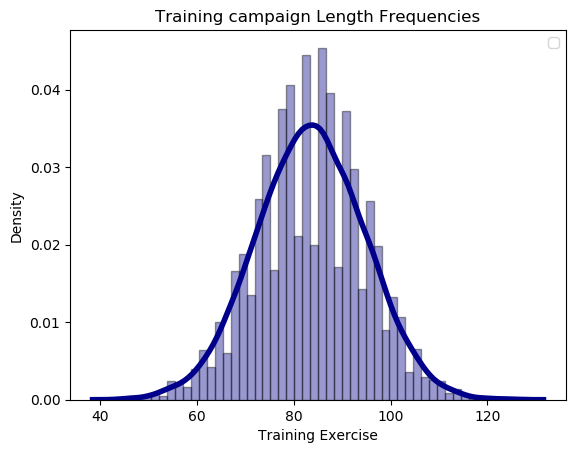

In [128]:
#plot simulated graduations and look at best fitting models. 

temp = counts

dst = Distribution()
dst.Fit(temp)
dst.Plot(temp)

print(dst.DistributionName,dst.PValue)
print(dst.params)

<Figure size 800x200 with 0 Axes>

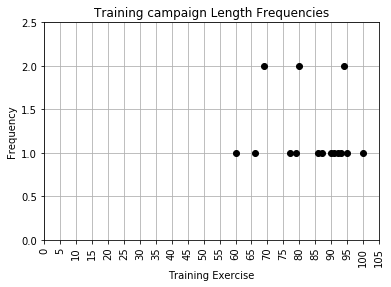

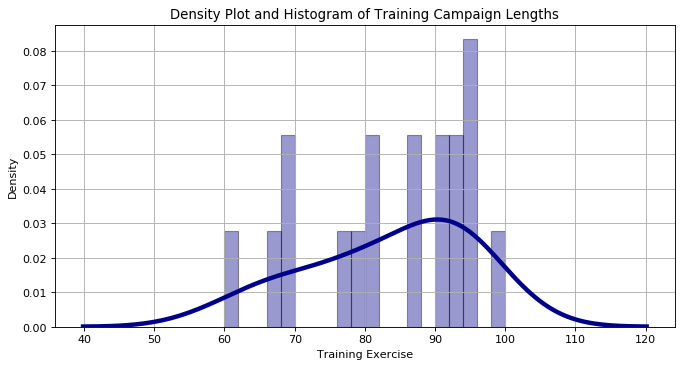

In [12]:
#looking at different campaign durations and corresponding density plot to predict them in future based on current data.

figure11 = plt.figure(num=11, figsize=(10, 2.5), dpi=80)
plt.figure(2).patch.set_facecolor('white')
plt.gca().set_facecolor('xkcd:white')
#plot points
plt.plot(keys,day_counts, 'o', color = 'k')

plt.xticks(np.arange(0,max(keys) +10 , 5),rotation = 90)
plt.yticks(np.arange(0, 3 , .5))
plt.xlabel("Training Exercise")
plt.ylabel('Frequency') 
plt.grid()
plt.title("Training campaign Length Frequencies")
#plt.savefig('.png')
plt.show()



figure12 = plt.figure(num=12, figsize=(10, 5), dpi=80)
# Density Plot and Histogram
sns.distplot(counts, hist=True, kde=True, bins=int(20), color = 'darkblue', hist_kws={'edgecolor':'black'},kde_kws={'linewidth': 4})

plt.xlabel("Training Exercise")
plt.ylabel('Density') 
plt.grid()
plt.title("Density Plot and Histogram of Training Campaign Lengths")
plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/TrainingLength_DensityPlot.png')
plt.show()

In [13]:
#looking at campaign length descriptive statistics

# how many training days each individual student had
exercise_per_student = pd.DataFrame(PTNdata1['Student ID'].value_counts())
exercise_per_student = exercise_per_student.sort_values(by = ['Student ID'])
#print(exercise_per_student )

avgExercises = exercise_per_student['Student ID'].mean() 
medianExercises = exercise_per_student['Student ID'].median()
minExercises = exercise_per_student['Student ID'].min()
maxExercises = exercise_per_student['Student ID'].max()
modeExercises = exercise_per_student['Student ID'].mode()

print("")
print("average total number of training exercises: ",avgExercises)
print("median total number of training exercises: ",medianExercises)
print("min total number of training exercises: ",minExercises)
print("max total number of training exercises: ",maxExercises)
print("mode number of training exercises: ",modeExercises)


average total number of training exercises:  83.44444444444444
median total number of training exercises:  86.5
min total number of training exercises:  60
max total number of training exercises:  100
mode number of training exercises:  0    69
1    80
2    94
dtype: int64


### How long each student took to get through training
excluding students that failed out

total number of students that had performed maneuver on each training exercise:
   Training Exercise
1                 18
2                 18
3                 18
4                 18
5                 18


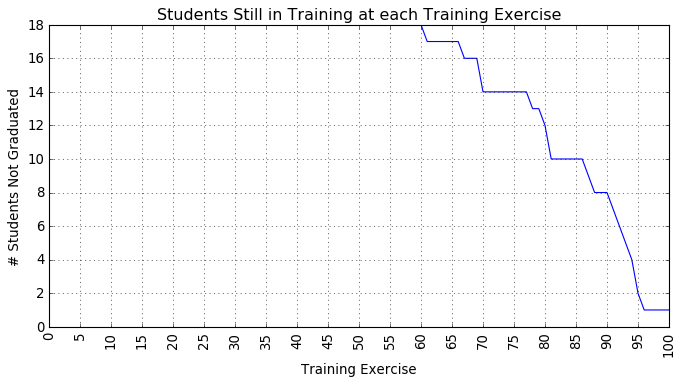

[18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18
 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18 18
 18 18 18 18 18 18 18 18 18 18 18 18 17 17 17 17 17 17 16 16 16 14 14 14
 14 14 14 14 14 13 13 12 10 10 10 10 10 10  9  8  8  8  7  6  5  4  2  1
  1  1  1  1]


In [14]:
#calculate how many students made it up to x number of evaluations
student_per_exerciseNum = pd.DataFrame(PTNdata1['Training Exercise'].value_counts())
student_per_exerciseNum = student_per_exerciseNum.sort_index()
print('total number of students that had performed maneuver on each training exercise:')
print( student_per_exerciseNum.head() )

x = np.arange(1, maxExercises+1)
y = totalStudents
figure2 = plt.figure(num=2, figsize=(10, 5), dpi=80)
plt.style.use('classic')
plt.figure(2).patch.set_facecolor('white')
plt.gca().set_facecolor('xkcd:white')
plt.plot(student_per_exerciseNum.index ,student_per_exerciseNum['Training Exercise'])
plt.xticks(np.arange(0,max(x) +1 , 5.0),rotation = 90)
plt.xlabel("Training Exercise")
plt.ylabel('# Students Not Graduated')
plt.grid()
plt.title("Students Still in Training at each Training Exercise")
plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/ClassSizeByTE.png')
plt.show()

student_per_exerciseNum = student_per_exerciseNum['Training Exercise'].values
print(student_per_exerciseNum)

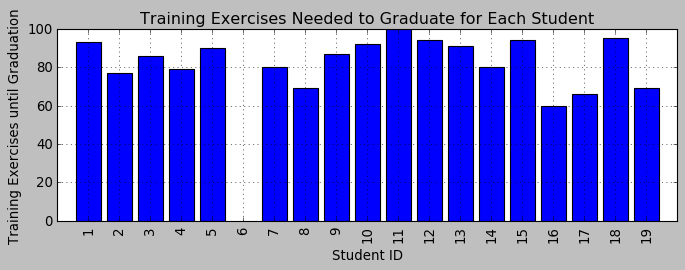

In [15]:

figure3 = plt.figure(num=3, figsize=(10, 3), dpi=80)
plt.bar(exercise_per_student.index,exercise_per_student['Student ID'])
plt.xticks(np.arange(1,totalStudents + 2, 1.0),rotation = 90)
plt.xlabel("Student ID")
plt.ylabel('Training Exercises until Graduation')
plt.grid()
plt.title("Training Exercises Needed to Graduate for Each Student")
plt.show()

# Descriptive Statistics of Scores per Maneuver

#### Max Scores per maneuver per training xercise

In [16]:
#create variables with max scores for each maneuver for each training exercise(excluding MAF and CAF tracks)
maxScores = np.zeros([len(PTNdata1.iloc[0,3:-3]), maxExercises])
print(np.shape(maxScores))

num_of_rows = len(PTNdata1.iloc[0,3:-3])
num_of_cols = maxExercises

#populate maneuver average scores and tells you average score of each maneuver on each training day. 
i = 1
j = 1
position_row = j-1
position_col = i-1

#for col in PTNdata1.iloc[:,3:-3].columns:
for col in PTNdata1.iloc[:,3:-3].columns:
    for numEval in PTNdata1['Training Exercise'].unique():
        
        values = PTNdata1[PTNdata1['Training Exercise']==numEval][col].max()
        #print(numEval,'---',col,'---',value)
        position = [int(num_of_cols * position_row + i-1)]

        np.put(maxScores, position, values)
        i = i+1

    j = j+1
    #print('i =',i)


(128, 100)


In [17]:
maxScores = pd.DataFrame(maxScores)
maxScores.columns = [np.arange(1, maxExercises+1)]
maxScores.index = PTNdata1.iloc[:,3:-3].columns
maxScores.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
Mission Analysis/Products,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,2.0,2.0,4.0,3.0,3.0
Ground Ops,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,4.0,4.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,3.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,2.0,1.0,4.0,4.0,3.0
Takeoff,3.0,4.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,3.0,3.0,2.0,4.0,4.0,3.0
Departure,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0
Basic Aircraft Control,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,3.0,3.0,4.0,3.0,2.0,2.0,4.0,4.0,3.0


In [18]:
#check number of maneuvers
num_maneuvers = maxScores.shape[0]
print('There are',num_maneuvers, 'total maneuvers that get graded...')

There are 128 total maneuvers that get graded...


In [19]:
#Export max scores to CSV file 
maxScores.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_maxScores.csv')

#### Min Scores per maneuver per training Exercise

In [20]:
#change all zeros to nan to not show minimum as 0 because 0 represents no occurance. we want to know minimum of the ones that did occur.
#value of NaN means there was no grades at all for that maneuve rin that training Exercise
PTNdata1.iloc[:,:-2] = PTNdata1.iloc[:,:-2].replace(np.float64(0),np.nan)

#create variables with min scores for each maneuver for each training Exercise(excluding MAF and CAF tracks)
minScores = np.zeros([len(PTNdata1.iloc[0,3:-3]), maxExercises])
print(np.shape(minScores))

num_of_rows = len(PTNdata1.iloc[0,3:-3])
num_of_cols = maxExercises

#populate maneuver average scores and tells you average score of each maneuver on each training day. 
i = 1
j = 1
position_row = j-1
position_col = i-1

for col in PTNdata1.iloc[:,3:-3].columns:
    for numEval in PTNdata1['Training Exercise'].unique():
        
        values = PTNdata1[PTNdata1['Training Exercise']==numEval][col].min()
        #print(numEval,'---',col,'---',value)
        position = [int(num_of_cols * position_row + i-1)]

        np.put(minScores, position, values)
        i = i+1

    j = j+1
    #print('i =',i)

(128, 100)


In [21]:
#puts minimums into a dataframe as long as maneuver was scored was actually maneuvers occured
#if a maneuver did not occur, then NaN is recorded 
minScores = pd.DataFrame(minScores)
minScores.columns = [np.arange(1, maxExercises+1)]
minScores.index = PTNdata1.iloc[:,3:-3].columns

#changes all NaN to 0 so we can visualize 
minScores = minScores.replace(np.nan,np.float64(0))
minScores.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
Mission Analysis/Products,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,1.0,2.0,3.0,2.0,1.0,1.0,2.0,1.0,2.0,3.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,3.0,3.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,4.0,3.0,3.0
Ground Ops,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,3.0,1.0,2.0,1.0,2.0,3.0,3.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,3.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,4.0,4.0,3.0
Takeoff,2.0,2.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,3.0,1.0,3.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,3.0,2.0,1.0,2.0,2.0,2.0,3.0,1.0,1.0,2.0,2.0,3.0,1.0,1.0,2.0,1.0,1.0,2.0,3.0,2.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,2.0,3.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,4.0,4.0,3.0
Departure,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,1.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,1.0,2.0,3.0,3.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,3.0,3.0,4.0,3.0
Basic Aircraft Control,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,3.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,4.0,4.0,3.0


In [22]:
#Export min scores to CSV file 
minScores.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_minScores.csv')

#### Average Scores per maneuver per training Exercise

In [23]:
#change all zeros to nan to not show minimum as 0 because 0 represents no occurance. we want to know mean of the ones that did occur.
#value of NaN means there was no grades at all for that maneuve rin that training Exercise
PTNdata1.iloc[:,:-2] = PTNdata1.iloc[:,:-2].replace(np.float64(0),np.nan)

#create variables with min scores for each maneuver for each training Exercise(excluding MAF and CAF tracks)
avgScores = np.zeros([len(PTNdata1.iloc[0,3:-3]), maxExercises])
print(np.shape(avgScores))

num_of_rows = len(PTNdata1.iloc[0,3:-3])
num_of_cols = maxExercises

#populate maneuver average scores and tells you average score of each maneuver on each training day. 
i = 1
j = 1
position_row = j-1
position_col = i-1

for col in PTNdata1.iloc[:,3:-3].columns:
    for numEval in PTNdata1['Training Exercise'].unique():
        
        values = PTNdata1[PTNdata1['Training Exercise']==numEval][col].mean()
        #print(numEval,'---',col,'---',value)
        position = [int(num_of_cols * position_row + i-1)]

        np.put(avgScores, position, values)
        i = i+1

    j = j+1
    #print('i =',i)

(128, 100)


In [24]:
#puts minimums into a dataframe as long as maneuver was scored was actually maneuvers occured
#if a maneuver did not occur, then NaN is recorded 
avgScores = pd.DataFrame(avgScores)
avgScores.columns = [np.arange(1, maxExercises+1)]
avgScores.index = PTNdata1.iloc[:,3:-3].columns

#changes all NaN to 0 so we can visualize 
avgScores = avgScores.replace(np.nan,np.float64(0))
avgScores.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100
Mission Analysis/Products,1.944444,2.133333,1.937500,2.111111,2.166667,2.000000,2.166667,2.411765,2.235294,2.388889,2.333333,2.277778,2.222222,2.666667,2.666667,2.625000,2.777778,2.944444,2.611111,2.833333,2.833333,2.666667,2.888889,2.611111,2.888889,2.777778,2.764706,3.055556,3.176471,3.111111,2.833333,3.111111,3.166667,3.055556,3.000000,3.111111,3.000000,3.111111,2.888889,3.111111,3.111111,3.222222,3.166667,3.055556,3.055556,2.888889,3.055556,2.944444,3.117647,3.277778,2.888889,3.277778,3.111111,3.235294,3.111111,3.277778,3.388889,3.166667,3.000000,3.055556,3.000000,2.588235,3.058824,3.235294,3.000000,2.882353,3.000000,3.1250,3.125000,2.857143,2.785714,3.071429,2.642857,2.714286,2.928571,2.923077,2.769231,3.076923,3.076923,2.583333,2.500000,3.1,2.8,2.8,2.4,2.800000,3.222222,3.250000,3.250000,3.000,2.714286,2.333333,2.4,2.25,2.5,2.0,2.0,4.0,3.0,3.0
Ground Ops,2.062500,2.187500,1.800000,2.222222,2.133333,2.153846,1.909091,2.000000,2.200000,2.333333,1.928571,2.000000,2.294118,2.500000,2.500000,2.416667,2.357143,2.833333,2.692308,2.846154,2.923077,3.000000,2.916667,2.615385,2.846154,2.916667,2.846154,2.800000,3.133333,2.846154,3.000000,2.923077,2.866667,3.000000,2.833333,2.866667,3.125000,3.071429,2.857143,3.055556,3.000000,3.166667,3.117647,2.937500,3.000000,3.000000,3.066667,3.000000,3.000000,3.352941,3.333333,3.235294,3.125000,3.066667,3.187500,3.166667,3.266667,3.000000,3.055556,3.000000,2.785714,2.866667,3.384615,3.066667,3.214286,2.937500,3.066667,3.1250,2.857143,3.000000,2.714286,3.214286,2.785714,2.857143,3.000000,2.785714,3.000000,3.230769,3.307692,2.666667,2.777778,2.7,2.9,3.0,3.0,2.900000,3.333333,3.125000,3.500000,2.625,2.857143,2.333333,2.4,2.50,2.5,2.0,1.0,4.0,4.0,3.0
Takeoff,2.277778,2.500000,2.200000,2.352941,2.437500,2.416667,2.333333,2.250000,2.214286,2.533333,2.312500,2.117647,2.277778,2.733333,2.533333,2.500000,2.941176,2.846154,2.823529,2.944444,2.823529,2.875000,2.733333,3.125000,2.857143,3.000000,2.846154,3.214286,3.235294,3.066667,3.058824,3.058824,3.117647,3.466667,2.941176,3.125000,3.117647,3.000000,3.117647,3.235294,3.176471,3.307692,3.117647,3.000000,3.153846,2.916667,3.125000,3.176471,2.941176,3.000000,2.714286,3.058824,3.117647,3.187500,3.133333,3.166667,3.250000,3.250000,3.111111,3.133333,2.875000,2.933333,2.909091,3.076923,3.133333,3.133333,2.769231,3.0000,3.200000,3.076923,2.615385,3.000000,2.857143,2.785714,3.071429,2.571429,2.923077,3.153846,3.083333,2.818182,2.500000,3.0,3.0,3.0,3.1,2.555556,2.875000,3.142857,3.142857,2.875,3.000000,2.333333,2.4,3.00,2.5,3.0,2.0,4.0,4.0,3.0
Departure,1.764706,2.166667,2.058824,2.294118,2.117647,2.000000,2.153846,2.333333,2.266667,2.214286,2.333333,2.352941,2.529412,2.666667,2.500000,2.529412,2.529412,2.538462,2.846154,3.058824,2.750000,2.823529,2.714286,2.875000,2.666667,2.888889,2.923077,3.000000,3.058824,2.823529,2.882353,3.187500,3.062500,3.133333,3.000000,2.937500,3.166667,2.866667,2.764706,3.166667,3.235294,3.230769,3.058824,3.125000,3.357143,2.916667,2.812500,2.944444,3.058824,2.882353,3.176471,3.277778,3.200000,3.187500,3.000000,3.000000,3.166667,3.187500,2.944444,3.117647,2.941176,3.000000,3.133333,3.133333,3.000000,3.125000,2.866667,3.0625,2.875000,2.928571,2.571429,3.000000,2.500000,2.714286,3.071429,2.928571,2.857143,2.769231,2.833333,2.666667,2.444444,3.2,2.8,2.7,2.8,2.875000,3.111111,2.875000,3.125000,3.000,3.000000,2.333333,2.4,2.75,2.5,3.0,3.0,3.0,4.0,3.0
Basic Aircraft Control,1.722222,1.944444,1.777778,2.000000,2.000000,1.944444,1.833333,2.055556,2.166667,2.333333,2.055556,2.166667,2.222222,2.555556,2.388889,2.333333,2.611111,2.500000,2.444444,2.666667,2.333333,2.500000,2.444444,2.722222,2.666667,2.555556,2.941176,2.722222,2.941176,2.888889,2.944444,2.9444

In [25]:
#Export avg scores to CSV file 
avgScores.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_avgScores.csv')

#### Mode Scores per maneuver per training Exercise

In [26]:
# #change all zeros to nan to not show minimum as 0 because 0 represents no occurance. we want to know mean of the ones that did occur.
# #value of NaN means there was no grades at all for that maneuve rin that training Exercise
# PTNdata1.iloc[:,:-2] = PTNdata1.iloc[:,:-2].replace(np.float64(0),np.nan)

# #create variables with min scores for each maneuver for each training Exercise(excluding MAF and CAF tracks)
# modeScores = np.zeros([len(PTNdata1.iloc[0,3:-3]), maxExercises])
# print(np.shape(modeScores))
# modeScores = list(modeScores.reshape(1,len(PTNdata1.iloc[0,3:-3])*maxExercises))
# print(np.shape(modeScores))
# num_of_rows = len(PTNdata1.iloc[0,3:-3])
# num_of_cols = maxExercises

# print(modeScores[0][0:10])
# #populate maneuver modes scores and tells you mode scores of each maneuver on each training day. 
# i = 1
# j = 1
# position_row = j-1
# position_col = i-1

# #for col in PTNdata1.iloc[:,3:4].columns:
# for col in PTNdata1.iloc[:,3:-3].columns:
#     for numEval in PTNdata1['Training Exercise'].unique():
#         targetframe = pd.DataFrame(PTNdata1[PTNdata1['Training Exercise']==numEval][col])
#         targetframe_uniq = targetframe.iloc[:,0].unique()
#         #print(targetframe_uniq)
#         #print("target frame defined")
#         if len(targetframe_uniq) >1: 
#             values = list(PTNdata1[PTNdata1['Training Exercise']==numEval][col].mode())
#             if len(values) > 1:
#                 position = i-1
#                 #position = int(num_of_cols * position_row + i-1)
#                 modeScores[0][position]= values
#                 print(modeScores[0][0:10])
#                 i = i+1
#             else: 
#                 #position = int(num_of_cols * position_row + i-1)
#                 position = i-1
#                 modeScores[0][position]= values
#                 print(modeScores[0][0:10])
#                 i=i+1
#         else:
#             values = targetframe.values[0]
#             #print([values])
#             #print(numEval,'---',col,'---',values)
#             #position = int(num_of_cols * position_row + i-1)
#             position = i-1
#             modeScores[0][position] = values
#             print(modeScores[0][0:10])
#             i = i+1    
#         #print(position, i,j)
#     #j = j+1
#     #print('i =',i)


In [27]:
# print(type(modeScores))
# print(len(modeScores[8]))
# print(modeScores.shape())
# print(modeScores[9])

In [28]:
# #puts modes into a dataframe with all most frequent maneuver score(1-4) in Exercises that maneuvers occured
# #if a maneuver did not occur, then NaN is recorded
# #convert list to array then reshape

# modeScores = pd.DataFrame(np.array(modeScores).reshape([len(PTNdata1.iloc[0,3:-3]), maxExercises]))

# #convert back to df
# modeScores = pd.DataFrame(modeScores)
# print(modeScores)
# modeScores.columns = [np.arange(1, maxExercises+1)]
# modeScores.index = PTNdata1.iloc[:,3:-3].columns

# #changes all NaN to 0 so we can visualize 
# modeScores = modeScores.replace(np.nan,np.float64(0))
# modeScores.head()

In [29]:
# #Export avg scores to CSV file 
# modeScores.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Course Work/Thesis Work/Python Files/PTNdata1_modeScores.csv')

### Visualizations of maneuver scores per training Exercise

In [30]:
import re

Mission Analysis/Products
MissionAnalysisProducts


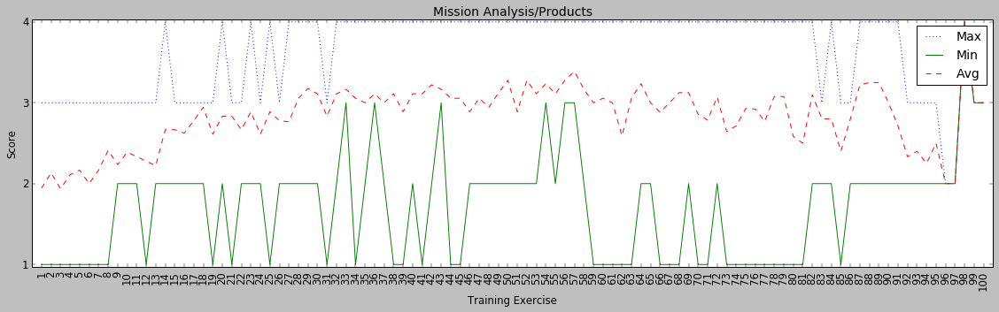

Ground Ops
GroundOps


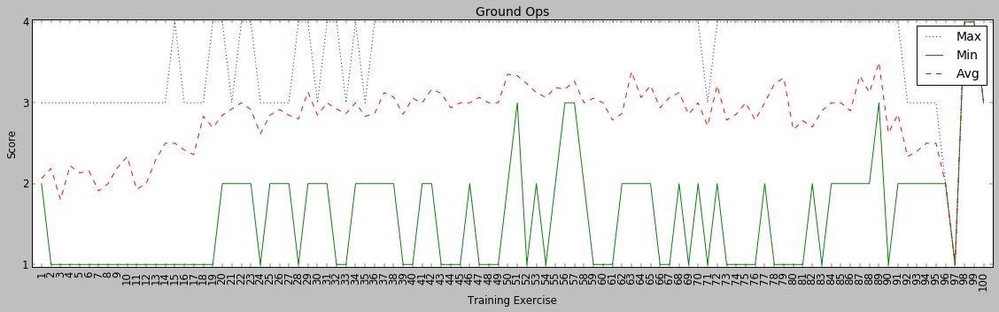

Takeoff
Takeoff


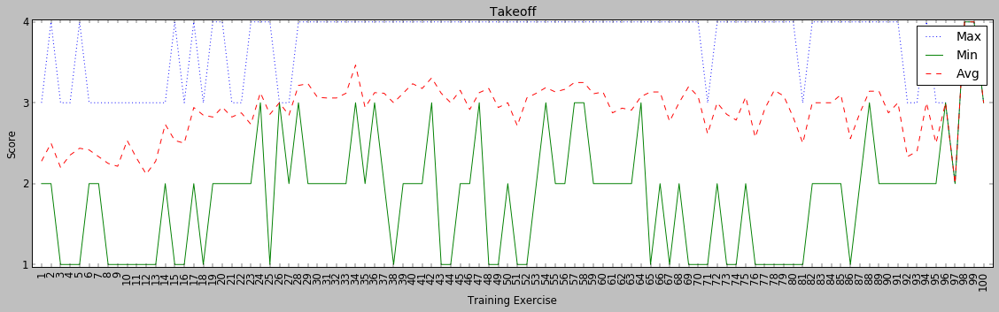

Departure
Departure


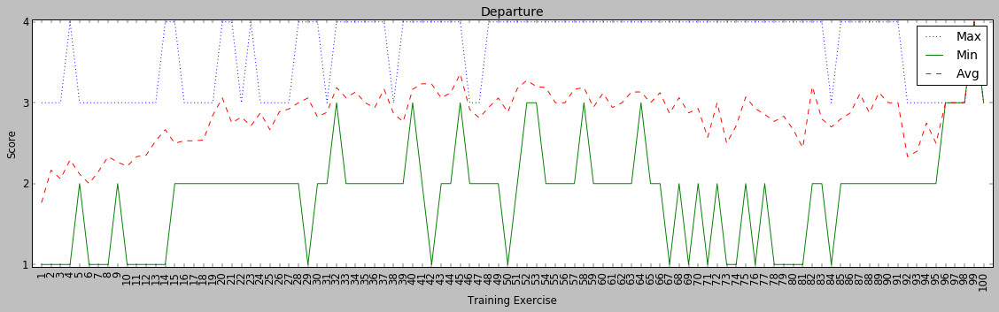

Basic Aircraft Control
BasicAircraftControl


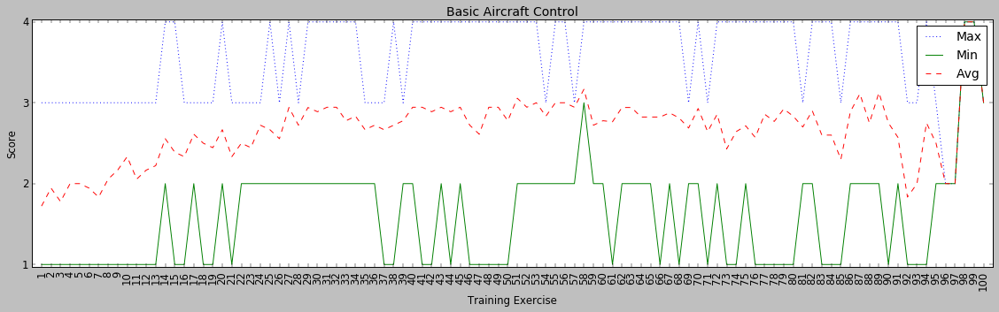

Cross-Check
Cross-Check


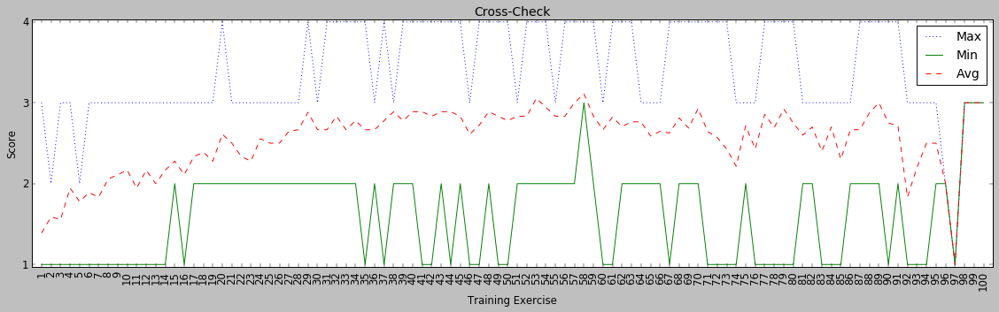

Enroute Descent / Recovery
EnrouteDescentRecovery


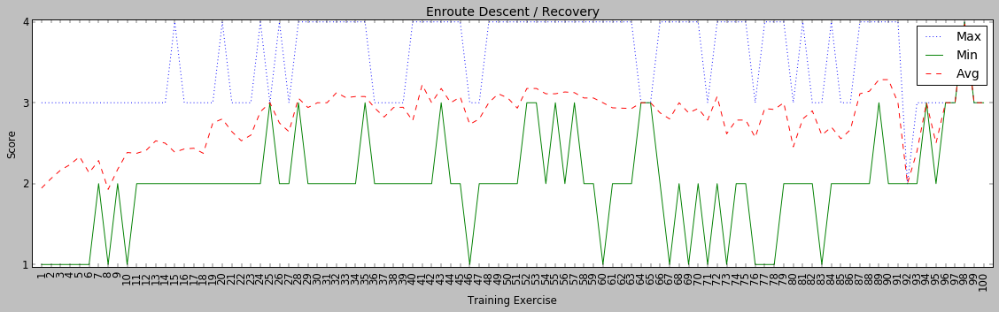

Inflight Checks
InflightChecks


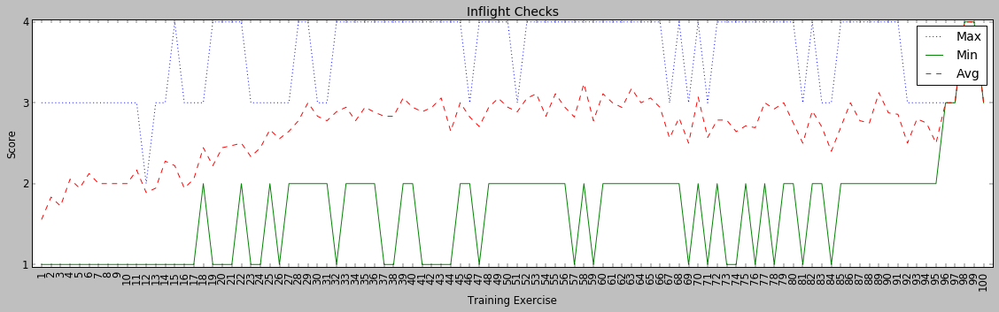

Inflight Planning
InflightPlanning


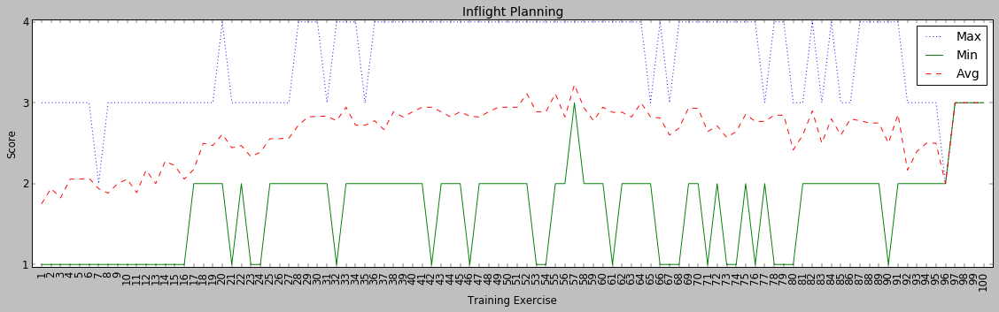

Clearing / Visual Lookout
ClearingVisualLookout


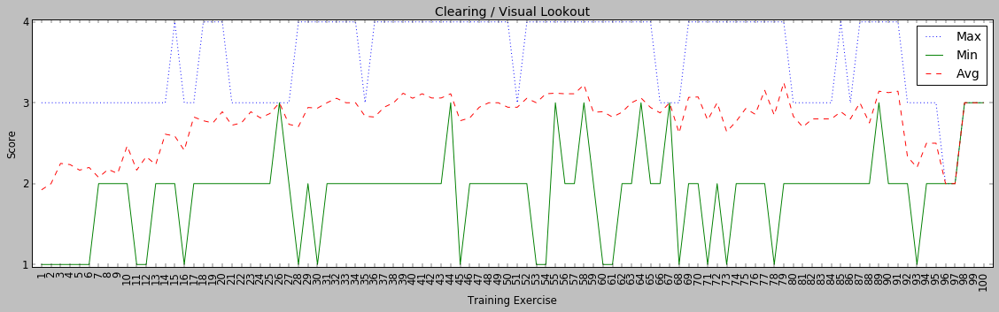

Communication
Communication


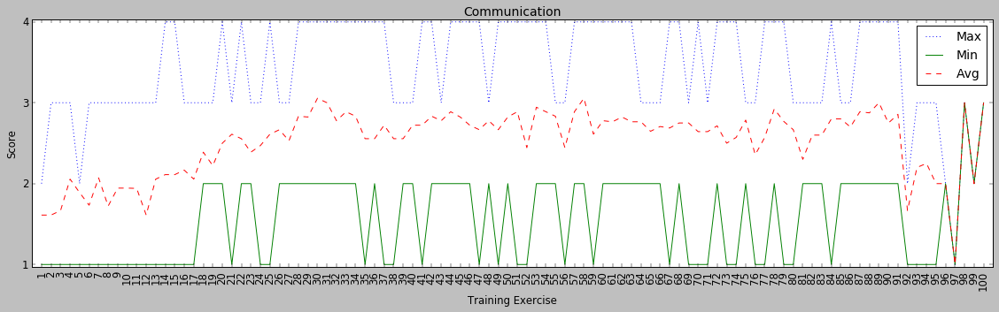

Risk Mgmt / Decision Making
RiskMgmtDecisionMaking


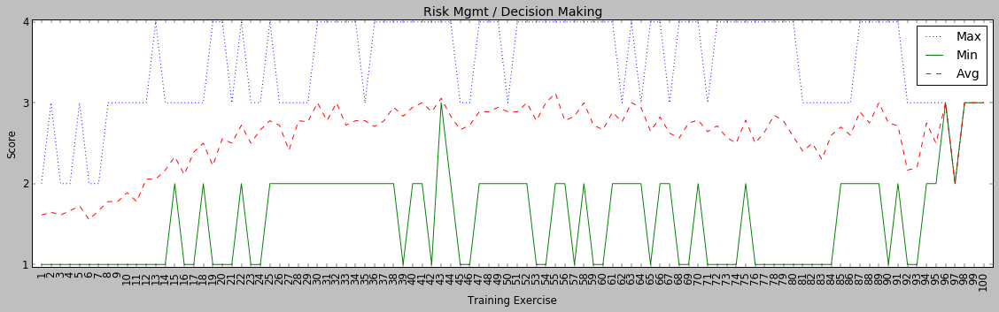

Situational Awareness
SituationalAwareness


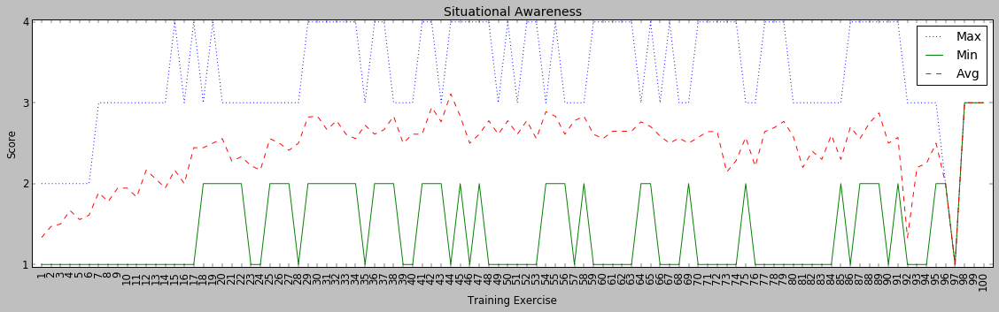

Task Management
TaskManagement


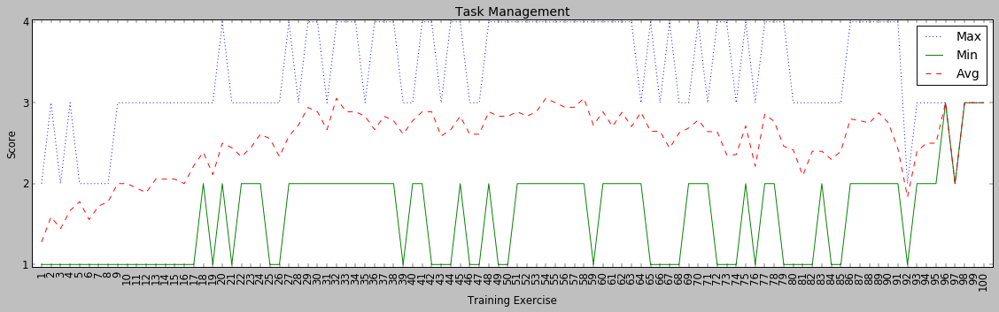

Emergency Procedures
EmergencyProcedures


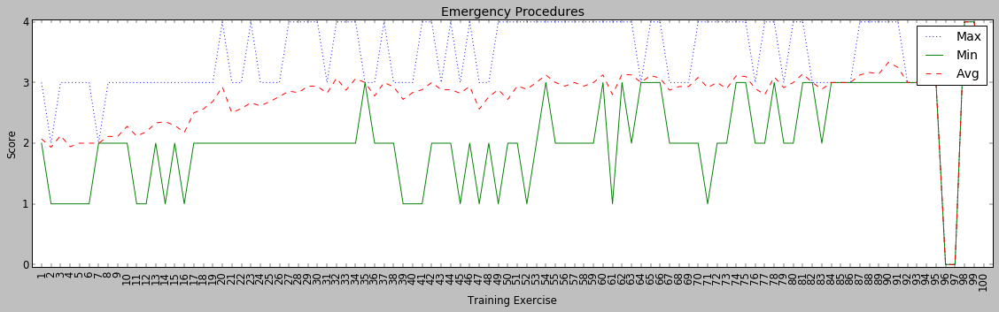

General Knowledge
GeneralKnowledge


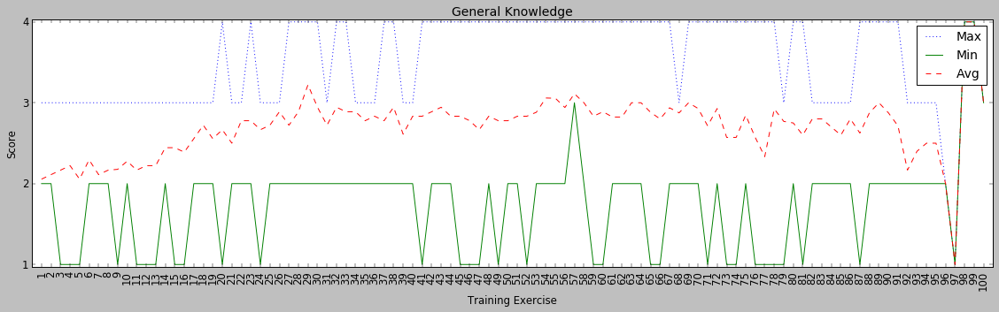

In [31]:
x = np.arange(1, maxExercises+1)
for names in basicManeuverNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Overhead/Closed Pattern
OverheadClosedPattern


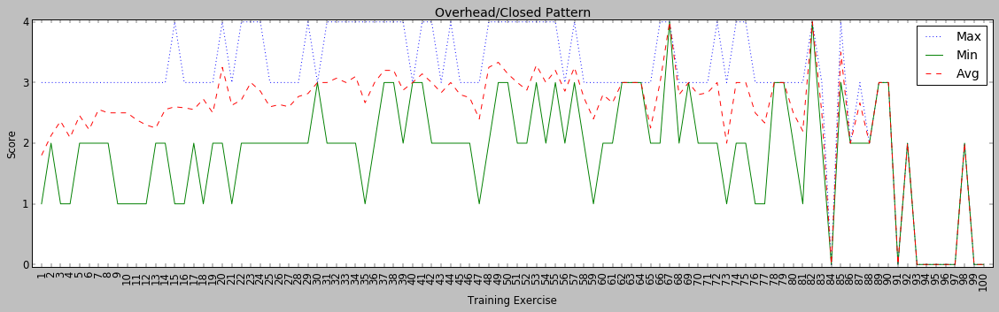

Visual St-In
VisualSt-In


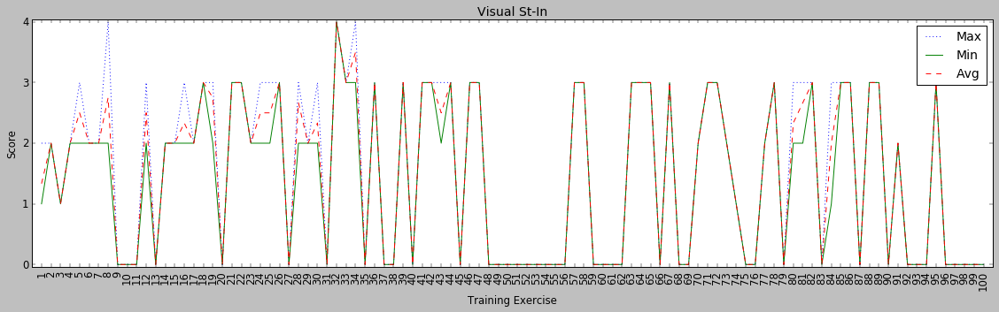

Landing
Landing


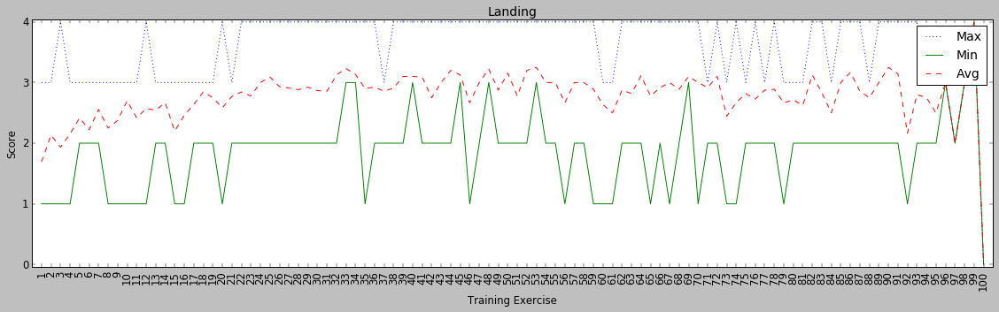

No-Flap Landing
No-FlapLanding


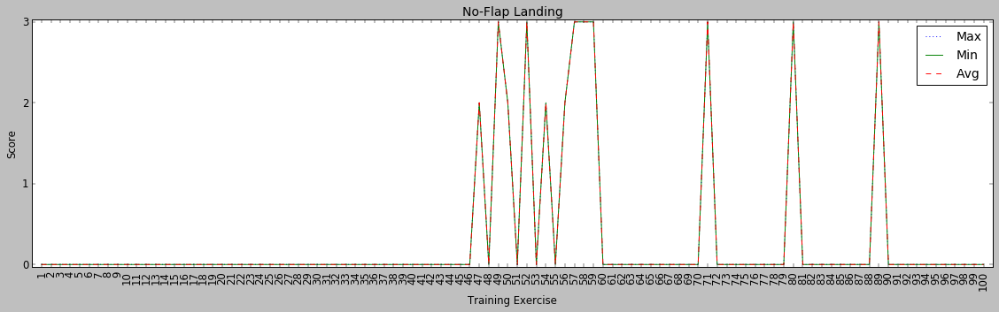

Go-Around
Go-Around


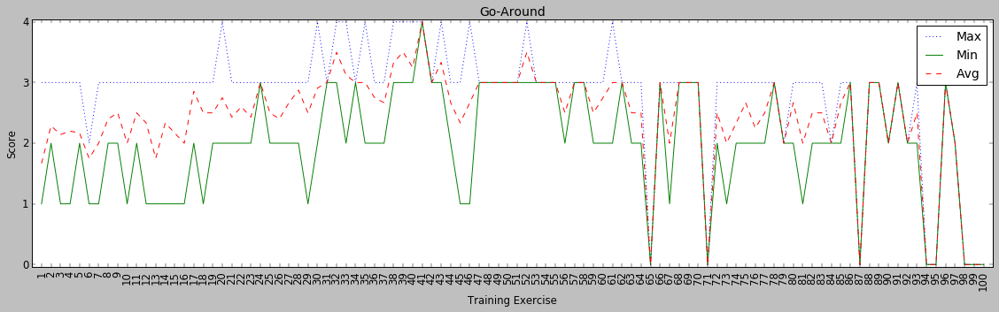

Emergency Landing Pattern
EmergencyLandingPattern


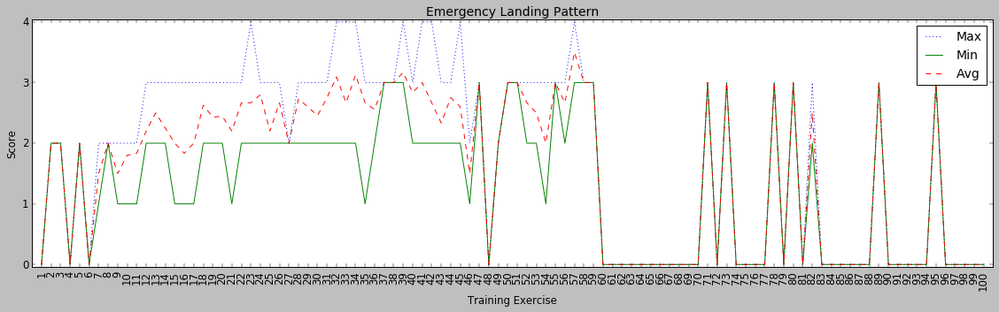

In [32]:
x = np.arange(1, maxExercises+1)
for names in patternsNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

G-Awareness
G-Awareness


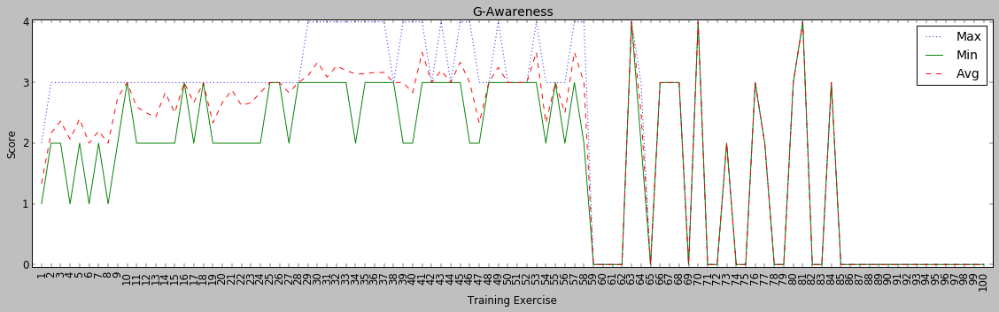

TP Stalls
TPStalls


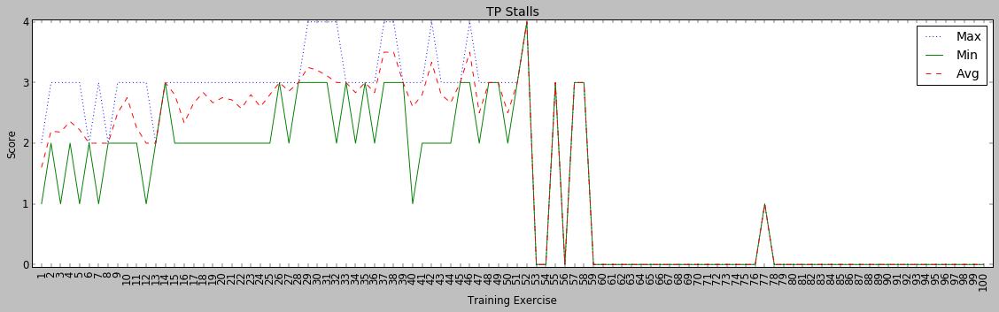

Slow Flight
SlowFlight


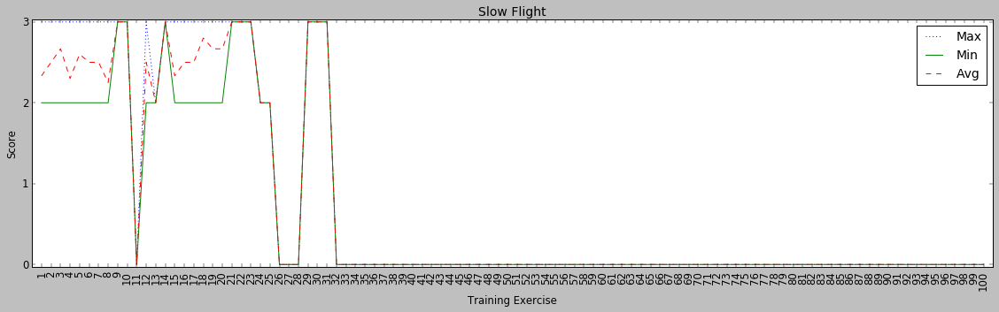

Power On Stalls
PowerOnStalls


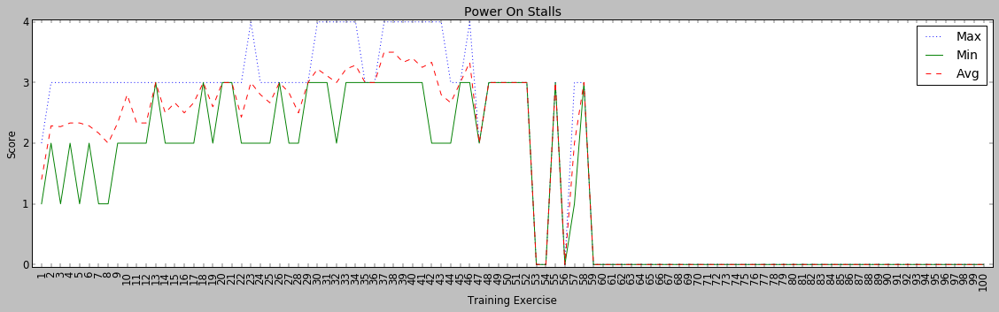

Contact Recoveries
ContactRecoveries


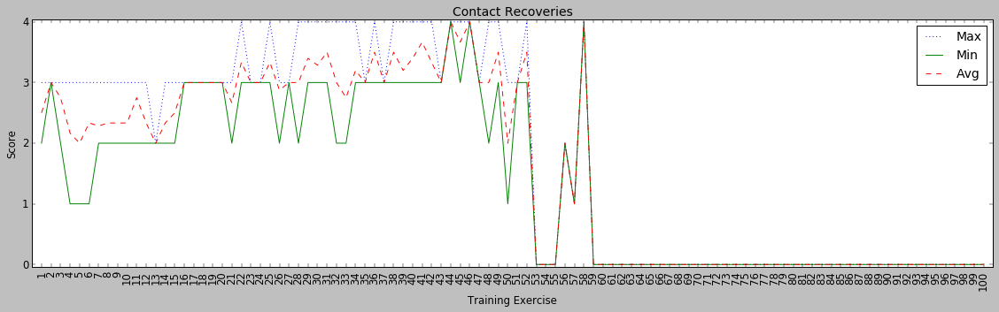

Spin Recovery
SpinRecovery


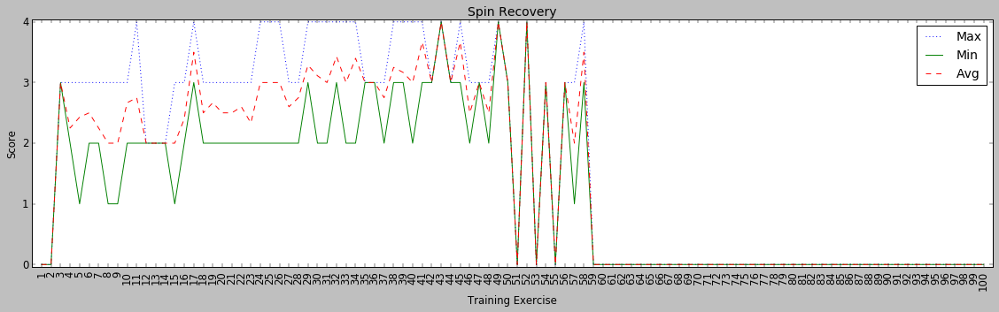

Aileron Roll
AileronRoll


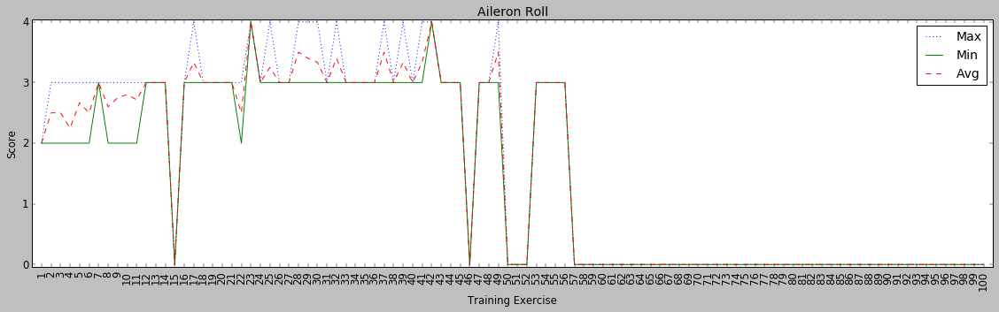

Barrel Roll
BarrelRoll


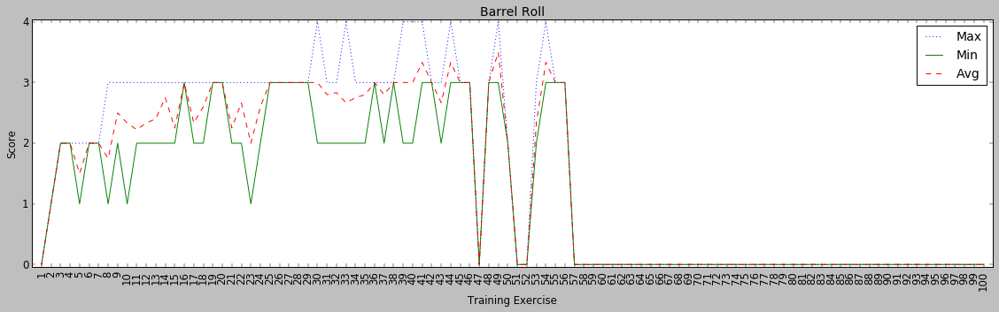

Pitchback / Sliceback
PitchbackSliceback


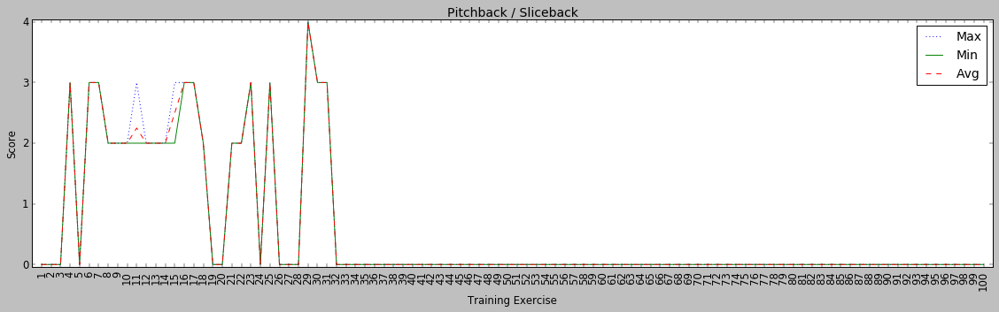

Cloverleaf
Cloverleaf


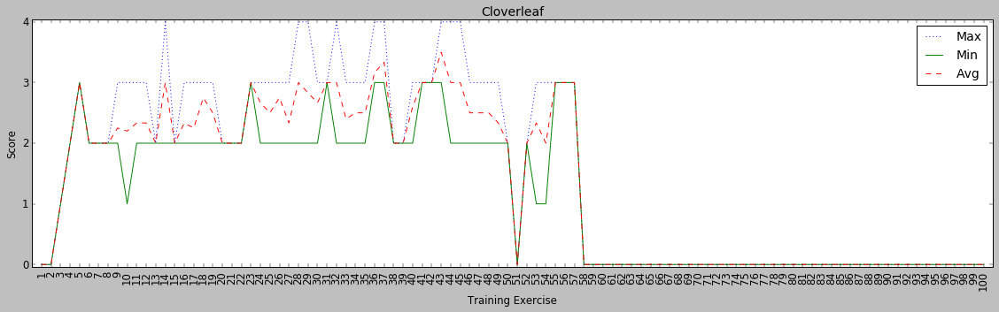

Cuban Eight
CubanEight


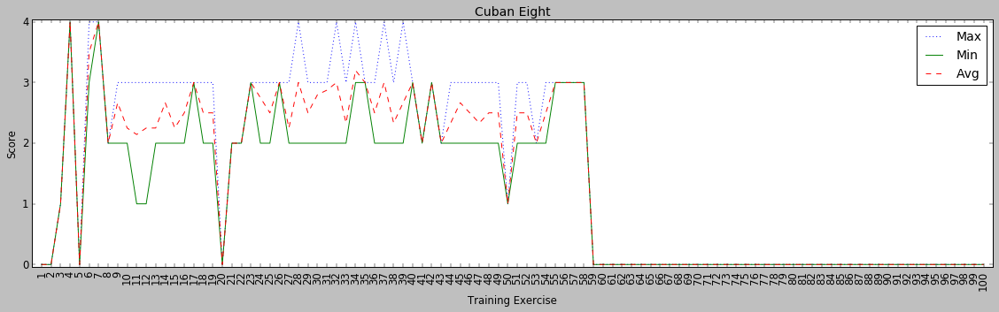

Immelmann
Immelmann


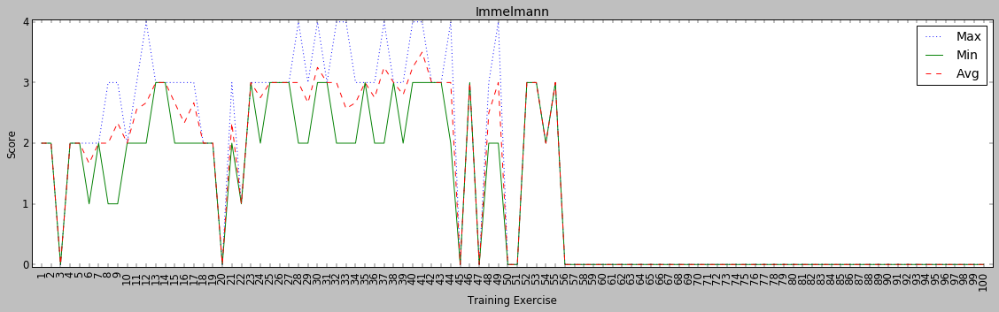

Lazy Eight
LazyEight


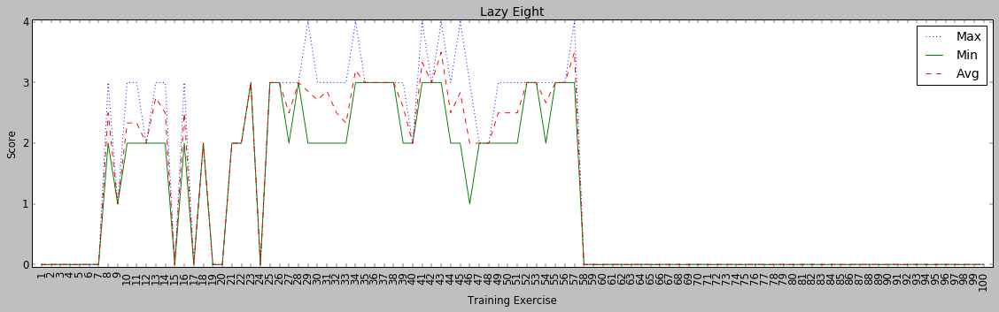

Loop
Loop


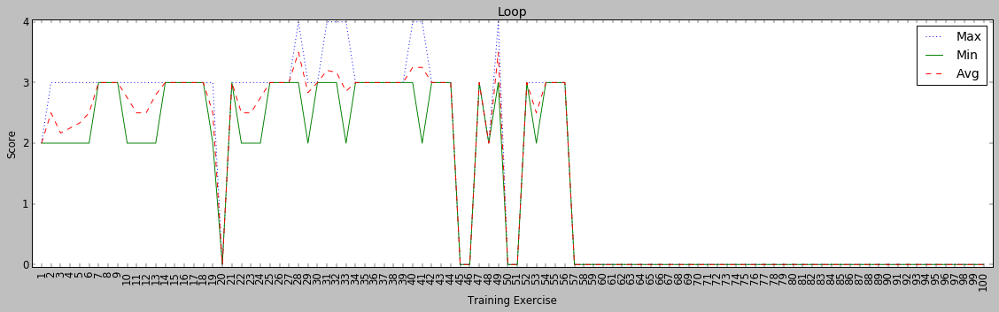

Split S
SplitS


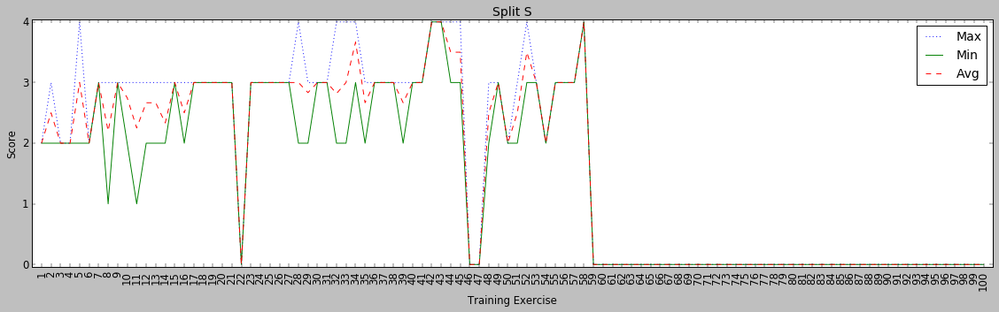

In [33]:
x = np.arange(1, maxExercises+1)
for names in contactNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Vertical S
VerticalS


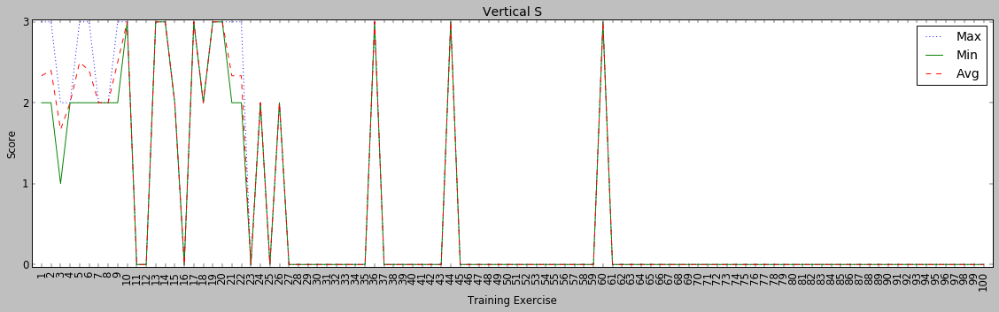

Unusual Attitudes
UnusualAttitudes


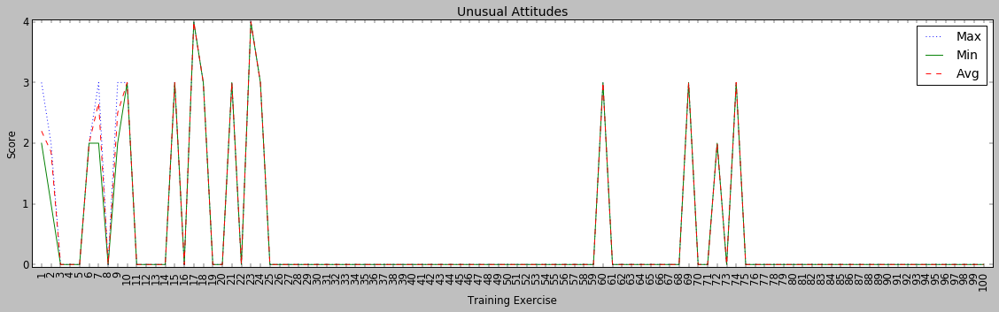

Steep Turns
SteepTurns


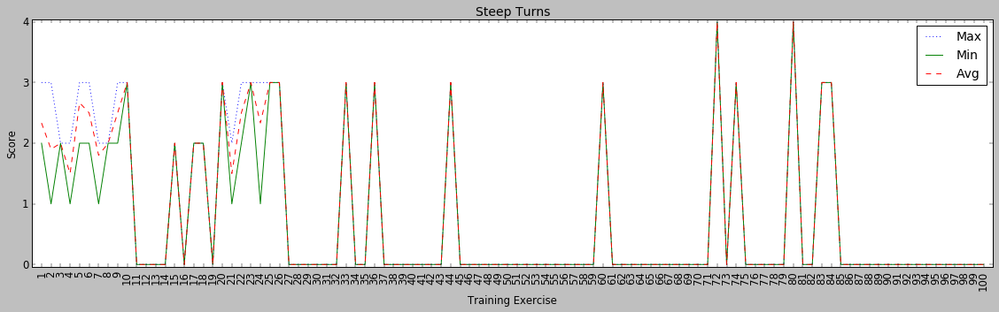

Intercept / Maintain Arc
InterceptMaintainArc


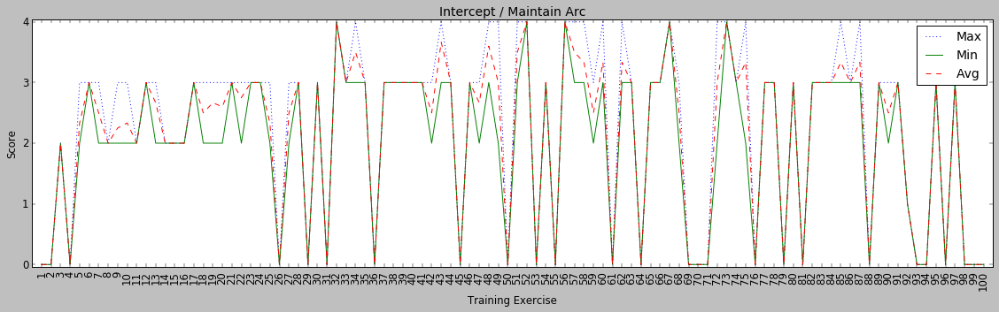

Fix to Fix
FixtoFix


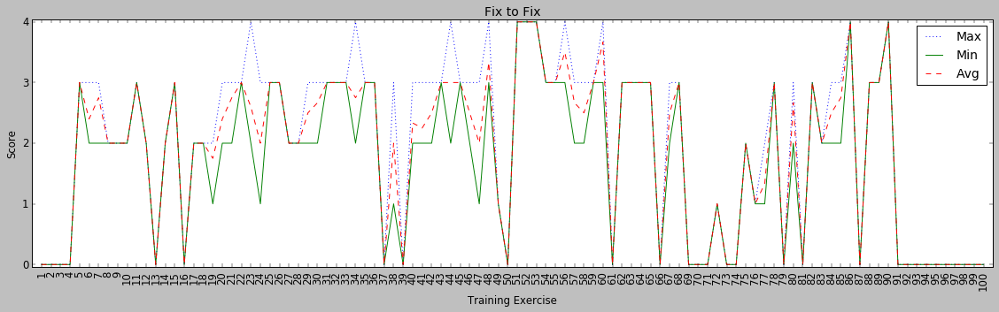

Holding
Holding


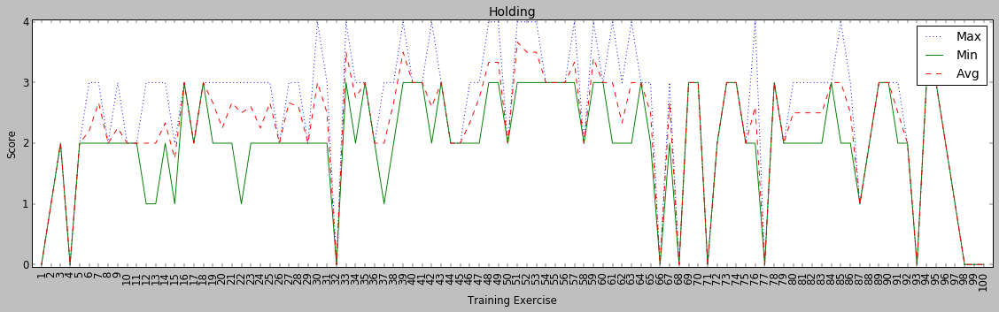

Full Procedure Approach
FullProcedureApproach


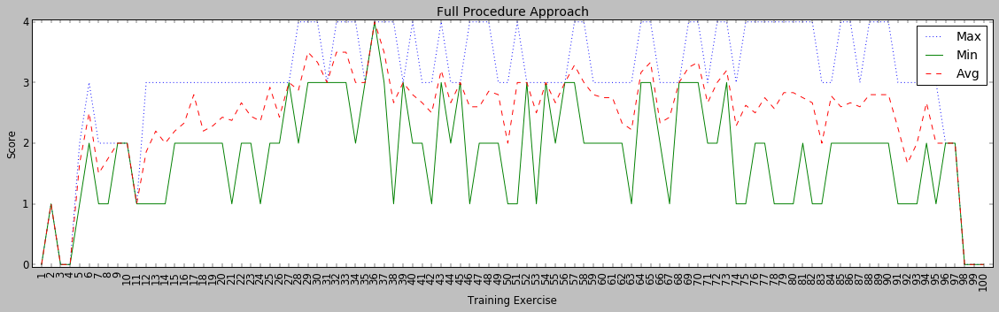

Non-Precision Final
Non-PrecisionFinal


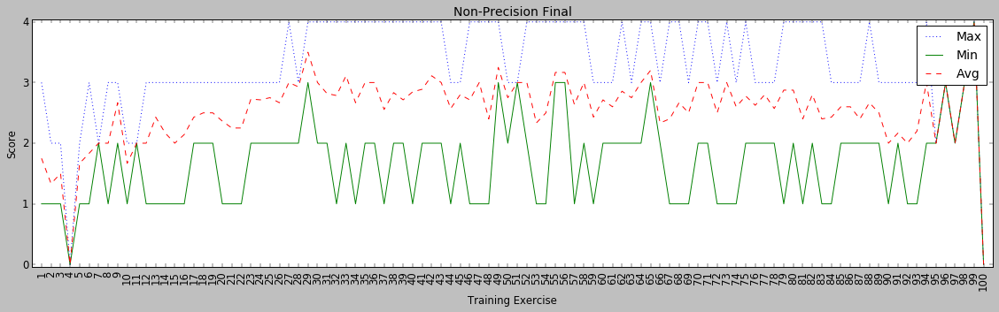

Precision Final
PrecisionFinal


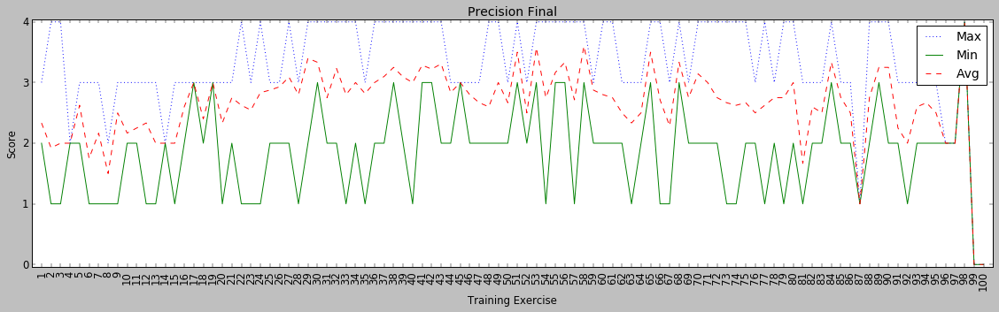

Circling Approach
CirclingApproach


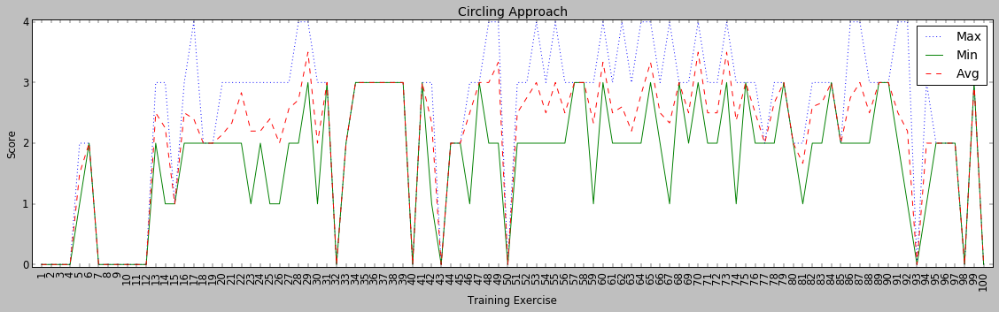

Missed Approach
MissedApproach


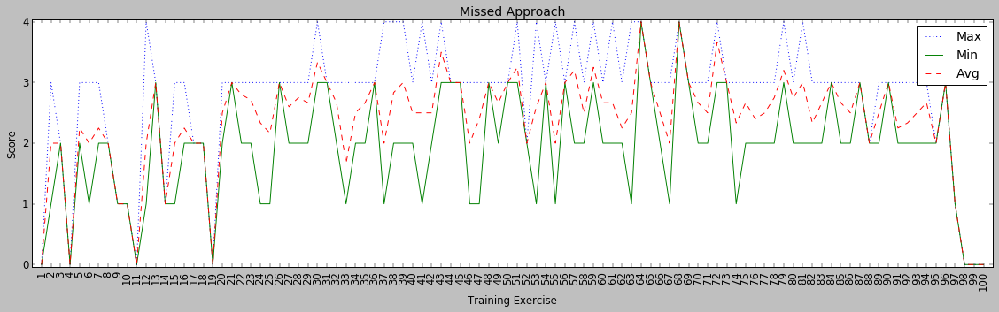

Night Landing
NightLanding


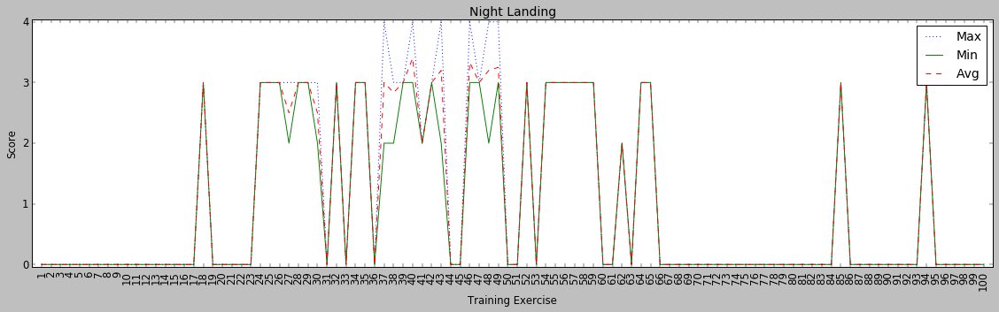

In [34]:
x = np.arange(1, maxExercises+1)
for names in instrumentNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Wing Takeoff
WingTakeoff


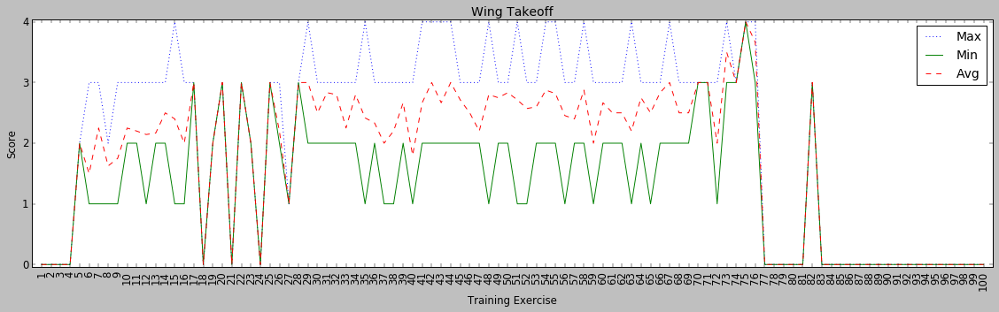

Interval Takeoff
IntervalTakeoff


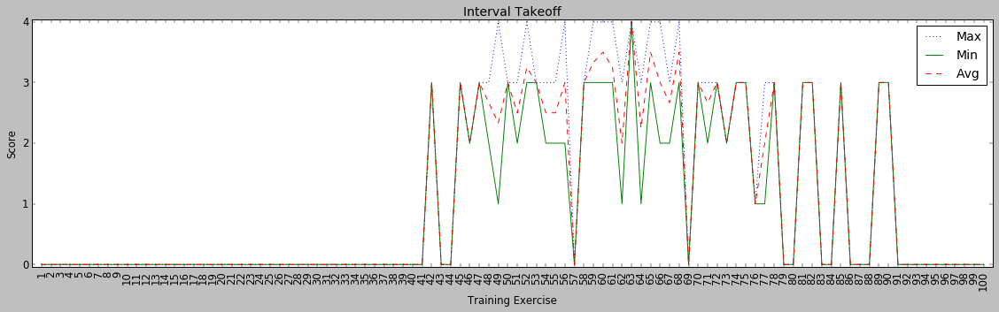

Instrument Trail
InstrumentTrail


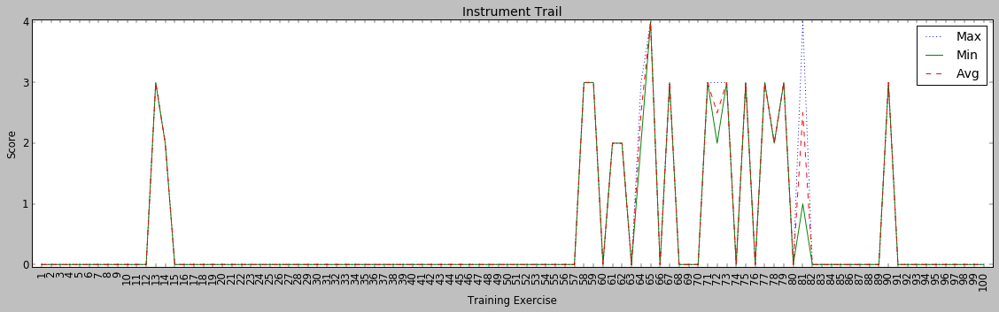

G-Warmup / Awareness
G-WarmupAwareness


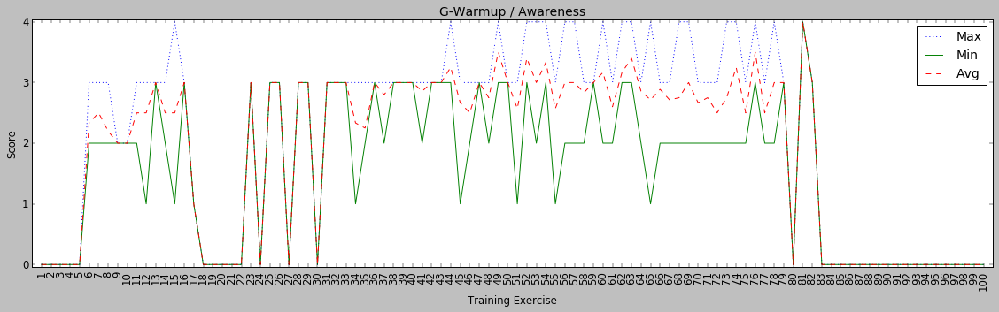

Lead Platform
LeadPlatform


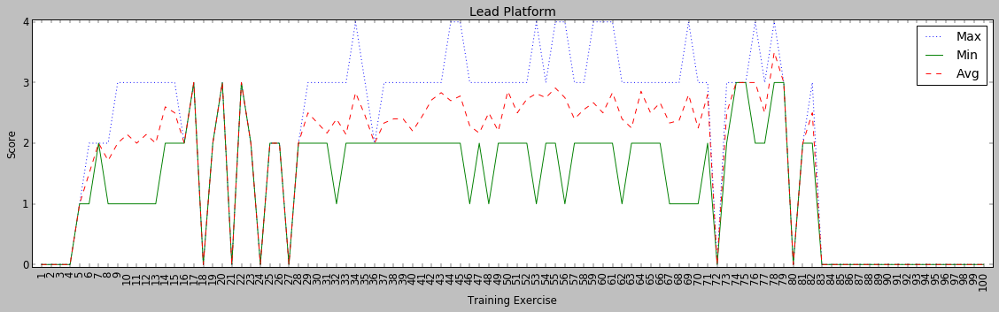

Pitchout (Both)
PitchoutBoth


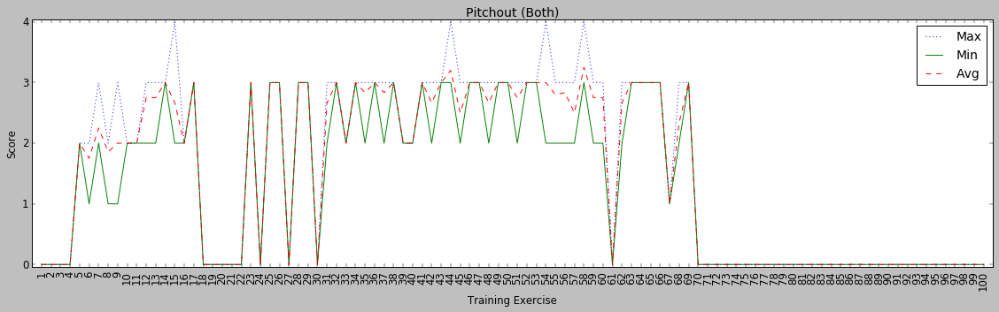

Fingertip (Wing)
FingertipWing


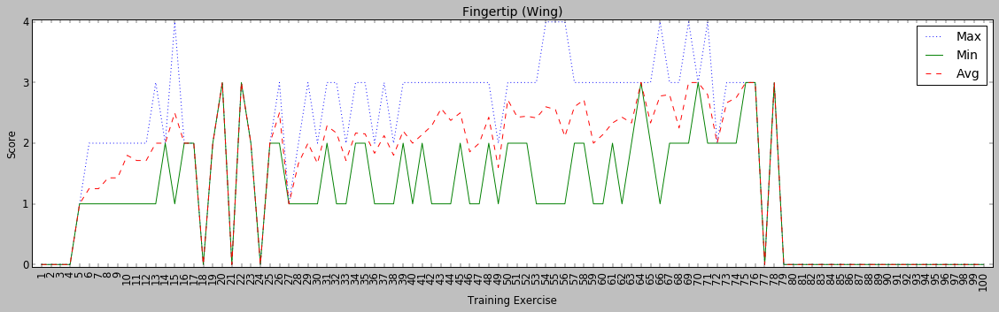

Route (Wing)
RouteWing


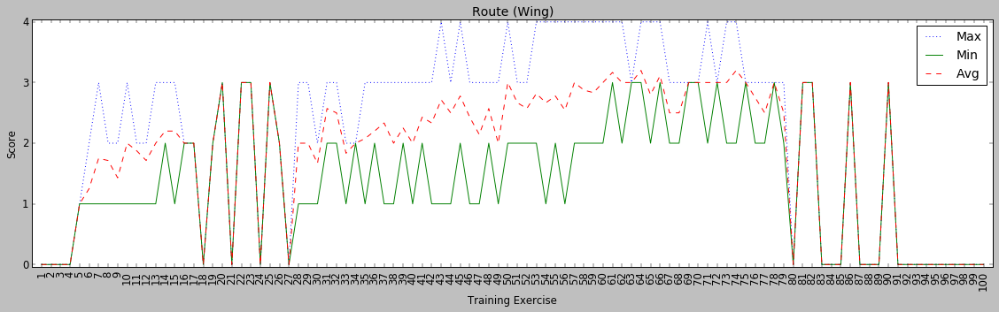

Fighting Wing (Wing)
FightingWingWing


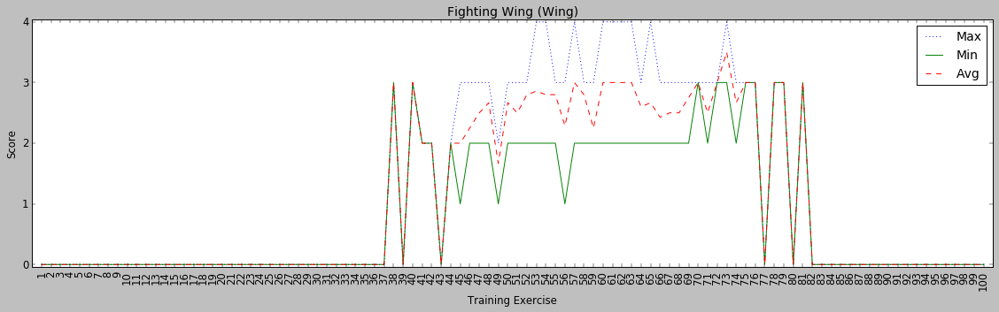

Straight Ahead Rejoin
StraightAheadRejoin


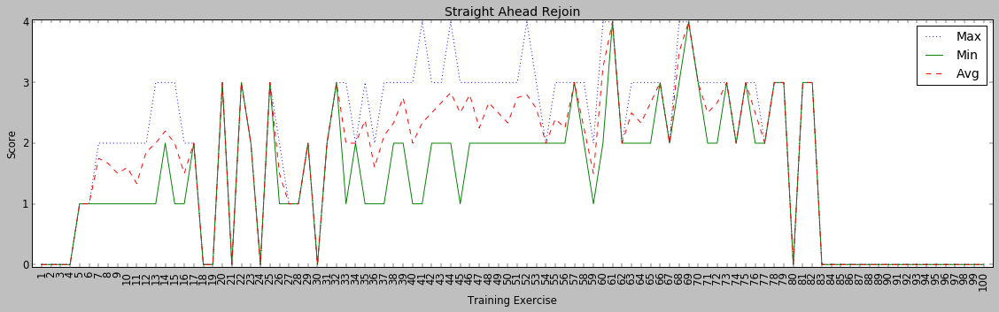

Turning Rejoin
TurningRejoin


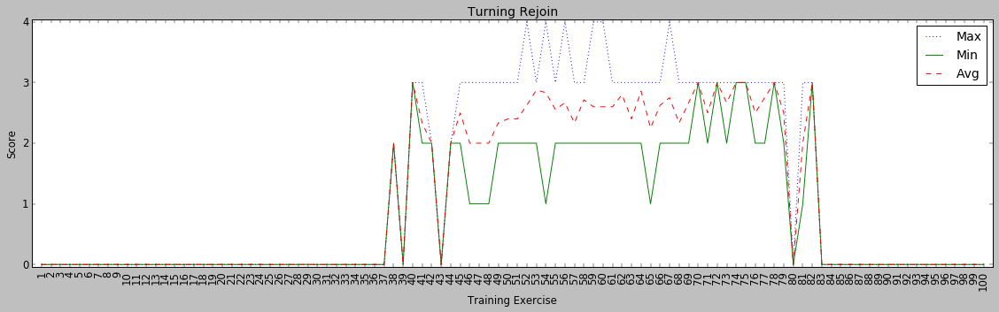

Overshoot
Overshoot


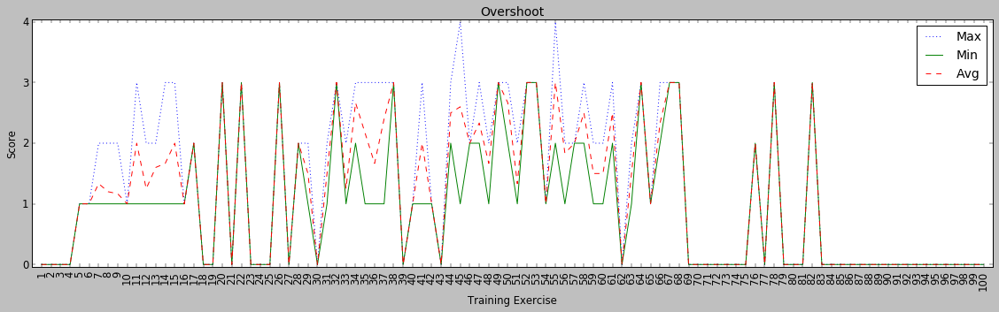

Echelon (Wing)
EchelonWing


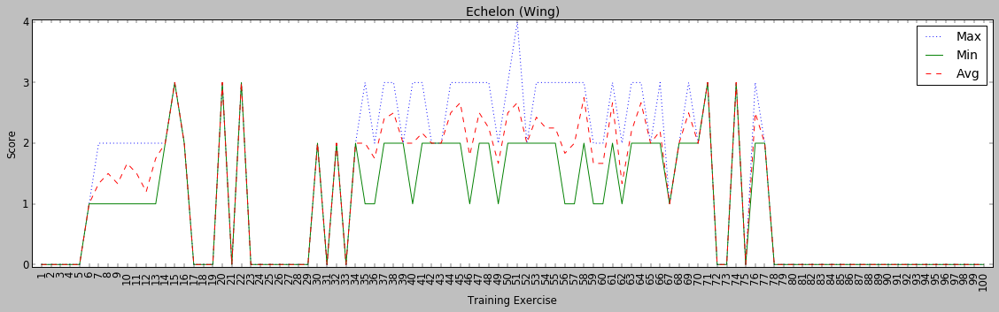

Breakout (Wing)
BreakoutWing


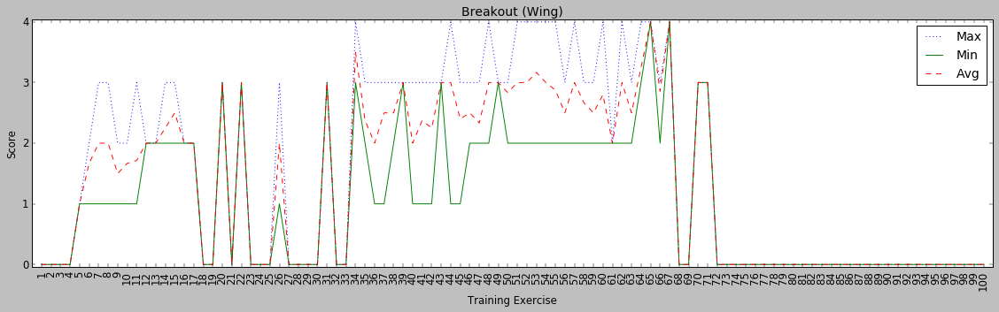

Lost Wingman (Both)
LostWingmanBoth


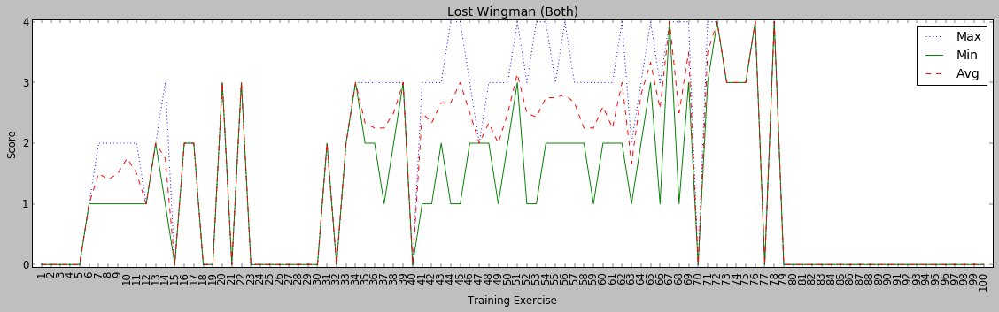

Extended Trail (Wing)
ExtendedTrailWing


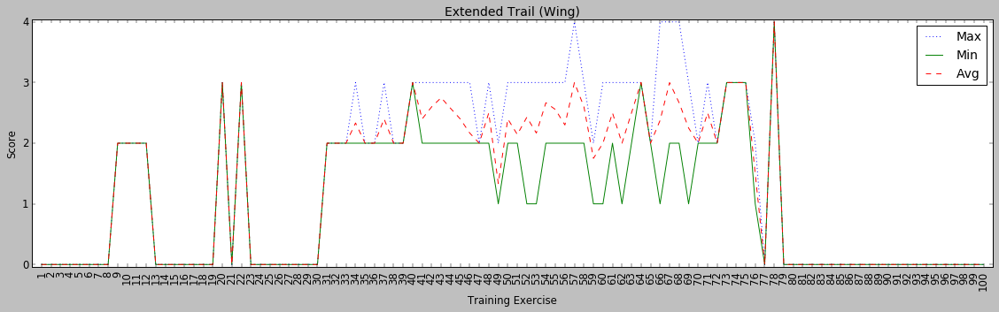

Position Change
PositionChange


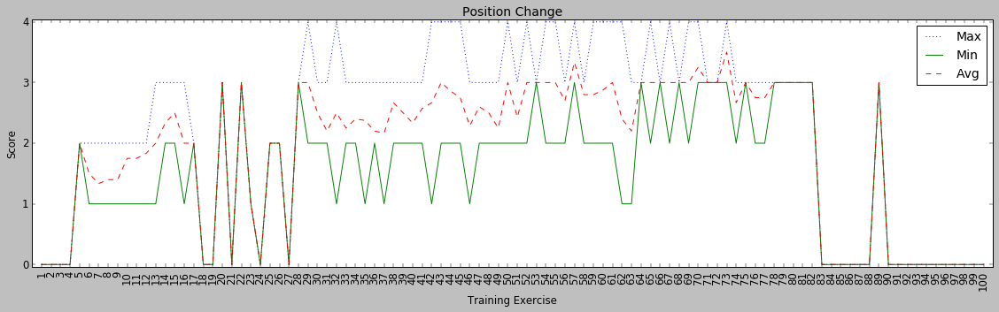

Formation Approach (Both)
FormationApproachBoth


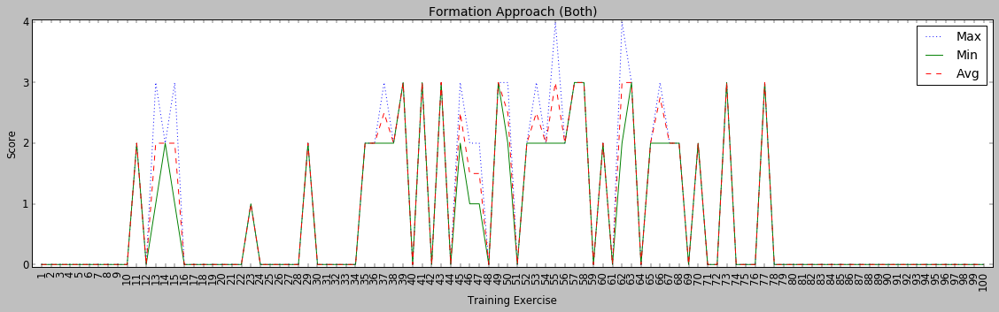

Formation Landing (Both)
FormationLandingBoth


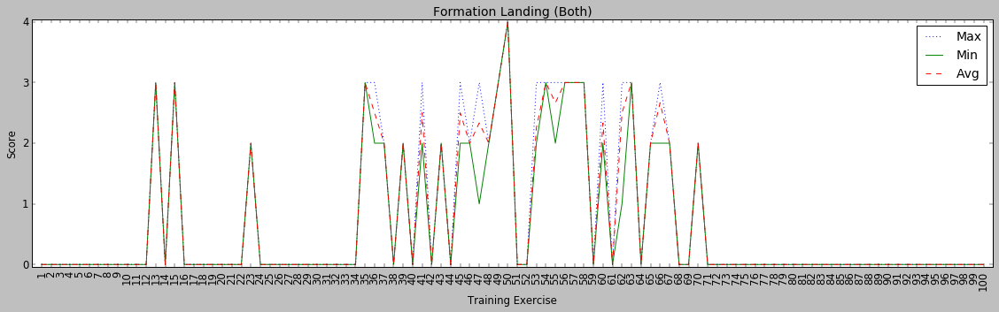

Battle Damage Check
BattleDamageCheck


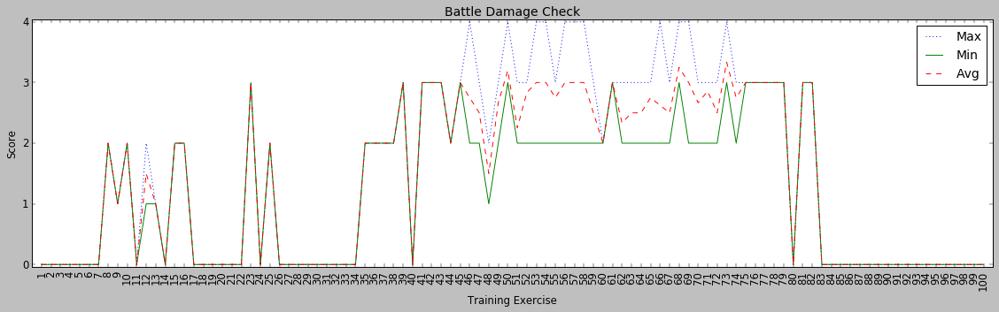

Flt Integrity / Wingman Consideration
FltIntegrityWingmanConsideration


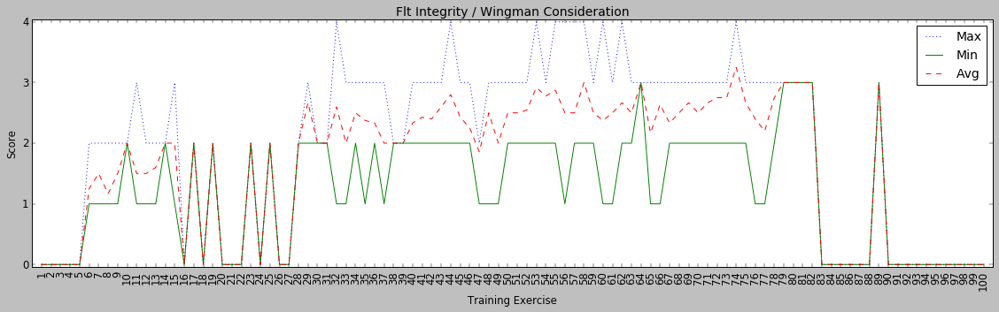

In [35]:
x = np.arange(1, maxExercises+1)
for names in basicFormationNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Delay 90
Delay90


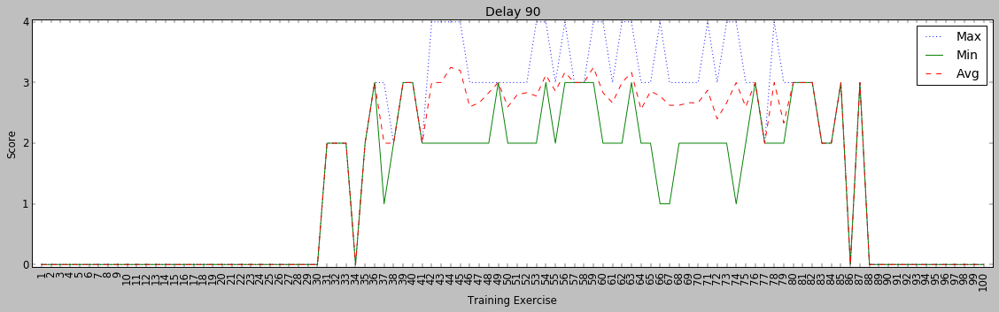

Delay 45
Delay45


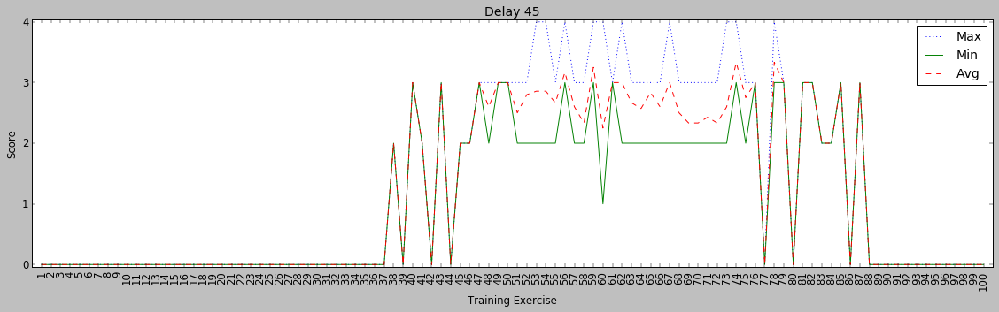

Hook Turn
HookTurn


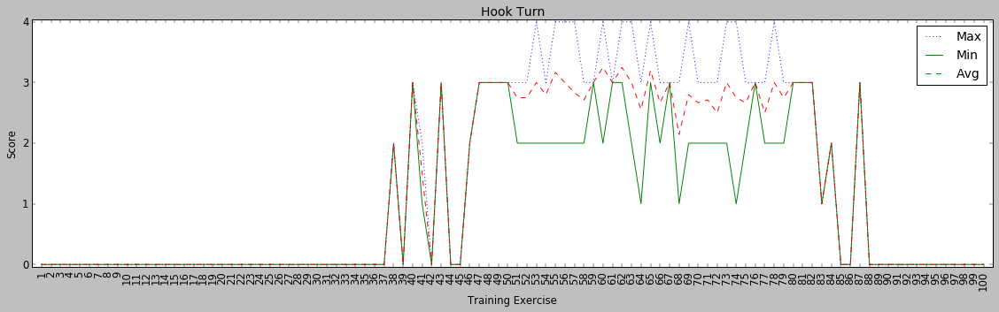

Shackle
Shackle


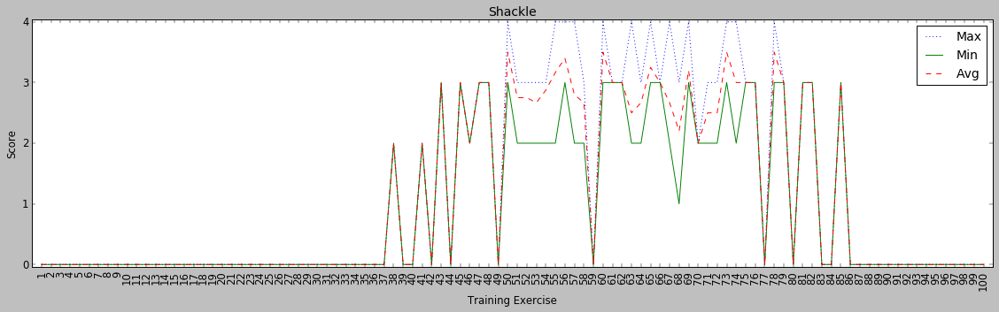

Cross Turn
CrossTurn


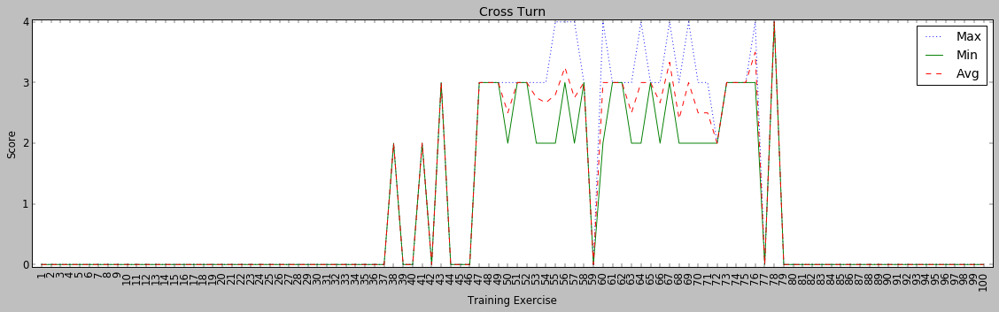

Fluid Turn
FluidTurn


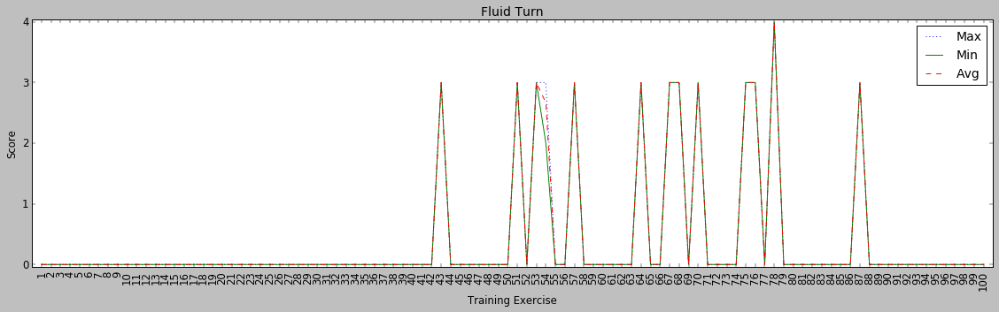

Tactical Rejoins
TacticalRejoins


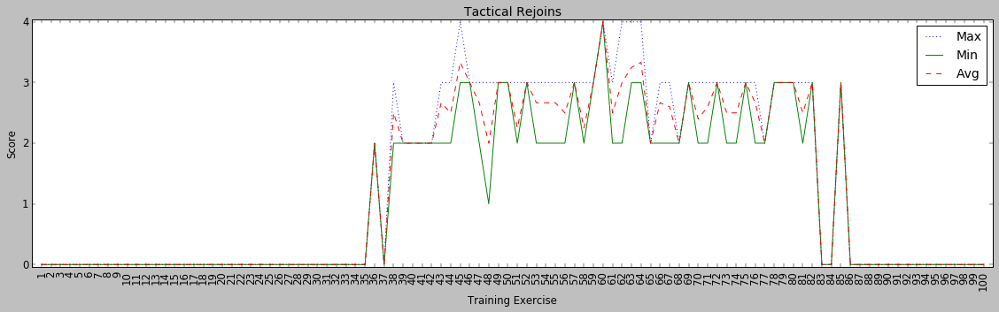

Fluid Maneuvering
FluidManeuvering


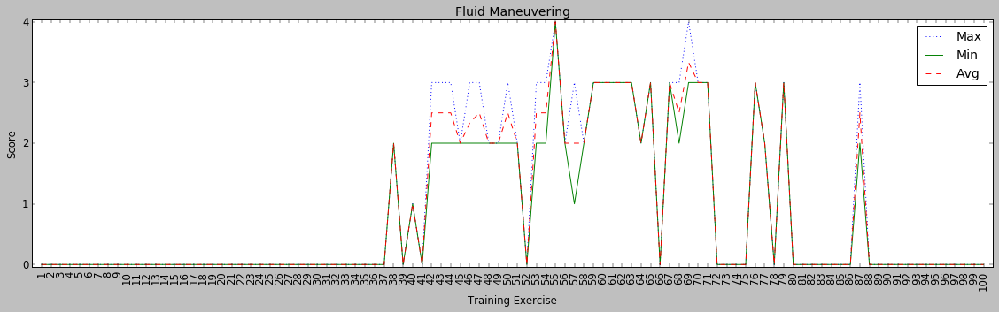

Tac Initial
TacInitial


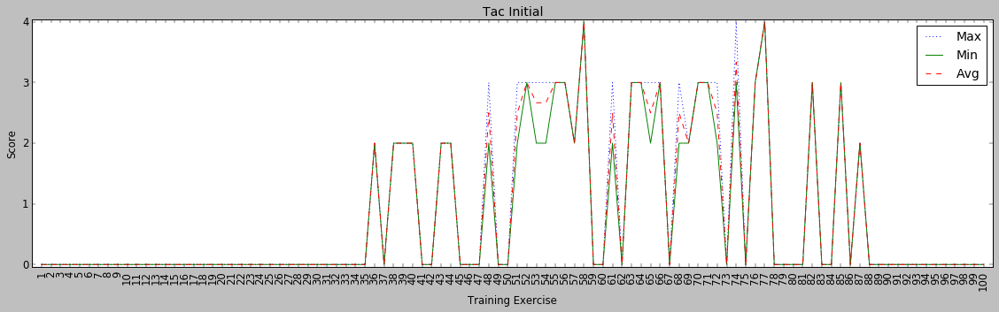

In [36]:
x = np.arange(1, maxExercises+1)
for names in tacticalFormationNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Four Ship Admin
FourShipAdmin


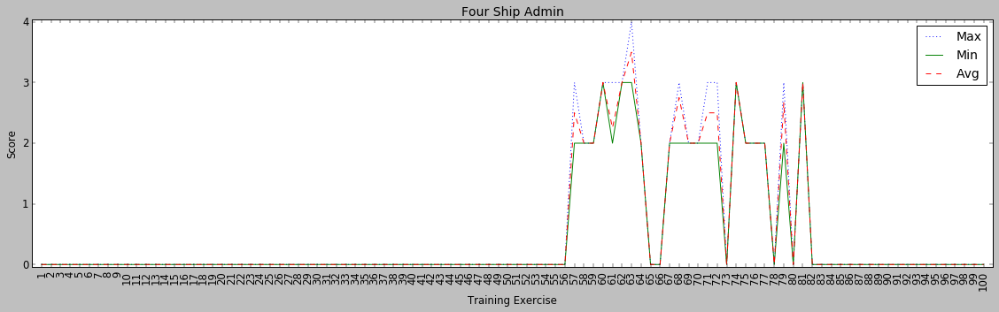

Fluid 4
Fluid4


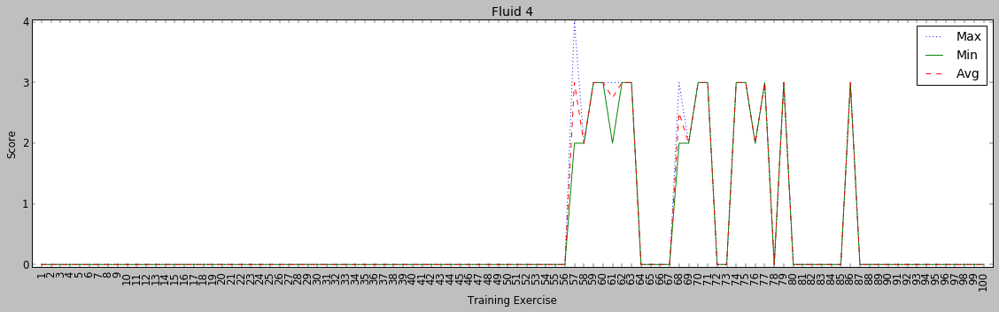

Box Formation
BoxFormation


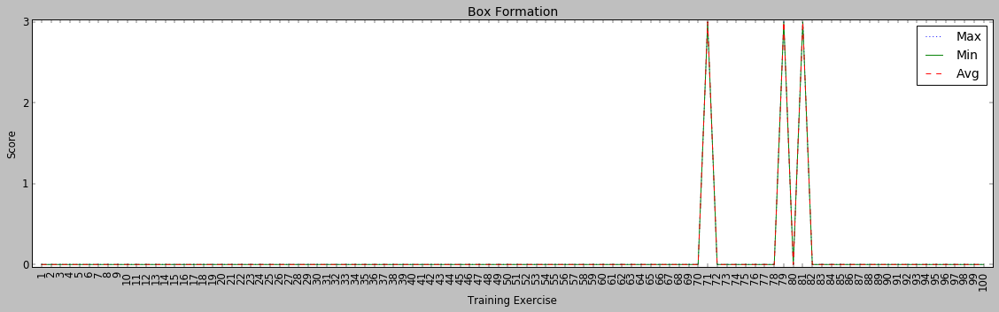

Offset Box
OffsetBox


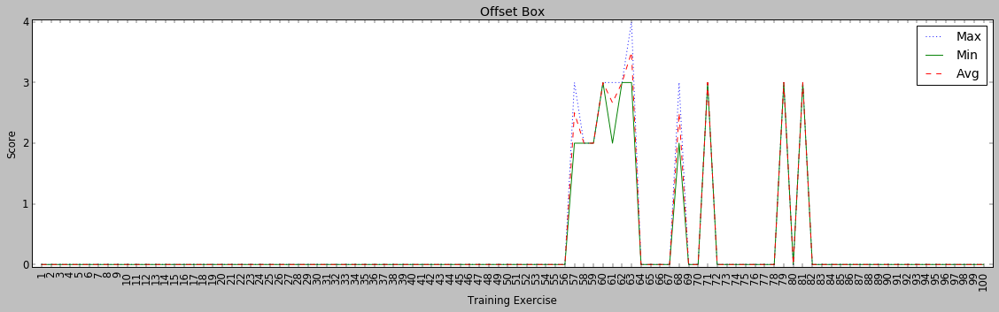

Wall
Wall


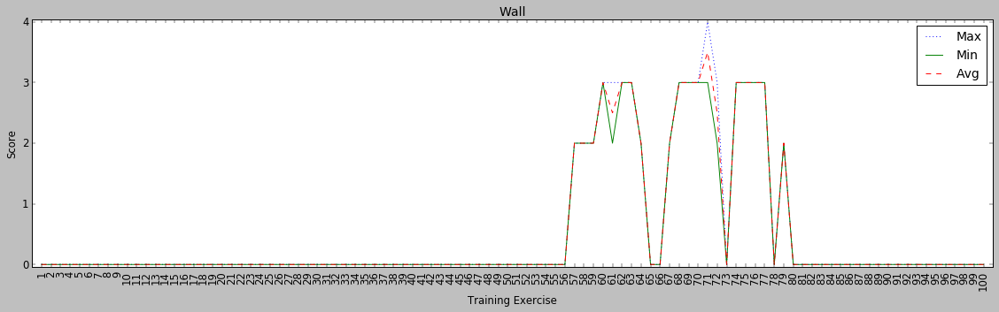

4-Ship Fingertip
4-ShipFingertip


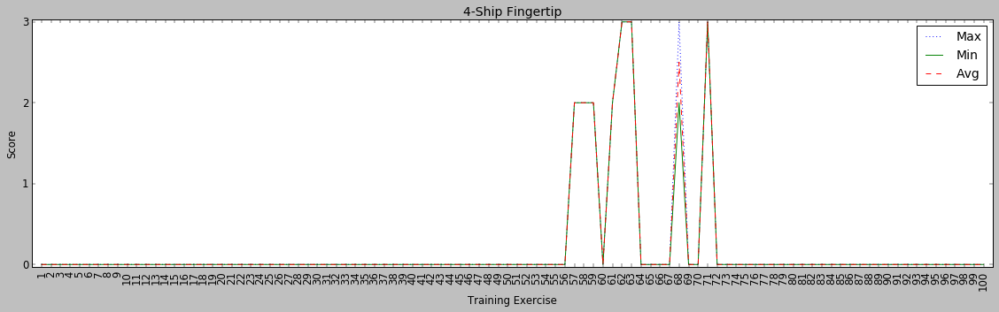

4-Ship Straight Ahead Rejoin
4-ShipStraightAheadRejoin


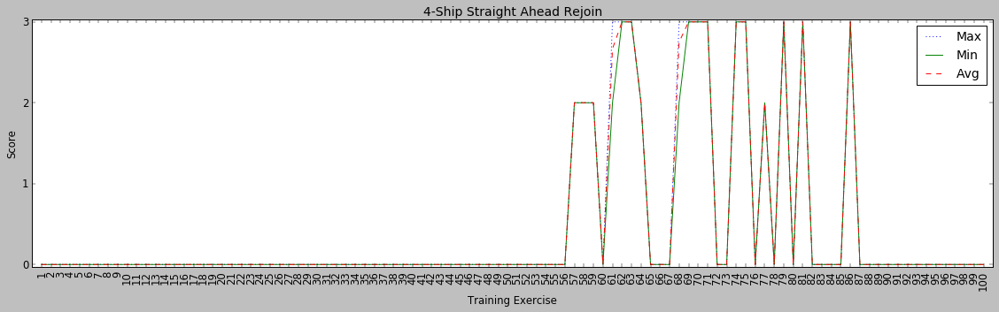

4-Ship Turning Rejoin
4-ShipTurningRejoin


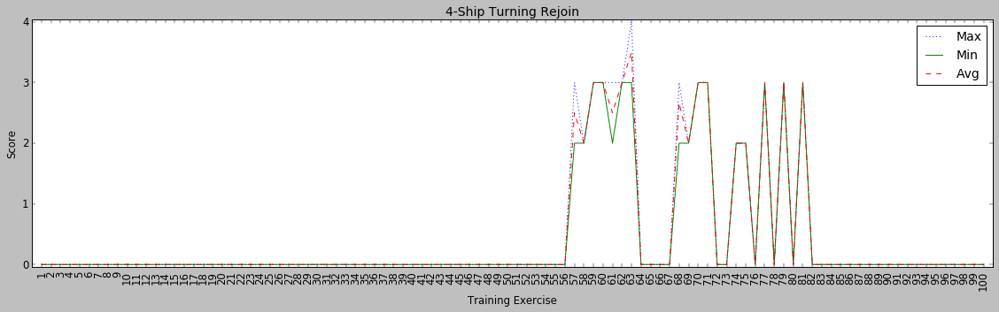

In [37]:
x = np.arange(1, maxExercises+1)
for names in fourShipFormationNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Course Mx
CourseMx


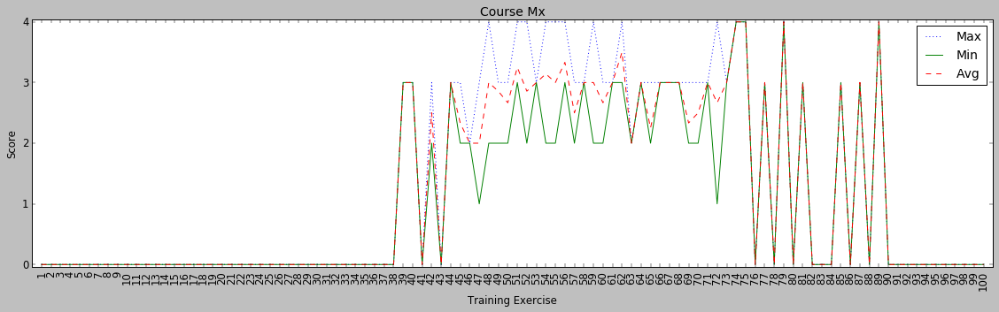

Course Entry
CourseEntry


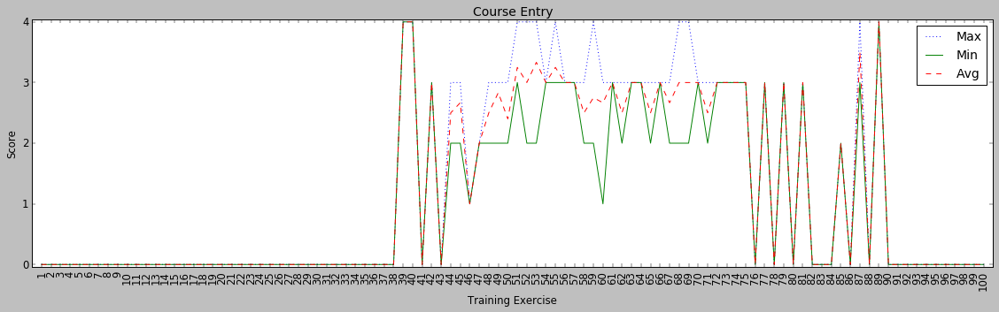

Time Control
TimeControl


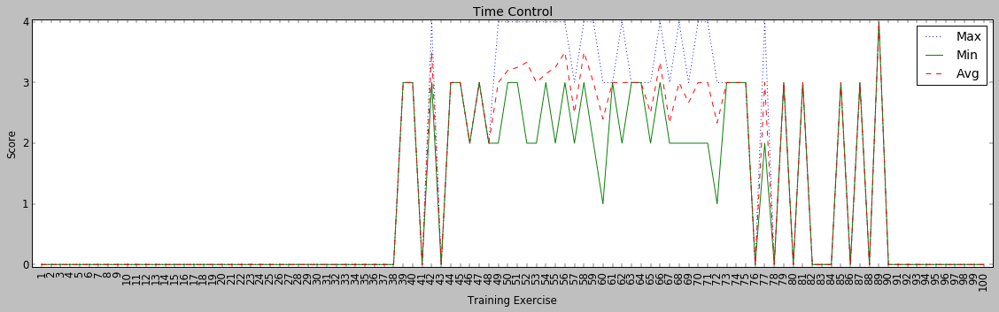

Altitude Control
AltitudeControl


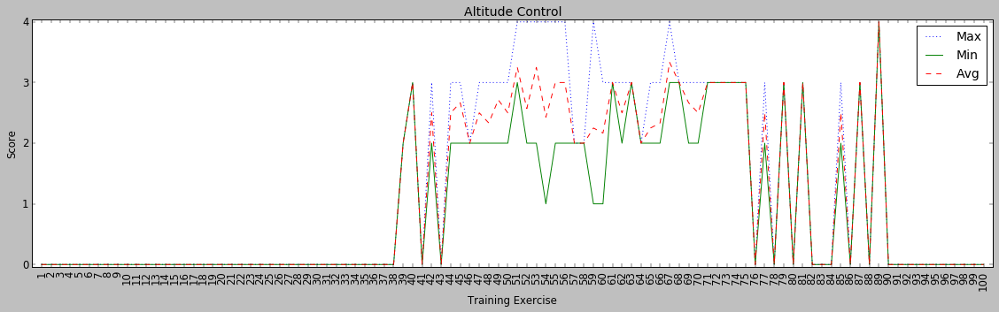

Checkpoint ID
CheckpointID


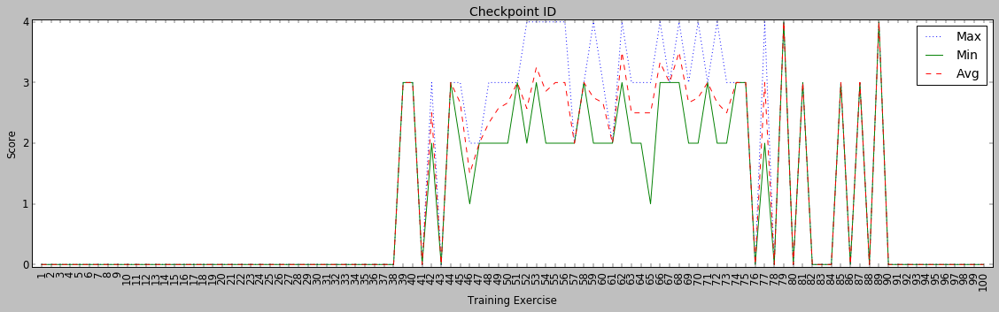

LL GPS Integration
LLGPSIntegration


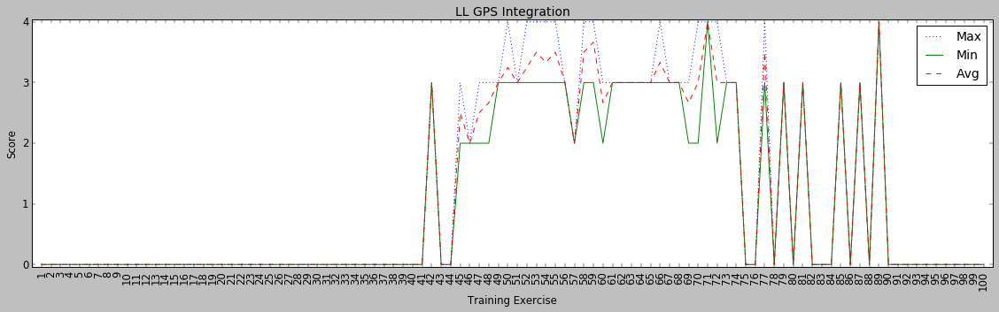

Tactical Maneuvering
TacticalManeuvering


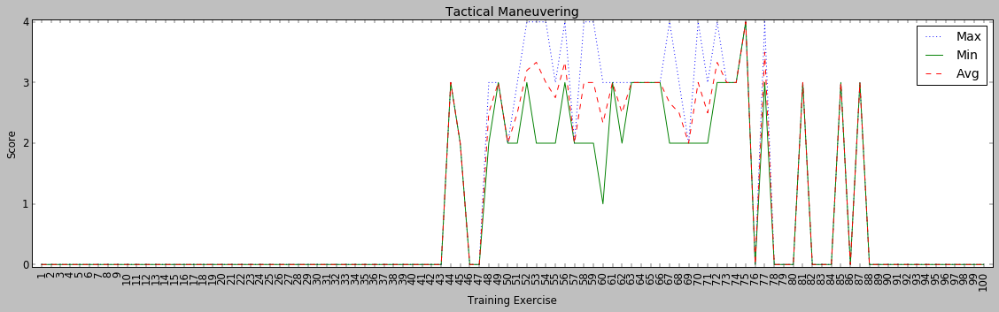

LL Lead Change
LLLeadChange


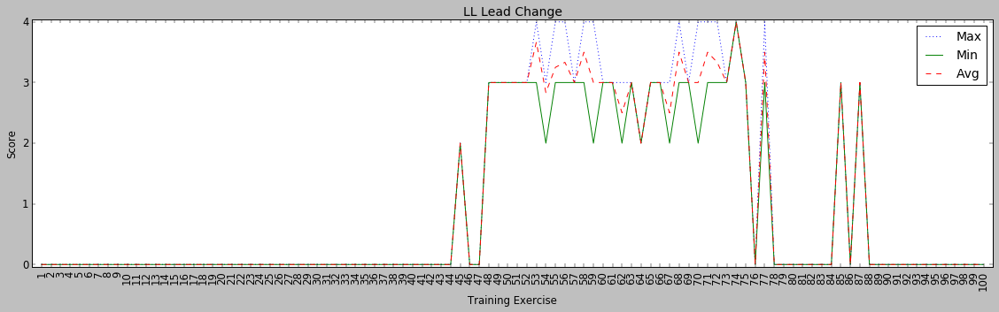

In [38]:
x = np.arange(1, maxExercises+1)
for names in lowLevelNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Heat to Guns Setup
HeattoGunsSetup


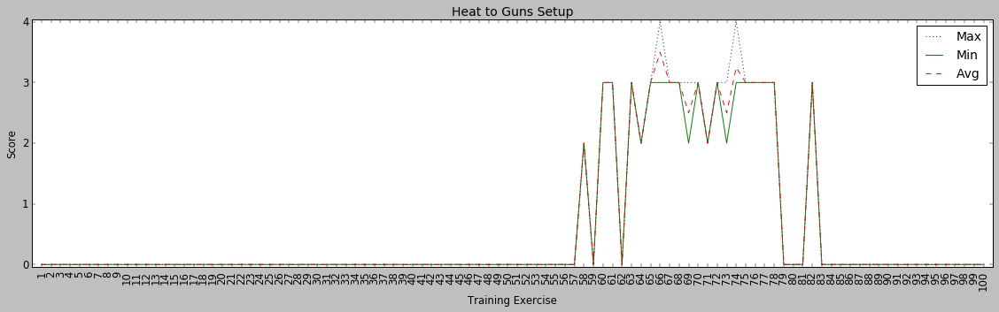

Heat to Guns Maneuvering 
HeattoGunsManeuvering


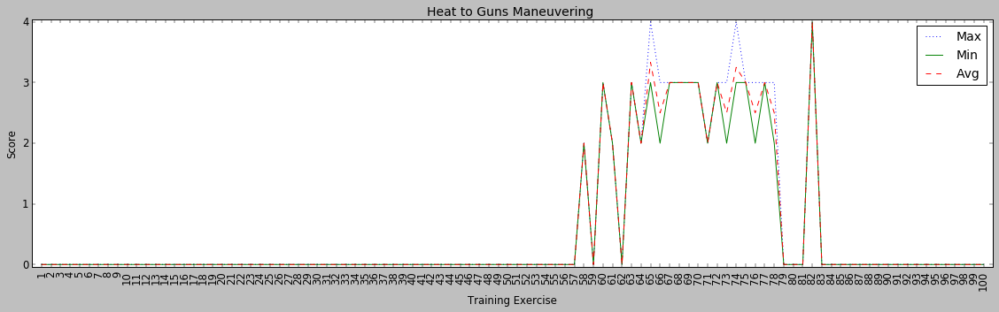

Fuel Awareness/Management
FuelAwarenessManagement


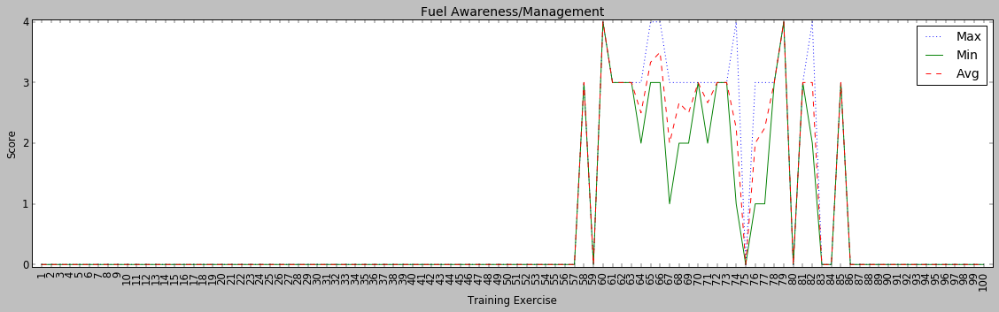

Advanced Handling
AdvancedHandling


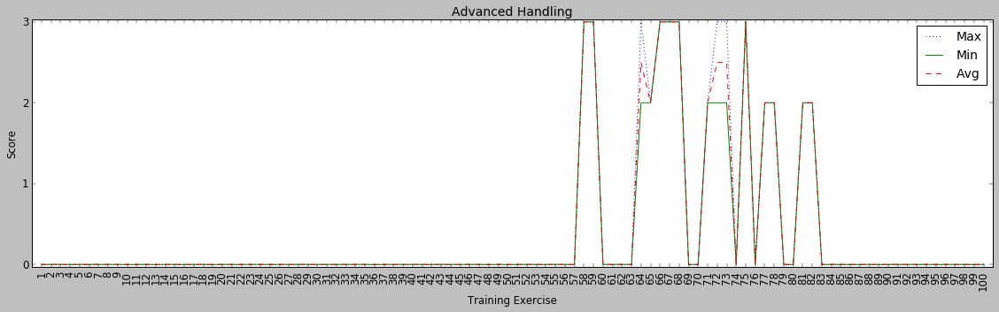

Perch Setups
PerchSetups


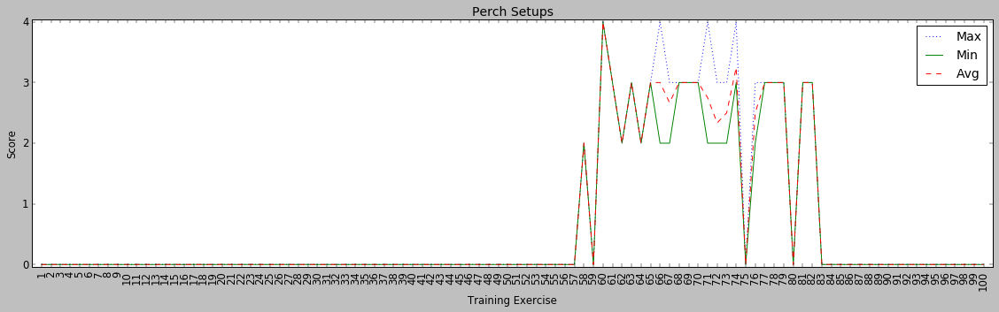

Maneuver Selection
ManeuverSelection


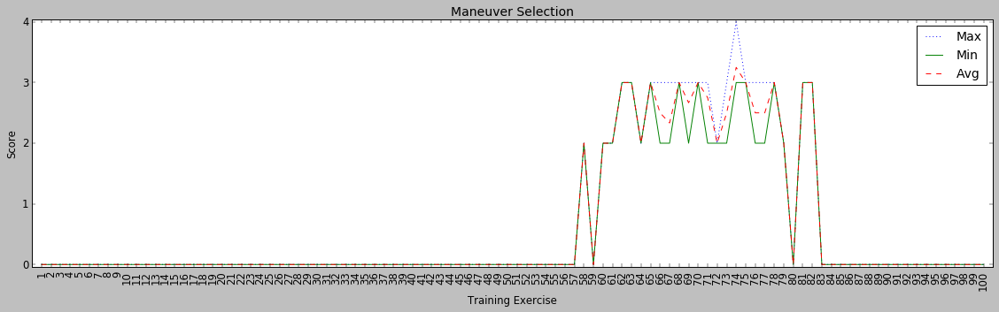

Offensive Fighter Mnvr Exec
OffensiveFighterMnvrExec


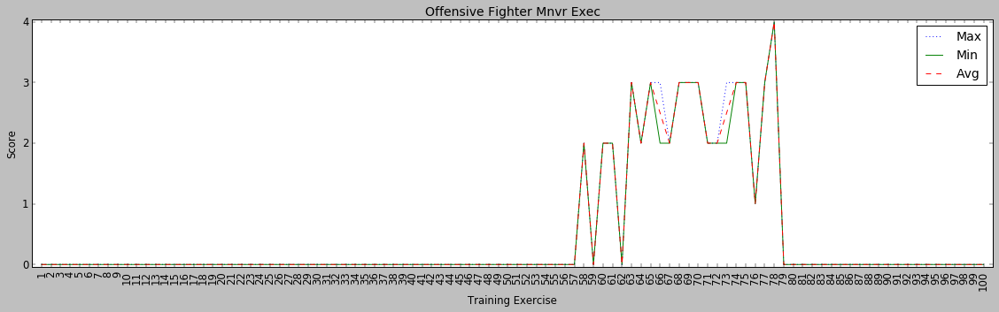

Defensive Fighter Mnvr Exec
DefensiveFighterMnvrExec


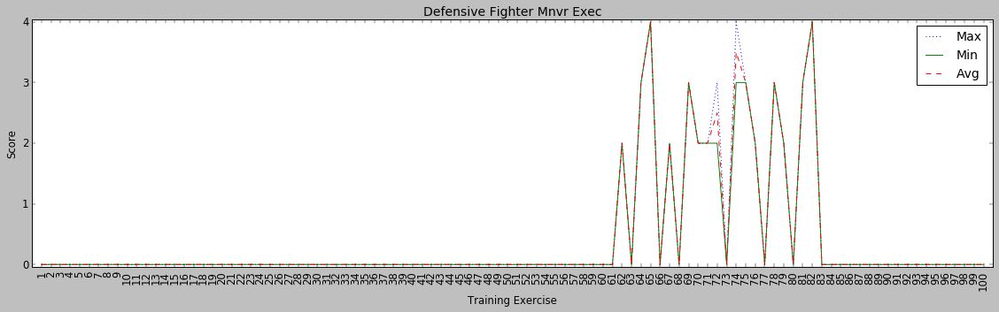

CZ Recognition
CZRecognition


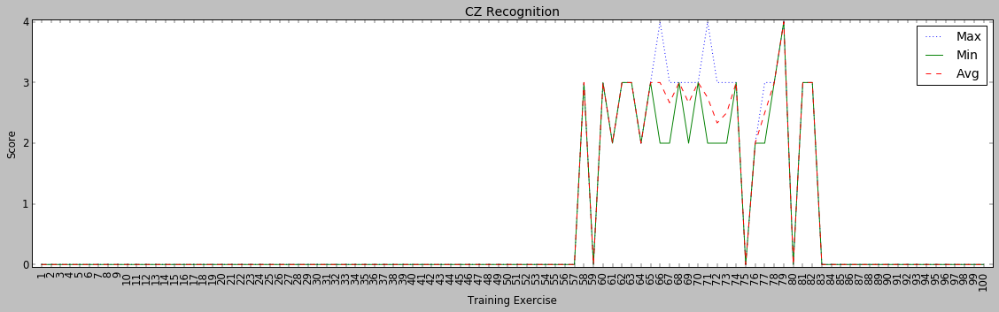

Air to Air Weapons Employ
AirtoAirWeaponsEmploy


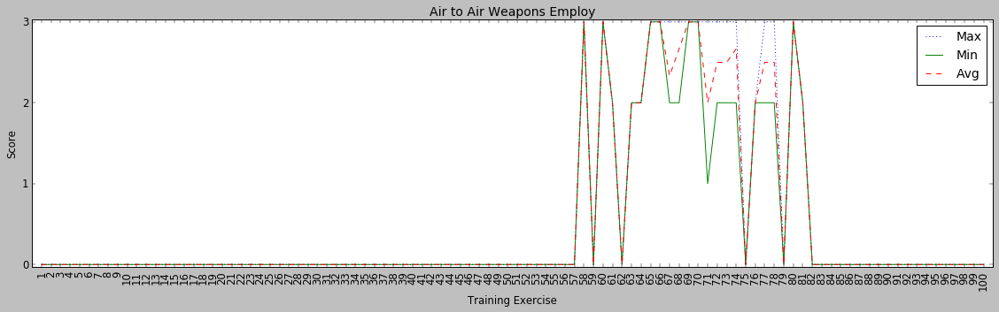

HA Lead Turn Exercise
HALeadTurnExercise


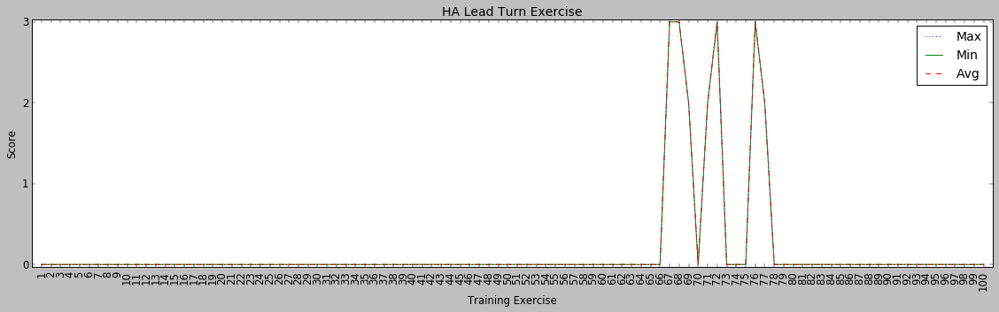

HA Butterfly Setups
HAButterflySetups


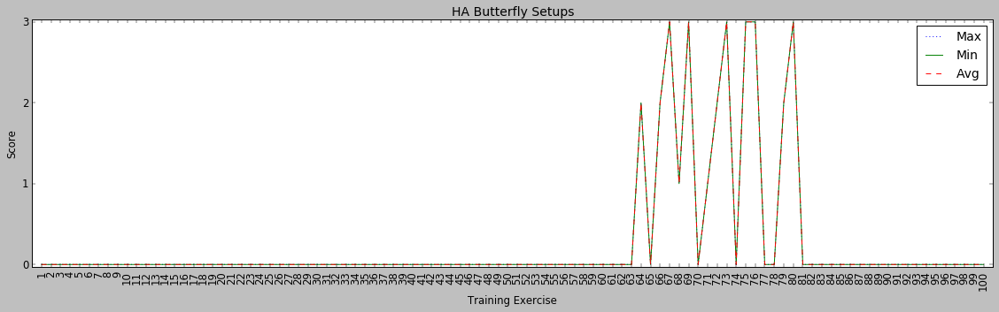

HA BFM Flt Analysis
HABFMFltAnalysis


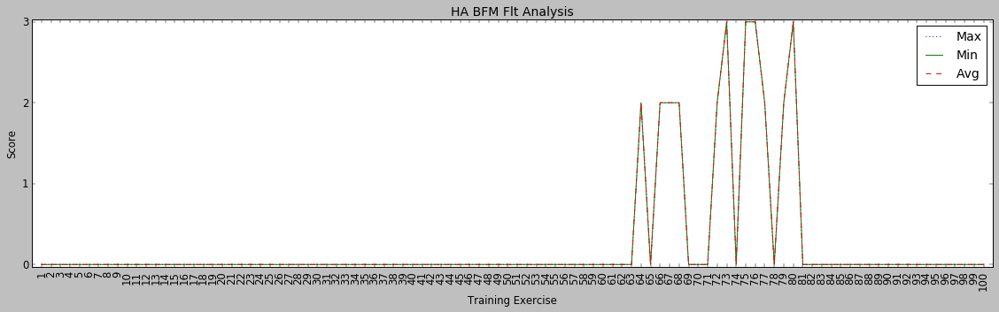

SA Conventional Range
SAConventionalRange


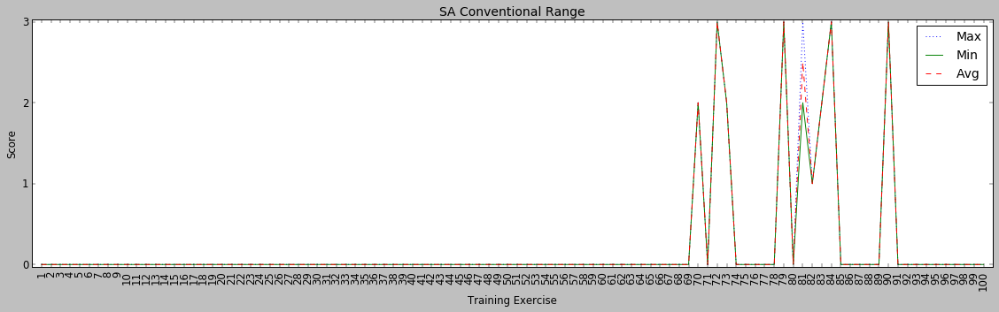

SA Tactical Range Proc
SATacticalRangeProc


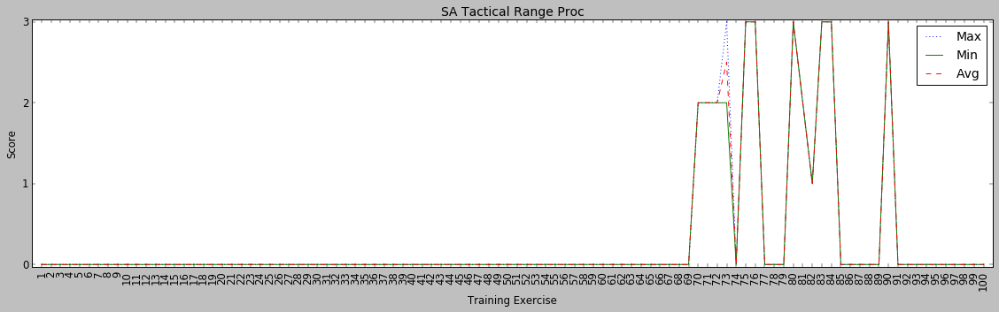

SA Safe-Excape Maneuver
SASafe-ExcapeManeuver


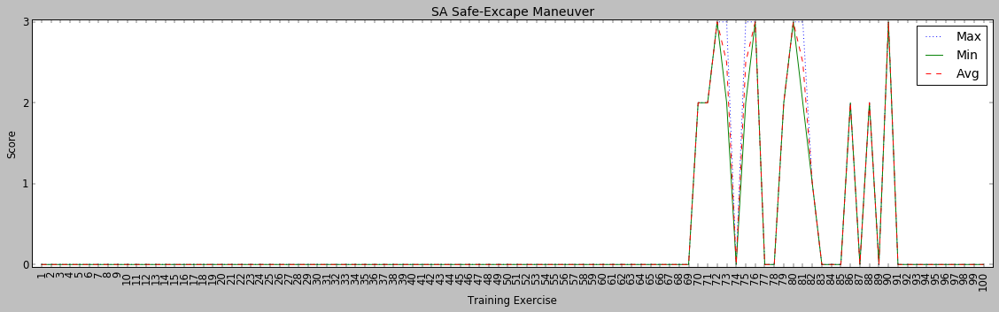

SA Threat Reaction
SAThreatReaction


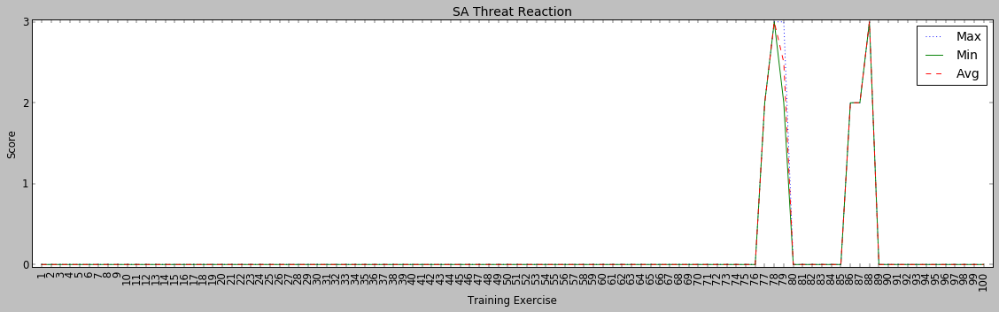

SA Weapons Employment
SAWeaponsEmployment


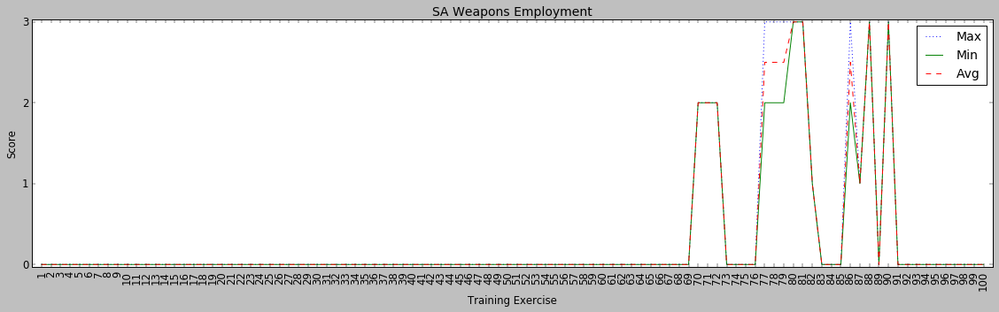

Air to Ground Error Analysis
AirtoGroundErrorAnalysis


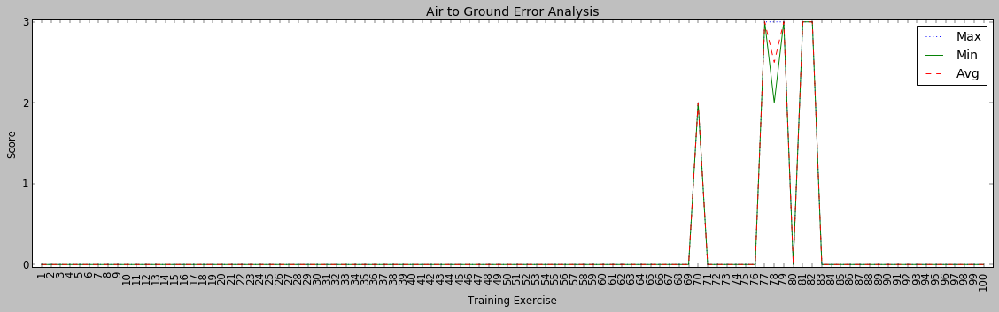

TACS/JFIRE Procedures
TACSJFIREProcedures


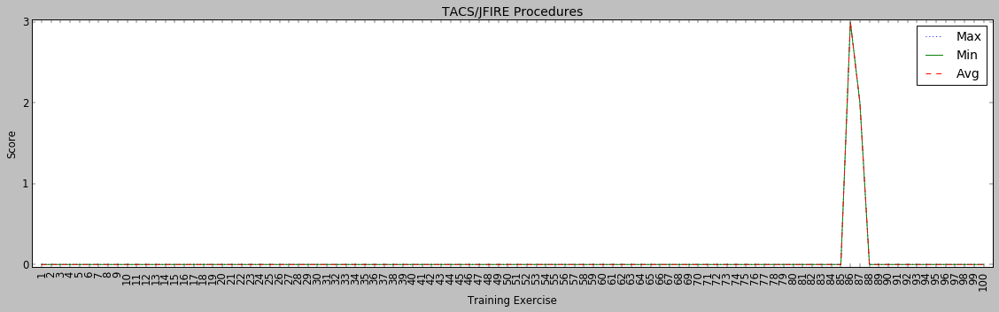

Air to Gnd 2-Ship Mutual Supt
AirtoGnd2-ShipMutualSupt


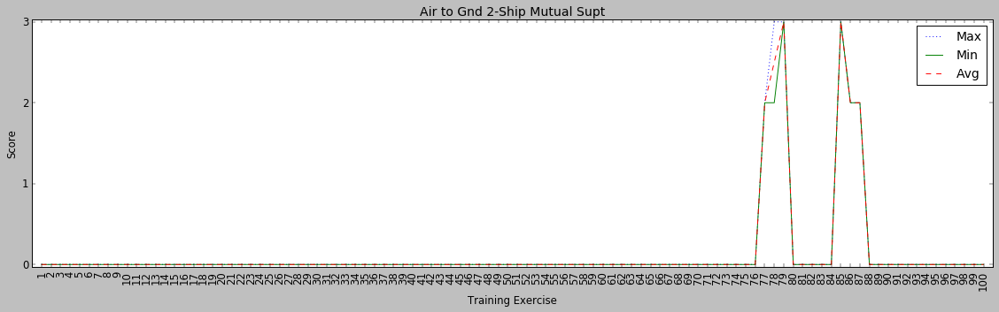

In [39]:
x = np.arange(1, maxExercises+1)
for names in cafIntroNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

Mission Management
MissionManagement


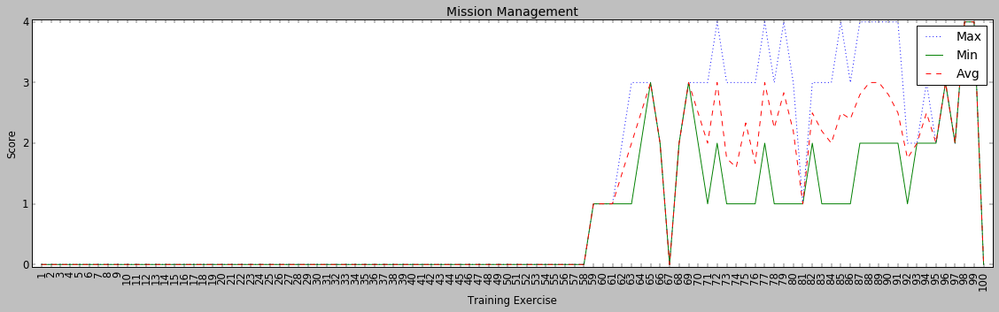

VFR Arrival
VFRArrival


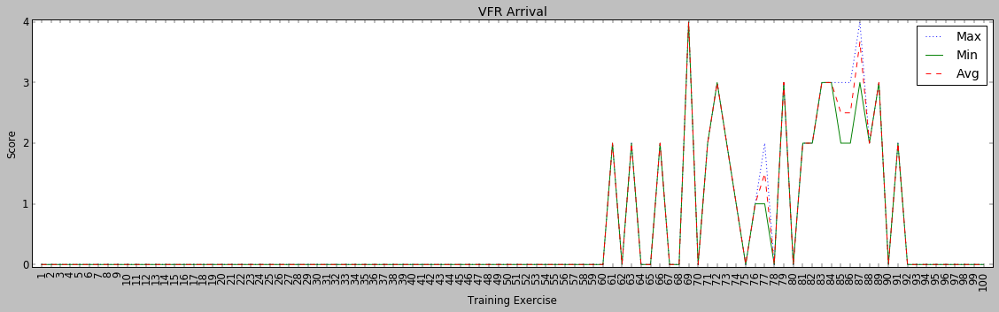

Tanker Procedures
TankerProcedures


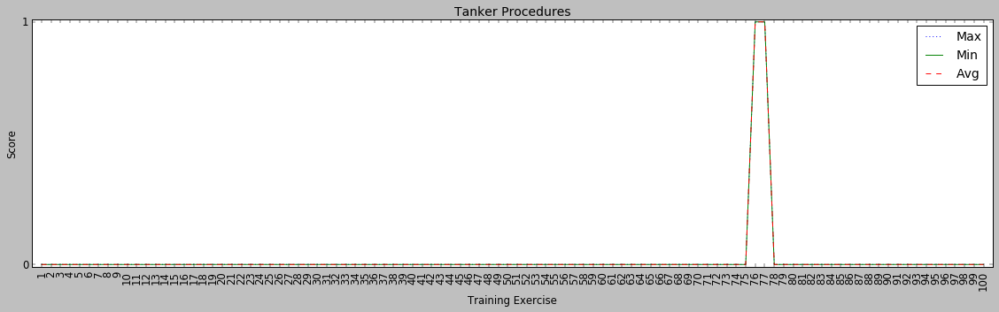

Reciever Procedures
RecieverProcedures


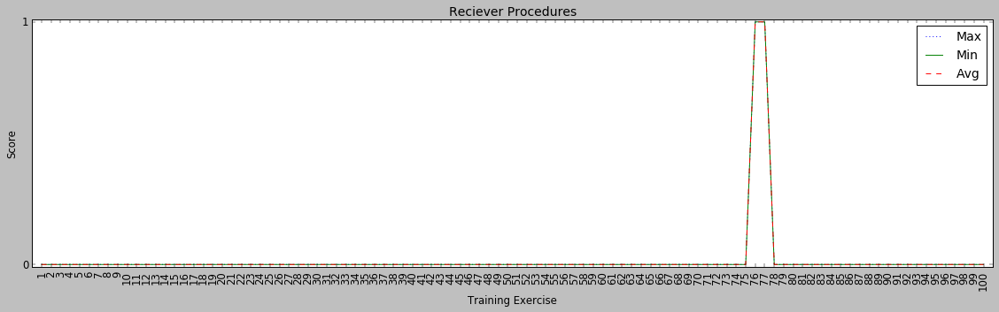

Airdrop Procedures
AirdropProcedures


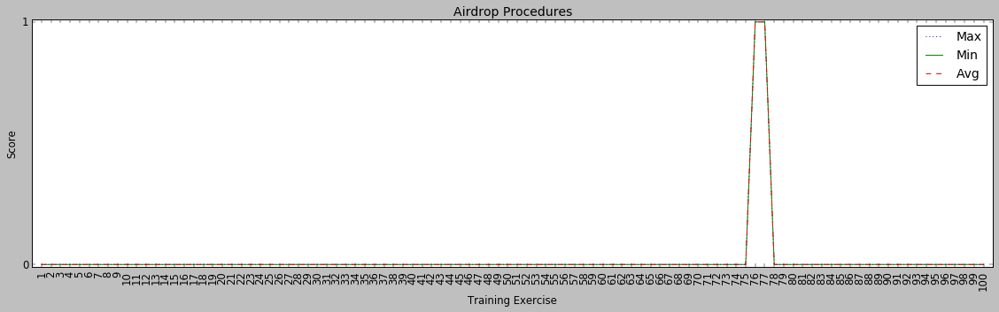

Crew Coordination
CrewCoordination


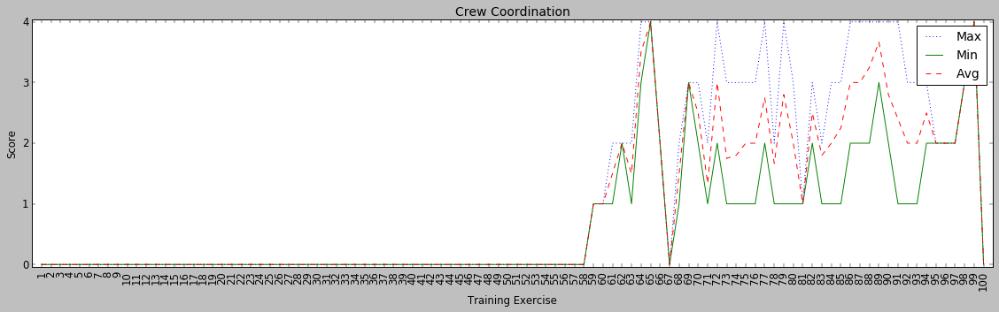

Single Engine Approach
SingleEngineApproach


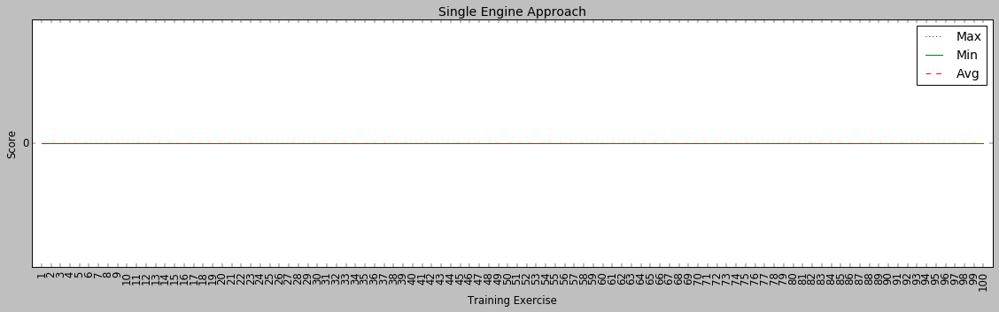

Single Engine GA/Missed Appch
SingleEngineGAMissedAppch


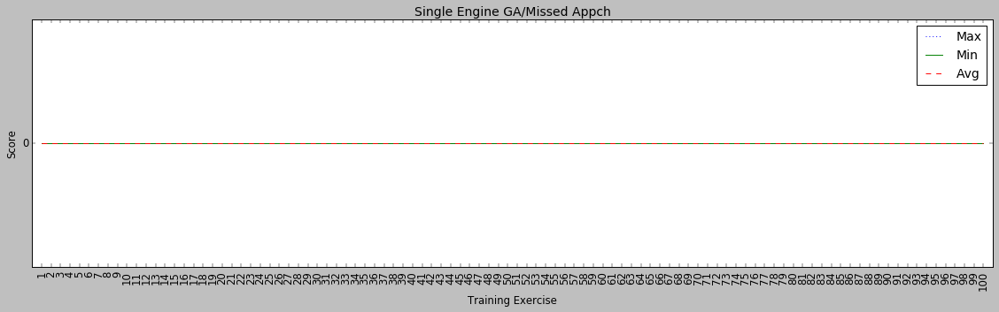

A/R Overrun
AROverrun


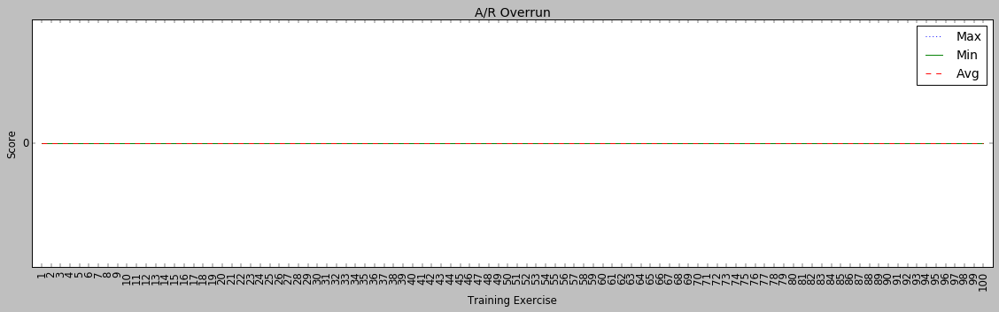

A/R Breakaway
ARBreakaway


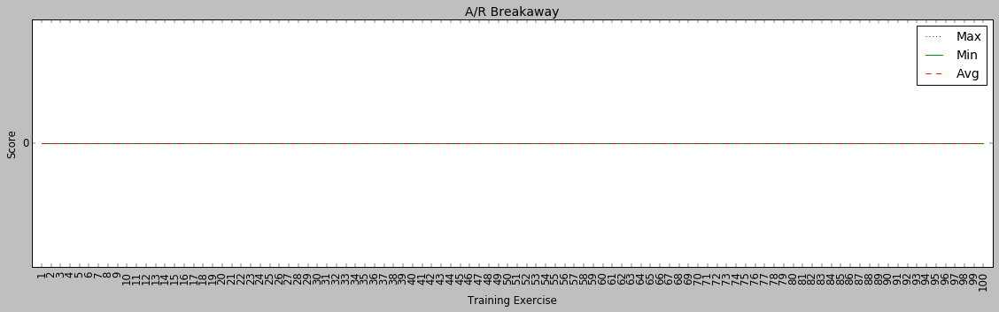

FD/AP Operations
FDAPOperations


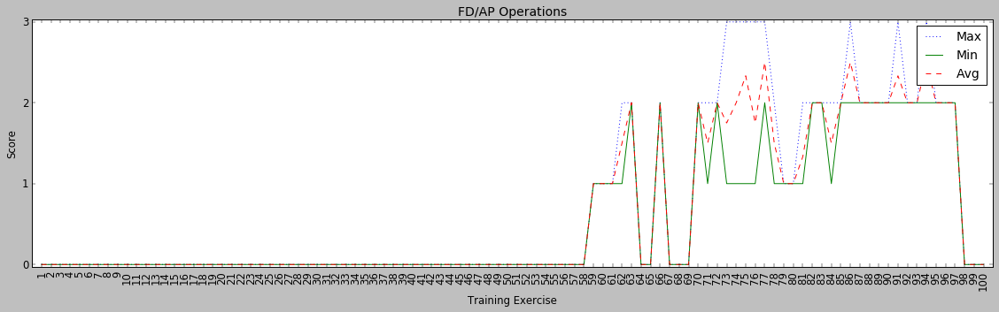

FMS Operations
FMSOperations


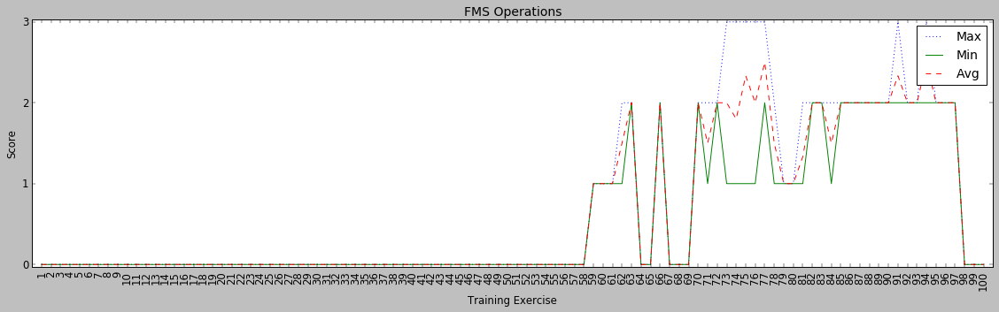

In [40]:
x = np.arange(1, maxExercises+1)
for names in mafIntroNames:
    plt.figure(num=3, figsize=(20, 5), dpi=70)

    #plot max scores
    for index, countMax in maxScores.iterrows():
        if index == names:
            plt.plot(x,countMax,':',label = 'Max')
    #plot min scores
    for index, countMin in minScores.iterrows():
        if index == names:
            plt.plot(x,countMin,label = 'Min')   
    #plot avg scores
    for index, countAvg in avgScores.iterrows():
        if index == names:
            plt.plot(x,countAvg,'--',label = 'Avg')
        
    plt.legend(loc='upper right')
    plt.xlabel('Training Exercise')
    plt.xticks(np.arange(min(x), max(x)+1, 1.0),rotation = 90)
    plt.ylabel('Score')
    plt.yticks(np.arange(0, 5, 1))
    plt.title(names)
    plt.margins(0.01)
    conden = names.replace(' ','').replace('/','').replace(')','').replace('(','')
    print(names)
    print(conden)
    flag = 'manStats_%s' % conden
    plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
    plt.show()

# Total Counts per maneuver per training Exercise

In [41]:
#create variables with frequency for every maneuver for every training Exercise number (excluding MAF and CAF tracks)
maneuverCounts = np.zeros([len(PTNdata1.iloc[0,3:-3]), maxExercises])
print(np.shape(maneuverCounts))

num_of_rows = len(PTNdata1.iloc[0,3:-3])
num_of_cols = maxExercises

#populate maneuver counts and tells you how many times each manuever occured on each training day. 
i = 1
j = 1
position_row = j-1
position_col = i-1

       
for col in PTNdata1.iloc[:,3:-3].columns:
    for numEval in PTNdata1['Training Exercise'].unique():
        #man = PTNdata1.columns.get_loc(col)
        notNulls = PTNdata1[PTNdata1['Training Exercise']==numEval][col].notnull()
        values = [int(notNulls.sum())]
        #print(numEval,'---',col,'---',values)
        position = [int(num_of_cols * position_row + i-1)]

        np.put(maneuverCounts, position, values)
        i = i+1

    j = j+1
    #print('i =',i)


(128, 100)


In [42]:
pd.reset_option('all')


: boolean
    use_inf_as_null had been deprecated and will be removed in a future
    version. Use `use_inf_as_na` instead.



/opt/anaconda3/lib/python3.7/site-packages/pandas/_config/config.py:622: FutureWarning: 
: boolean
    use_inf_as_null had been deprecated and will be removed in a future
    version. Use `use_inf_as_na` instead.

  warnings.warn(d.msg, FutureWarning)


In [43]:
maneuverCounts = pd.DataFrame(maneuverCounts)
maneuverCounts.columns = [np.arange(1, maxExercises+1)]
maneuverCounts.index = PTNdata1.iloc[:,3:-3].columns
maneuverCounts.head()

,1,2,3,4,5,6,7,8,9,10,...,91,92,93,94,95,96,97,98,99,100
Mission Analysis/Products,18.0,15.0,16.0,18.0,18.0,18.0,18.0,17.0,17.0,18.0,...,7.0,6.0,5.0,4.0,2.0,1.0,1.0,1.0,1.0,1.0
Ground Ops,16.0,16.0,15.0,18.0,15.0,13.0,11.0,16.0,15.0,15.0,...,7.0,6.0,5.0,4.0,2.0,1.0,1.0,1.0,1.0,1.0
Takeoff,18.0,18.0,15.0,17.0,16.0,12.0,12.0,16.0,14.0,15.0,...,7.0,6.0,5.0,4.0,2.0,1.0,1.0,1.0,1.0,1.0
Departure,17.0,18.0,17.0,17.0,17.0,14.0,13.0,15.0,15.0,14.0,...,6.0,6.0,5.0,4.0,2.0,1.0,1.0,1.0,1.0,1.0
Basic Aircraft Control,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,18.0,...,7.0,6.0,5.0,4.0,2.0,1.0,1.0,1.0,1.0,1.0


In [44]:
#Export maneuver counts to CSV file 
maneuverCounts.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_maneuverCounts.csv')

In [45]:
#Divide columns of maneuver counts by # of Students still in training at each Exercise. 
#This tells us the fraction of active students that performed maneuver on that day.

maneuverPerc = maneuverCounts / student_per_exerciseNum
maneuverPerc.head()

,1,2,3,4,5,6,7,8,9,10,...,91,92,93,94,95,96,97,98,99,100
Mission Analysis/Products,1.000000,0.833333,0.888889,1.000000,1.000000,1.000000,1.000000,0.944444,0.944444,1.000000,...,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Ground Ops,0.888889,0.888889,0.833333,1.000000,0.833333,0.722222,0.611111,0.888889,0.833333,0.833333,...,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Takeoff,1.000000,1.000000,0.833333,0.944444,0.888889,0.666667,0.666667,0.888889,0.777778,0.833333,...,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Departure,0.944444,1.000000,0.944444,0.944444,0.944444,0.777778,0.722222,0.833333,0.833333,0.777778,...,0.857143,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
Basic Aircraft Control,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [46]:
#Export maneuver percentages to CSV file 
maneuverPerc.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_maneuverPerc.csv')

### Visualizations of frequency distributions for each maneuver category

Mission Analysis/Products
MissionAnalysisProducts


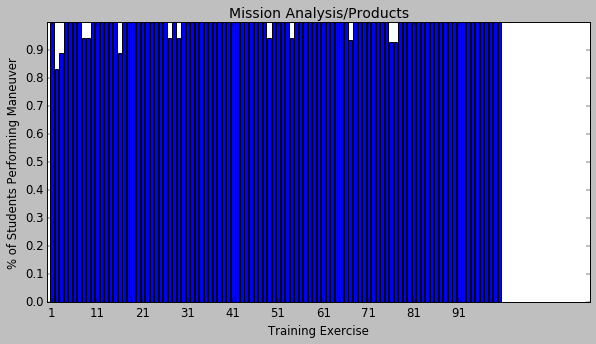

Ground Ops
GroundOps


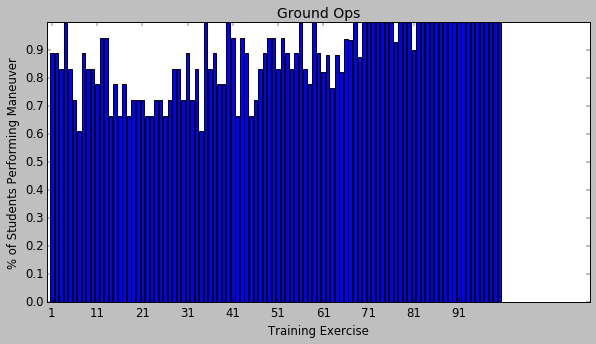

Takeoff
Takeoff


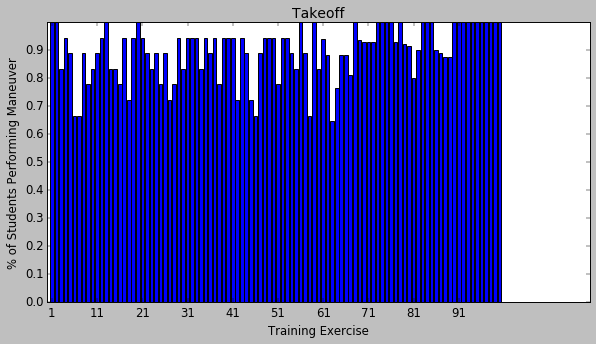

Departure
Departure


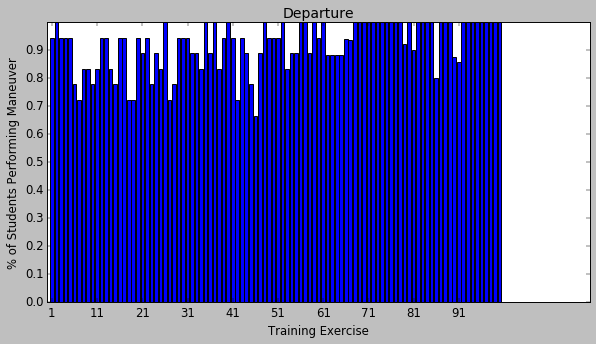

Basic Aircraft Control
BasicAircraftControl


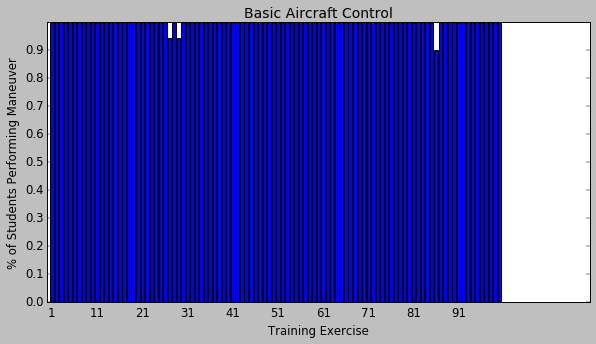

Cross-Check
Cross-Check


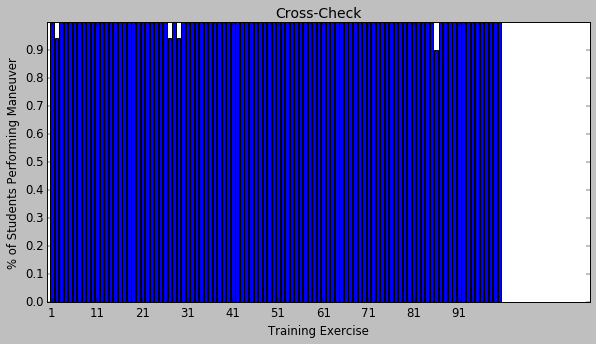

Enroute Descent / Recovery
EnrouteDescentRecovery


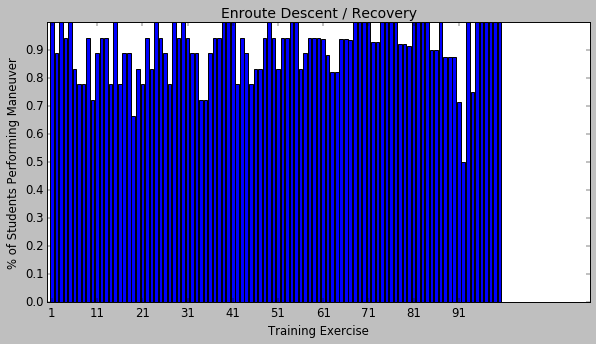

Inflight Checks
InflightChecks


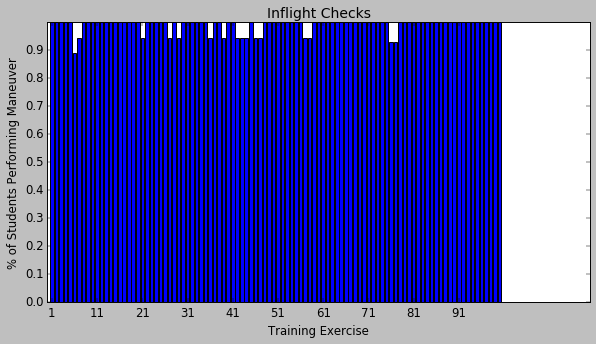

Inflight Planning
InflightPlanning


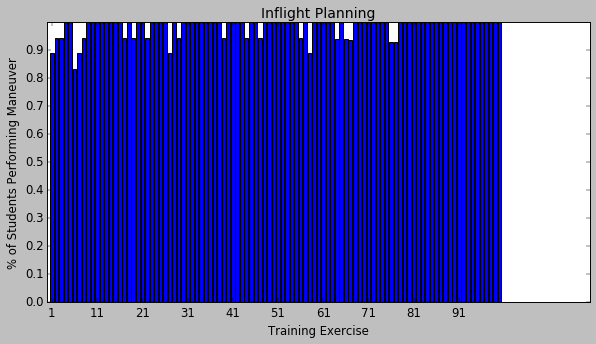

Clearing / Visual Lookout
ClearingVisualLookout


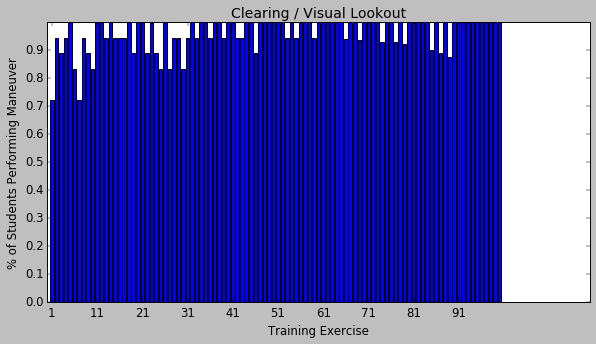

Communication
Communication


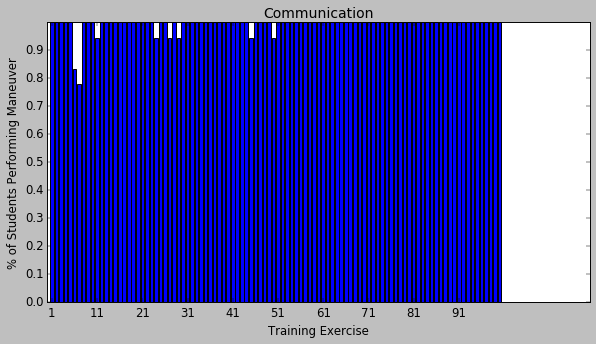

Risk Mgmt / Decision Making
RiskMgmtDecisionMaking


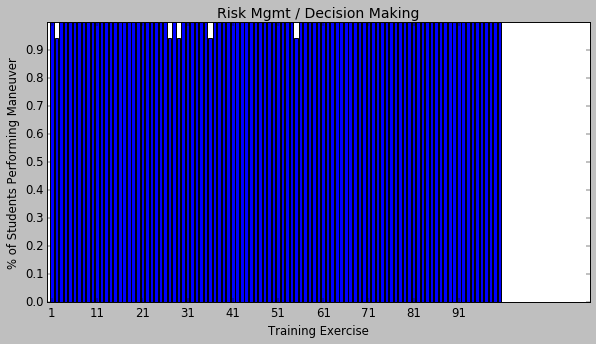

Situational Awareness
SituationalAwareness


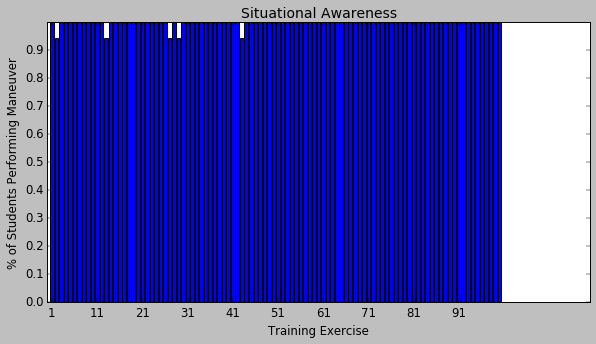

Task Management
TaskManagement


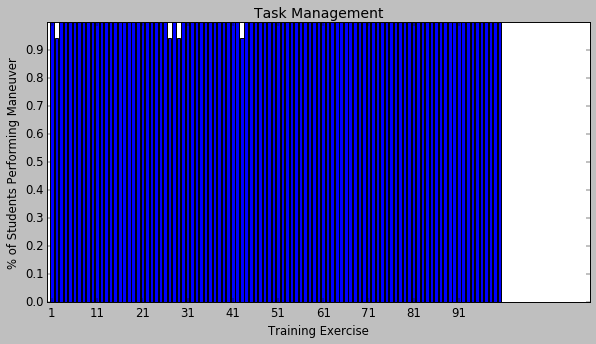

Emergency Procedures
EmergencyProcedures


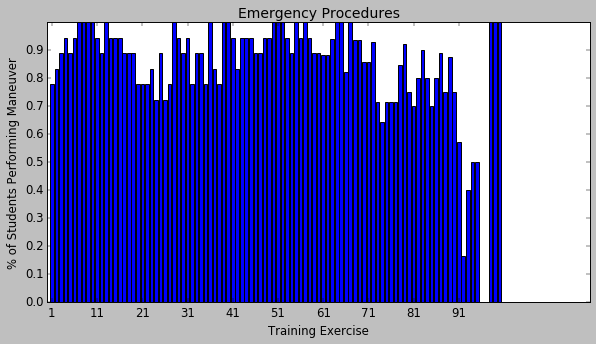

General Knowledge
GeneralKnowledge


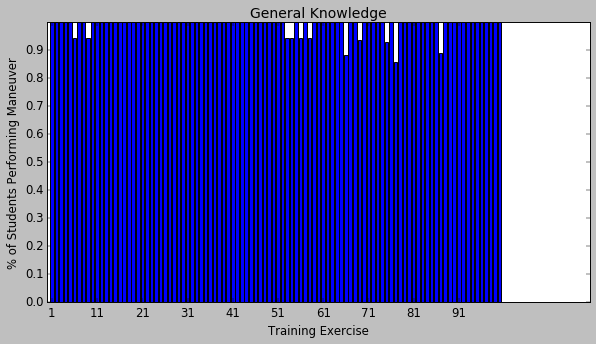

In [47]:
#maneuverCounts.iloc[0,:]
x = np.arange(1, maxExercises+1)

for index, count in maneuverPerc.iterrows():
    if index in basicManeuverNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=70)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Overhead/Closed Pattern
OverheadClosedPattern


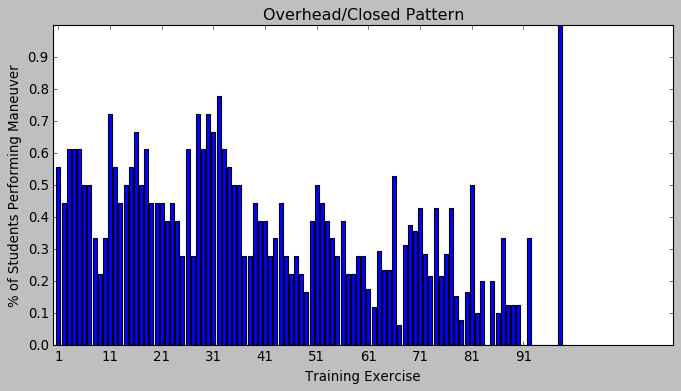

Visual St-In
VisualSt-In


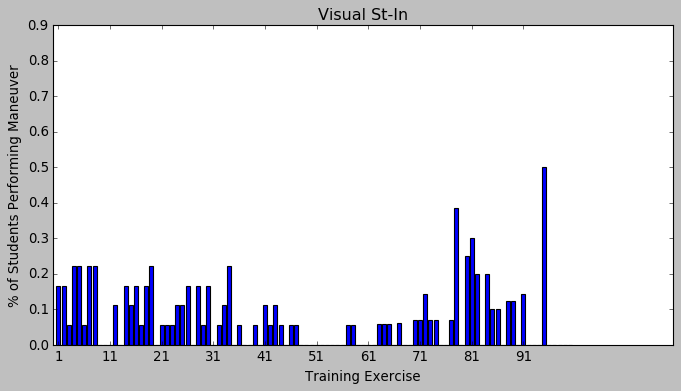

Landing
Landing


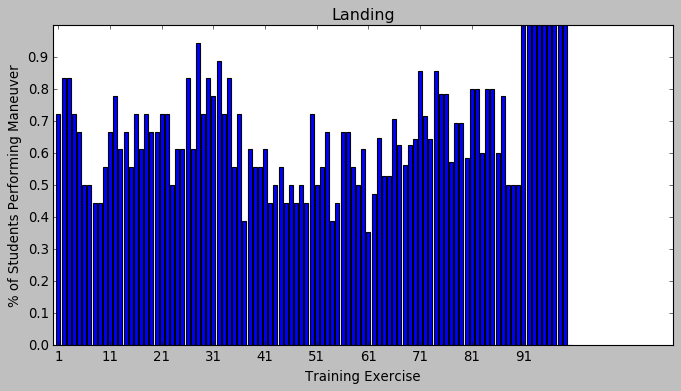

No-Flap Landing
No-FlapLanding


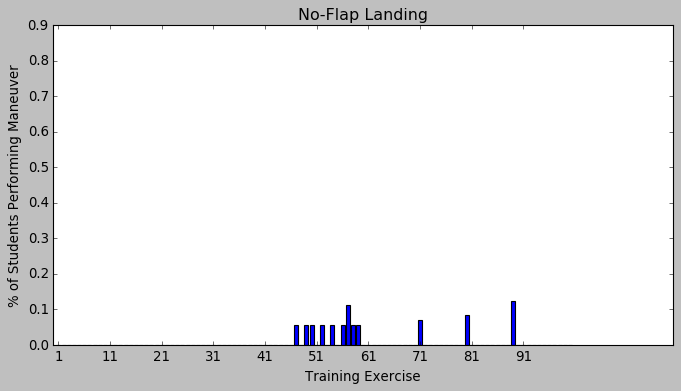

Go-Around
Go-Around


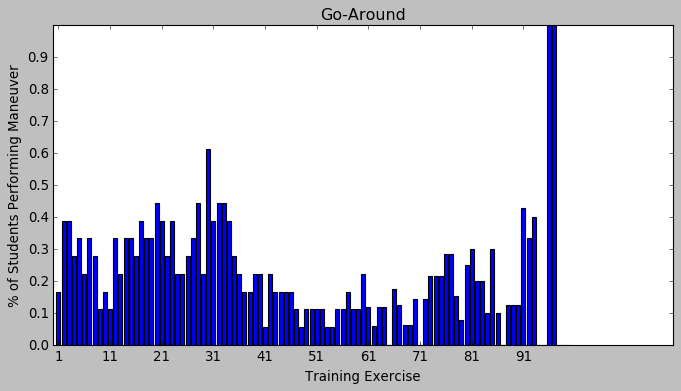

Emergency Landing Pattern
EmergencyLandingPattern


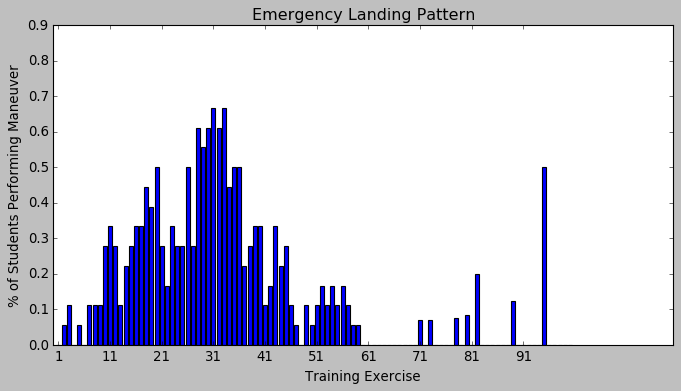

In [48]:
for index, count in maneuverPerc.iterrows():
    if index in patternsNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

G-Awareness
G-Awareness


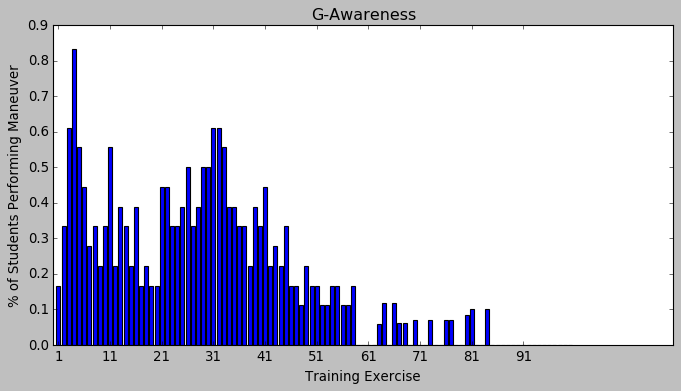

TP Stalls
TPStalls


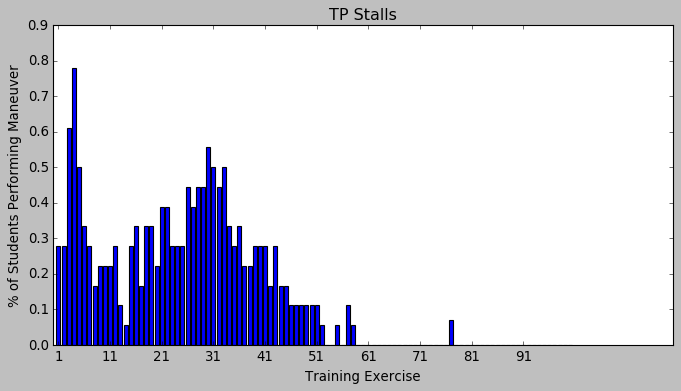

Slow Flight
SlowFlight


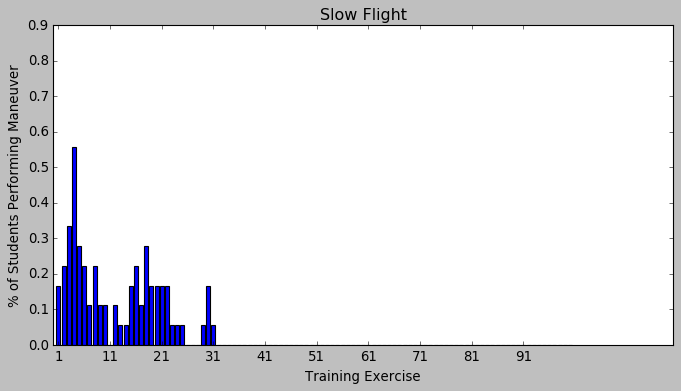

Power On Stalls
PowerOnStalls


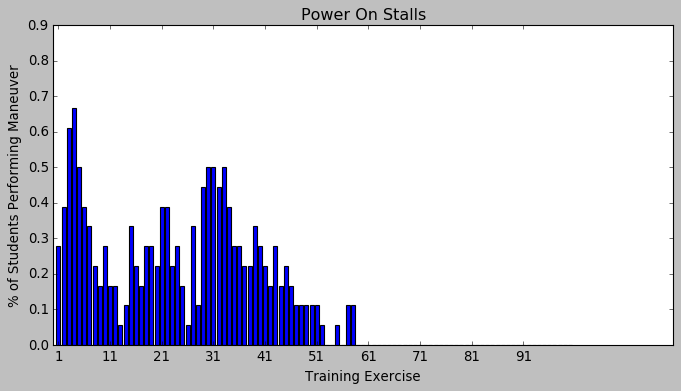

Contact Recoveries
ContactRecoveries


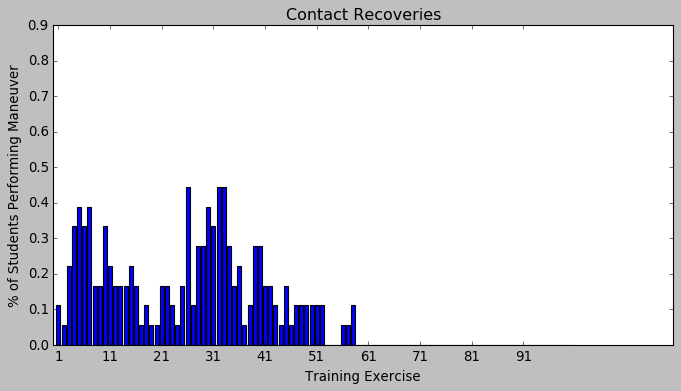

Spin Recovery
SpinRecovery


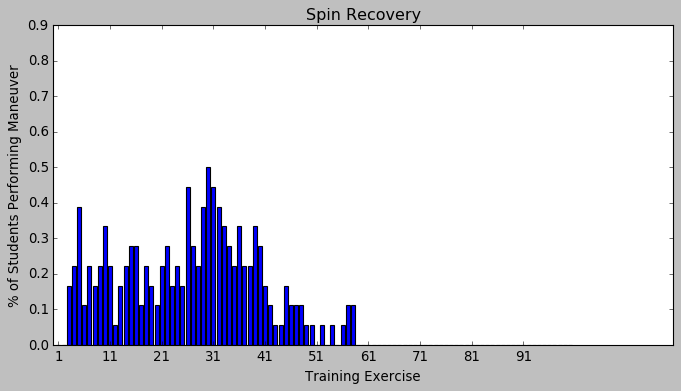

Aileron Roll
AileronRoll


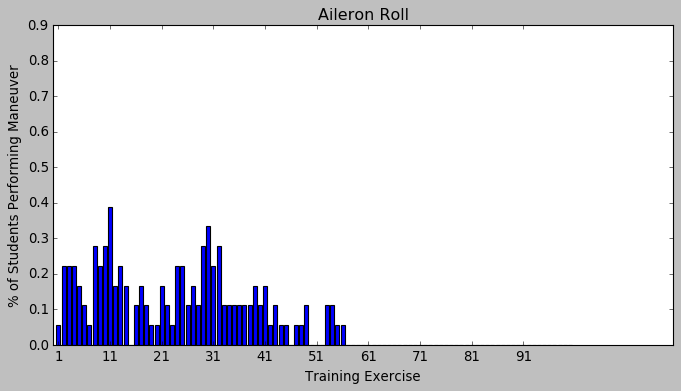

Barrel Roll
BarrelRoll


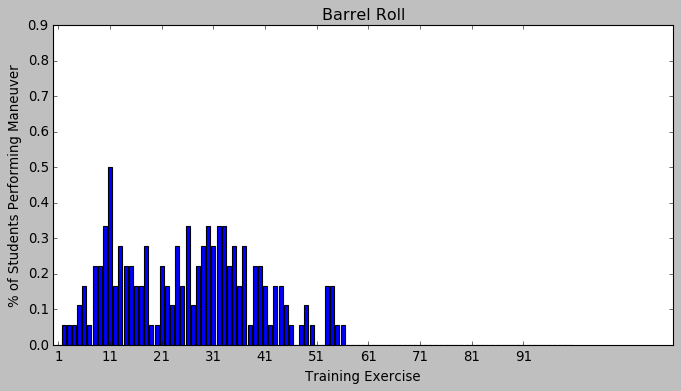

Pitchback / Sliceback
PitchbackSliceback


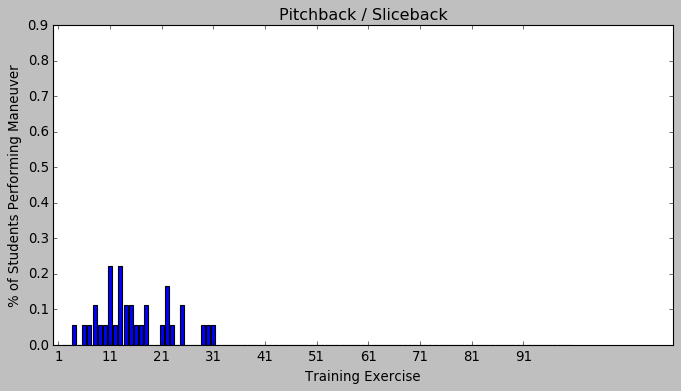

Cloverleaf
Cloverleaf


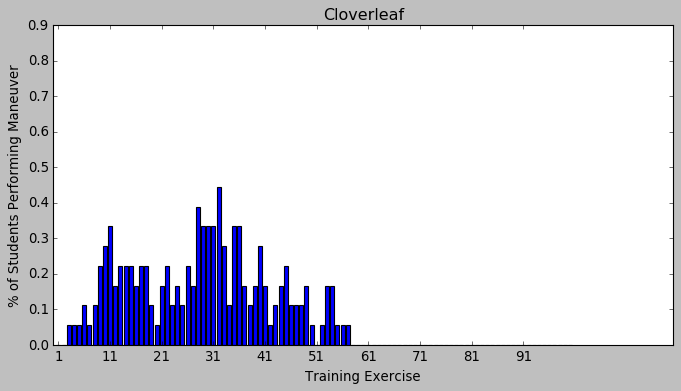

Cuban Eight
CubanEight


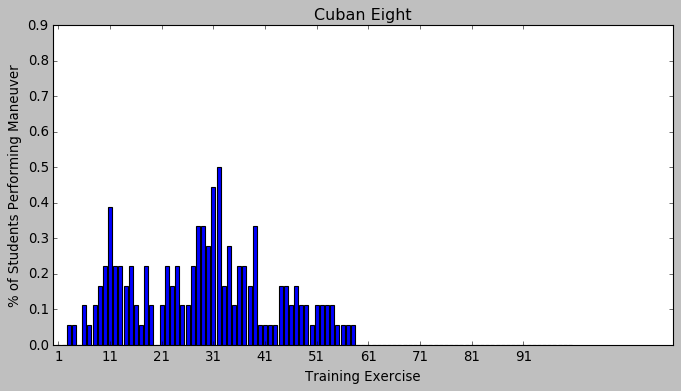

Immelmann
Immelmann


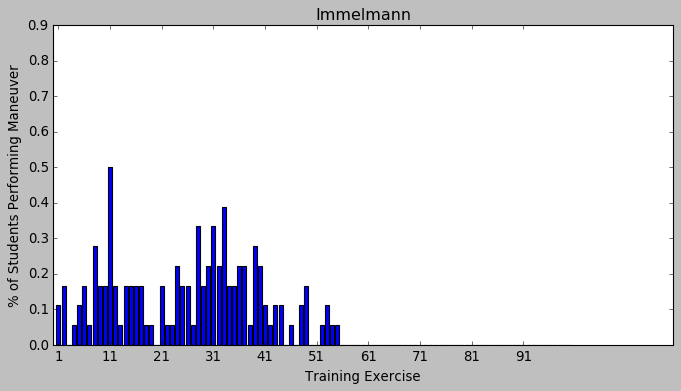

Lazy Eight
LazyEight


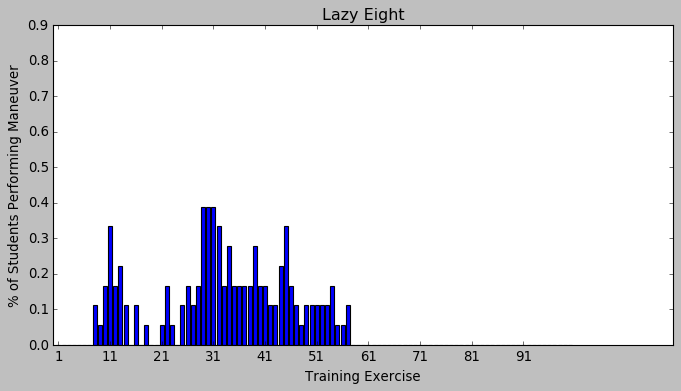

Loop
Loop


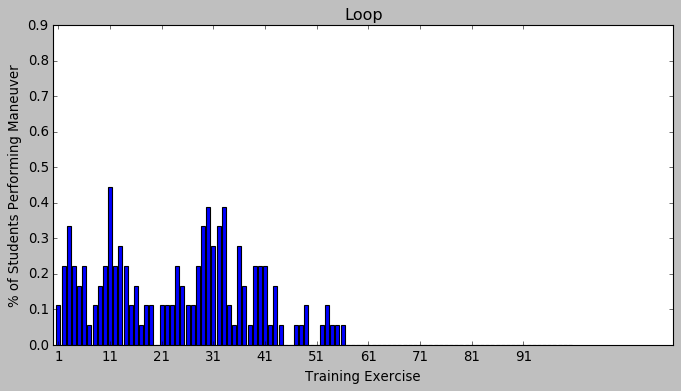

Split S
SplitS


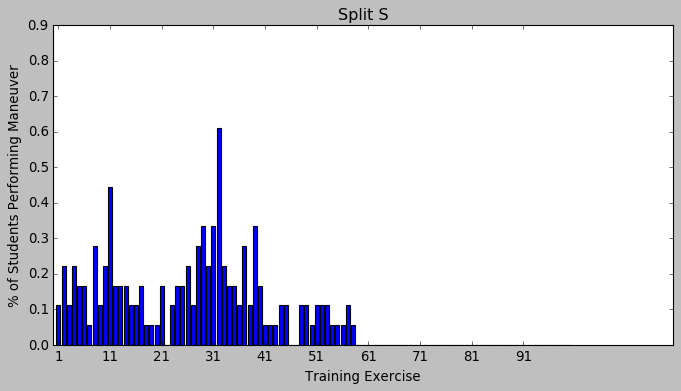

In [49]:
for index, count in maneuverPerc.iterrows():
    if index in contactNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Vertical S
VerticalS


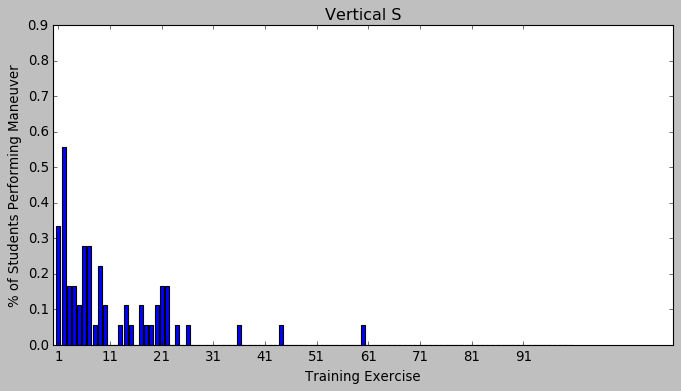

Unusual Attitudes
UnusualAttitudes


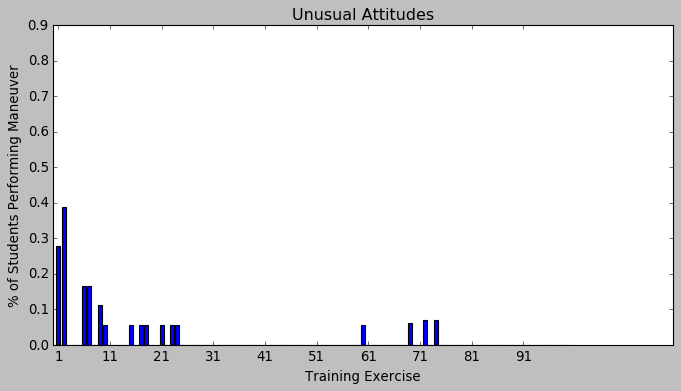

Steep Turns
SteepTurns


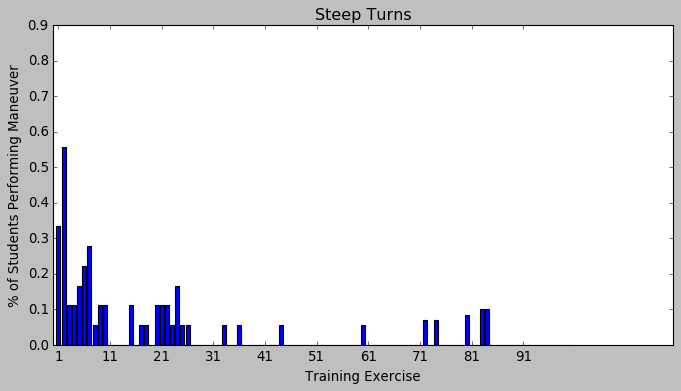

Intercept / Maintain Arc
InterceptMaintainArc


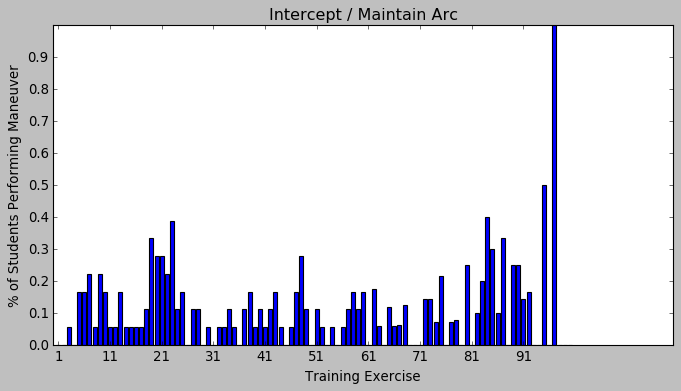

Fix to Fix
FixtoFix


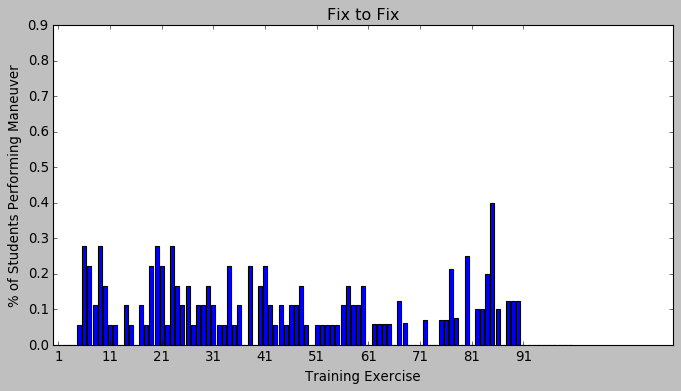

Holding
Holding


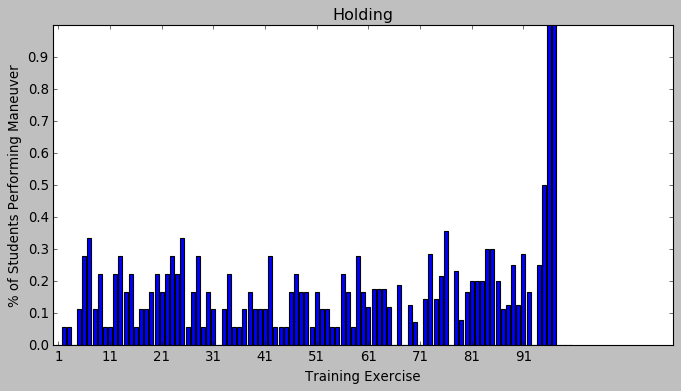

Full Procedure Approach
FullProcedureApproach


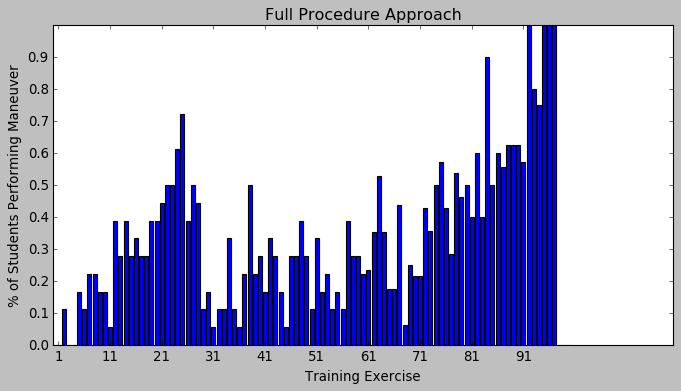

Non-Precision Final
Non-PrecisionFinal


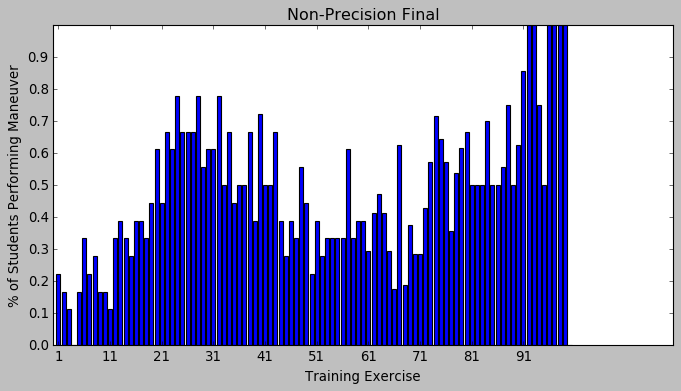

Precision Final
PrecisionFinal


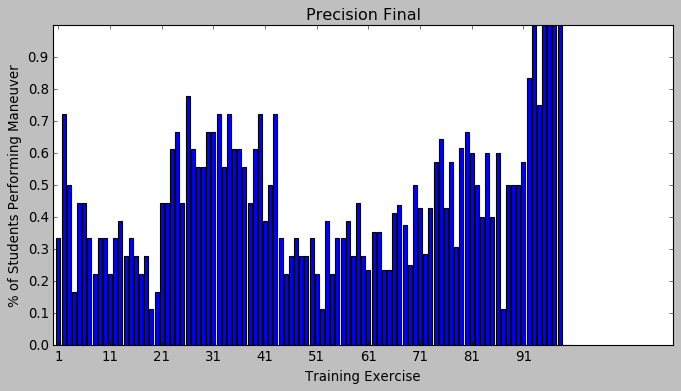

Circling Approach
CirclingApproach


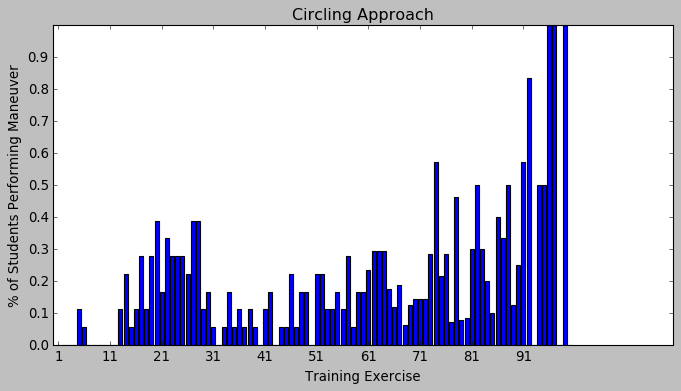

Missed Approach
MissedApproach


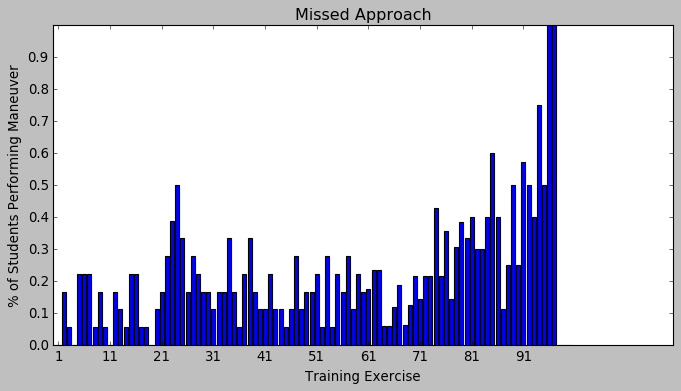

Night Landing
NightLanding


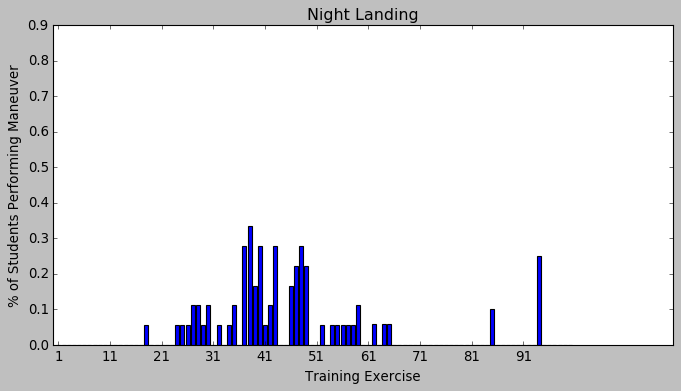

In [50]:
for index, count in maneuverPerc.iterrows():
    if index in instrumentNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Wing Takeoff
WingTakeoff


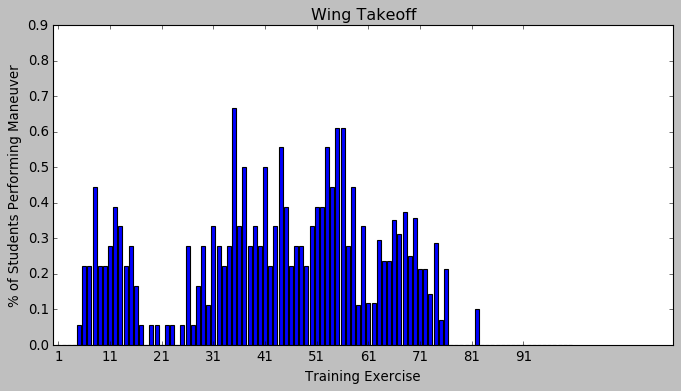

Interval Takeoff
IntervalTakeoff


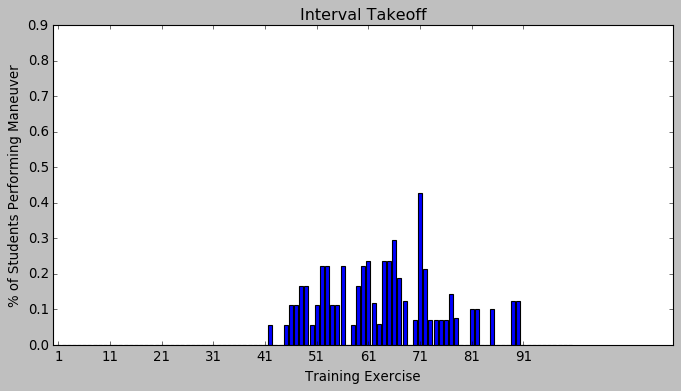

Instrument Trail
InstrumentTrail


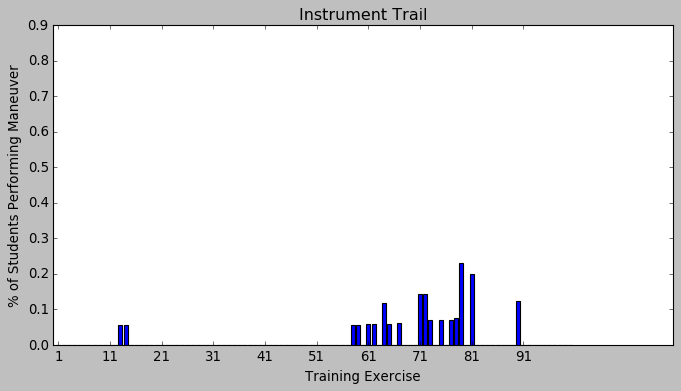

G-Warmup / Awareness
G-WarmupAwareness


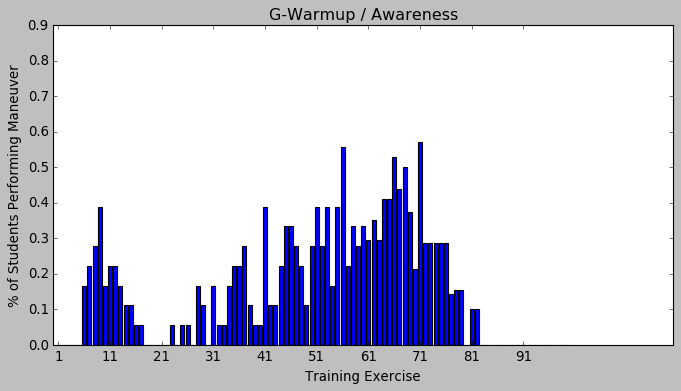

Lead Platform
LeadPlatform


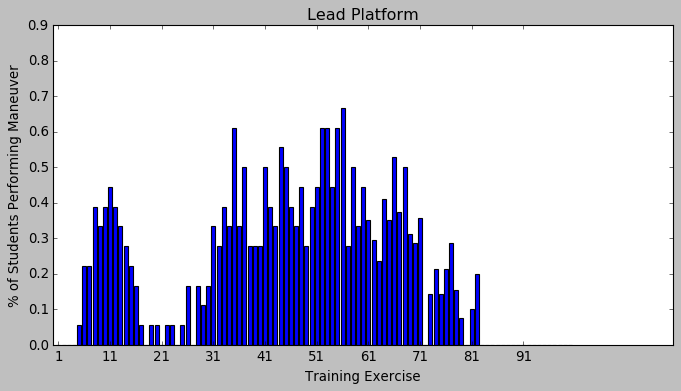

Pitchout (Both)
PitchoutBoth


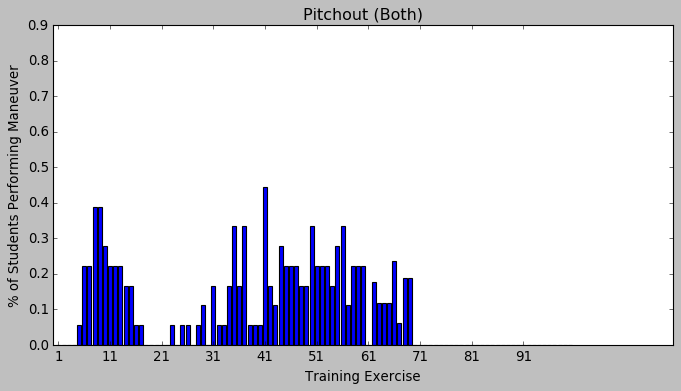

Fingertip (Wing)
FingertipWing


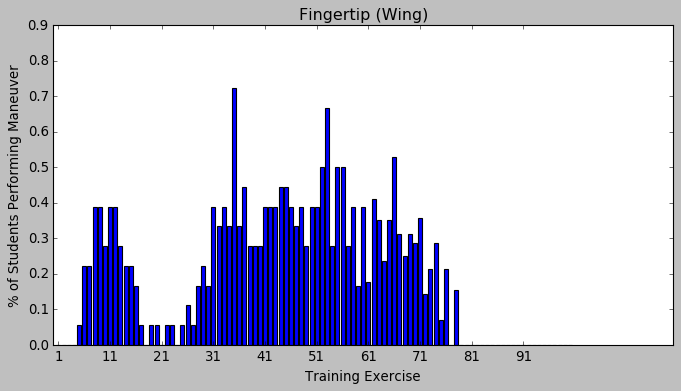

Route (Wing)
RouteWing


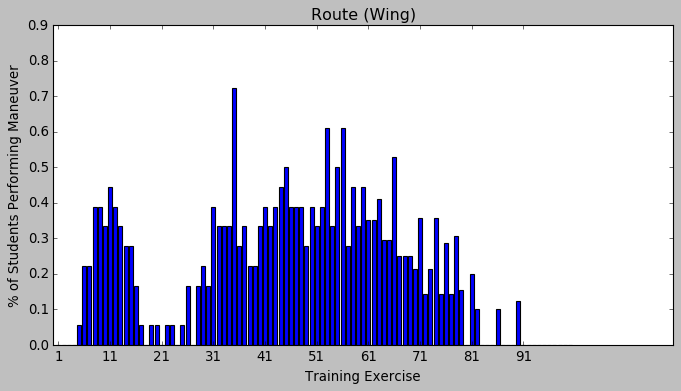

Fighting Wing (Wing)
FightingWingWing


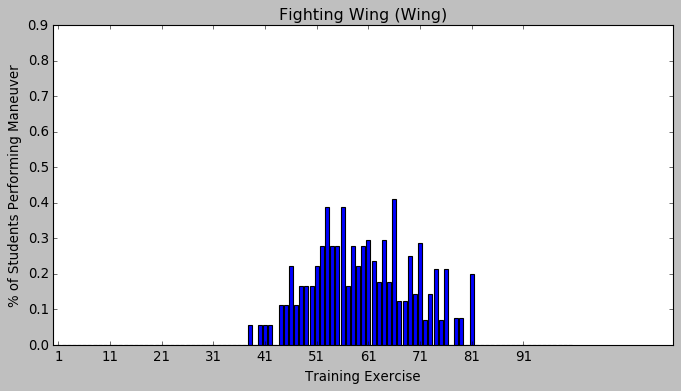

Straight Ahead Rejoin
StraightAheadRejoin


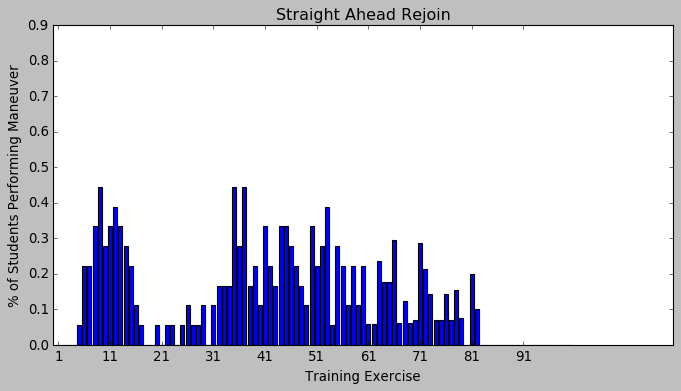

Turning Rejoin
TurningRejoin


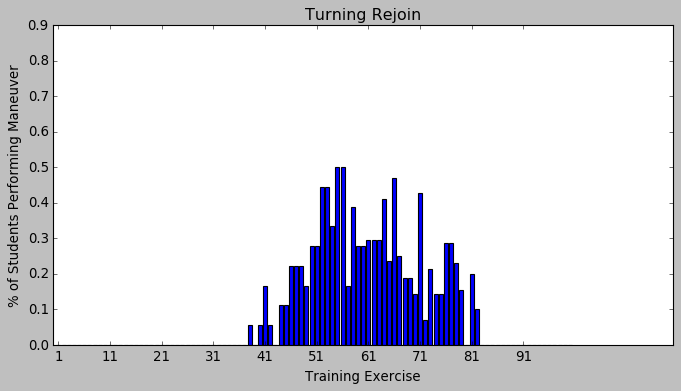

Overshoot
Overshoot


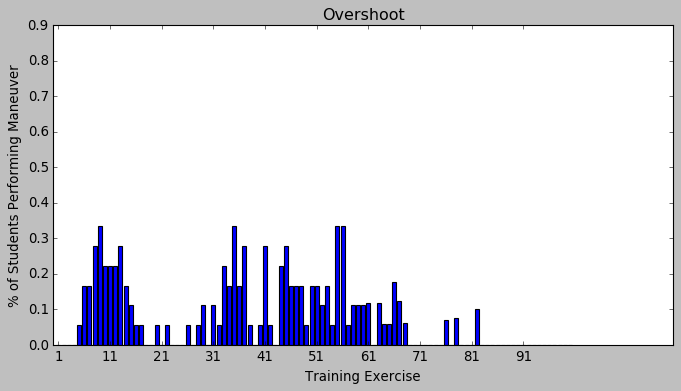

Echelon (Wing)
EchelonWing


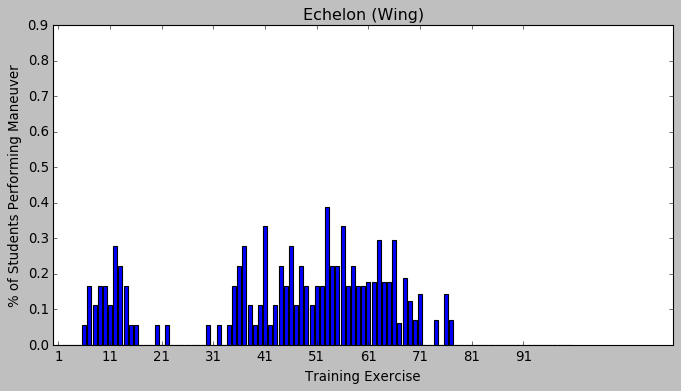

Breakout (Wing)
BreakoutWing


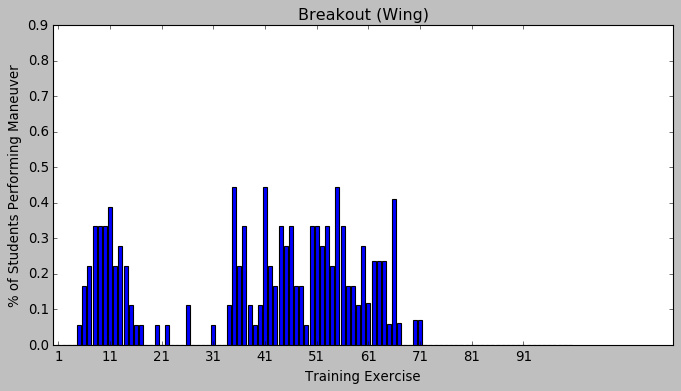

Lost Wingman (Both)
LostWingmanBoth


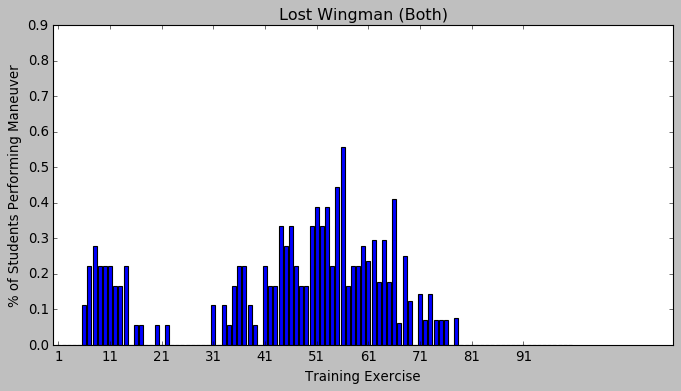

Extended Trail (Wing)
ExtendedTrailWing


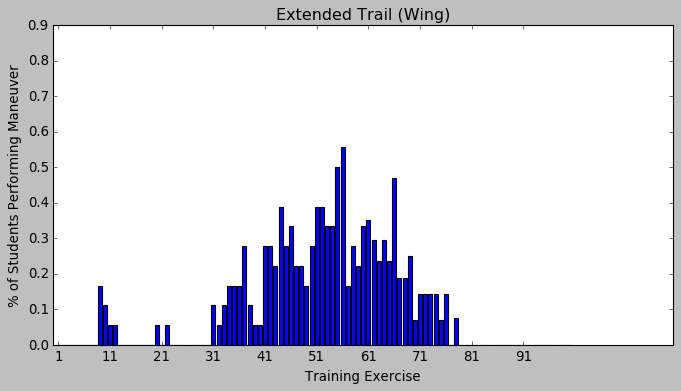

Position Change
PositionChange


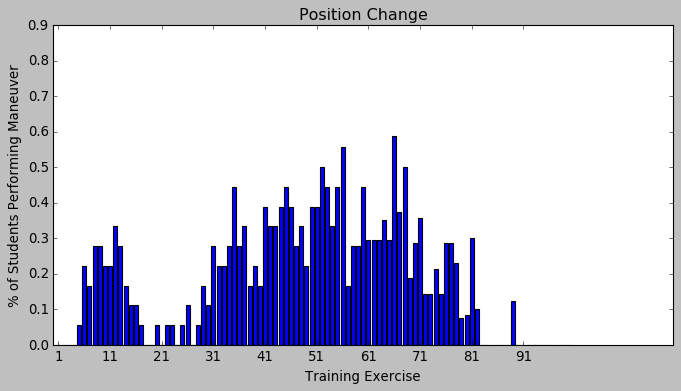

Formation Approach (Both)
FormationApproachBoth


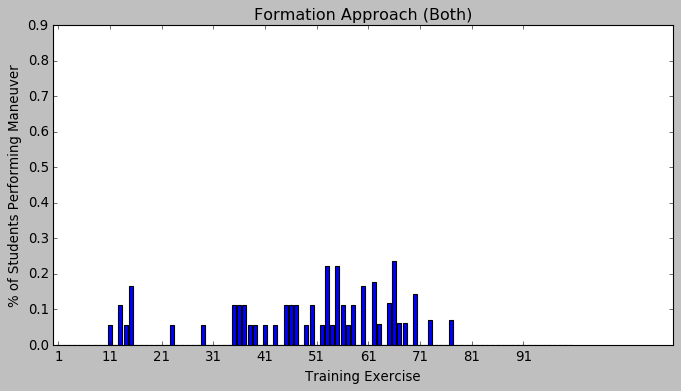

Formation Landing (Both)
FormationLandingBoth


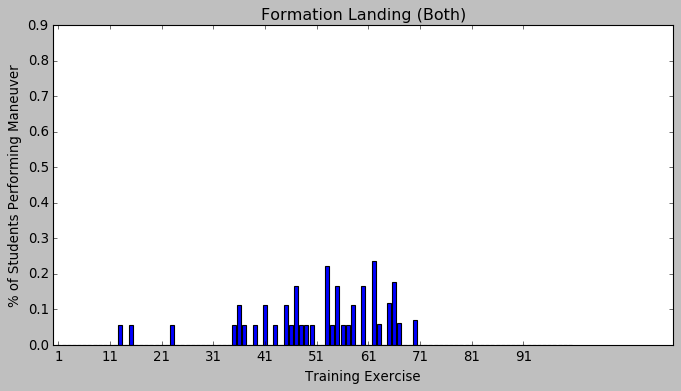

Battle Damage Check
BattleDamageCheck


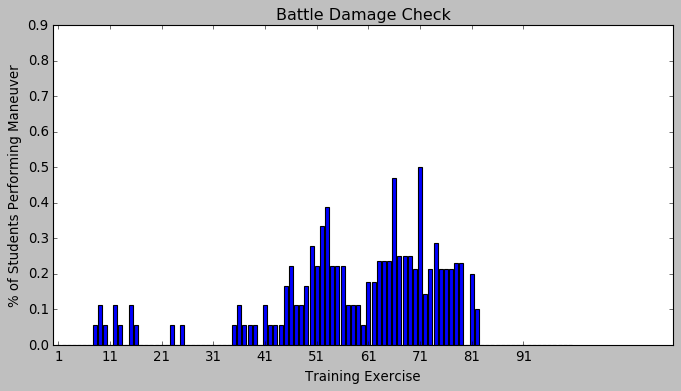

Flt Integrity / Wingman Consideration
FltIntegrityWingmanConsideration


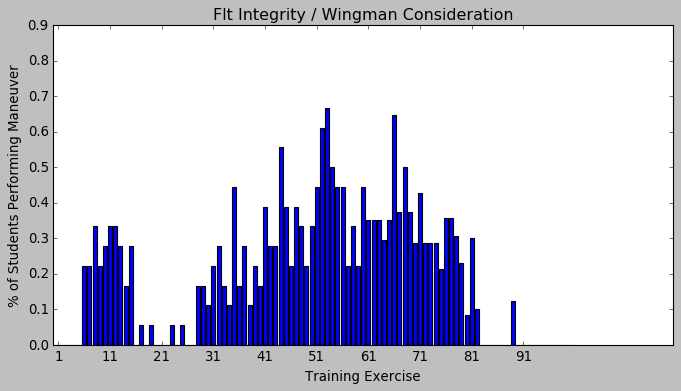

In [51]:
for index, count in maneuverPerc.iterrows():
    if index in basicFormationNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Delay 90
Delay90


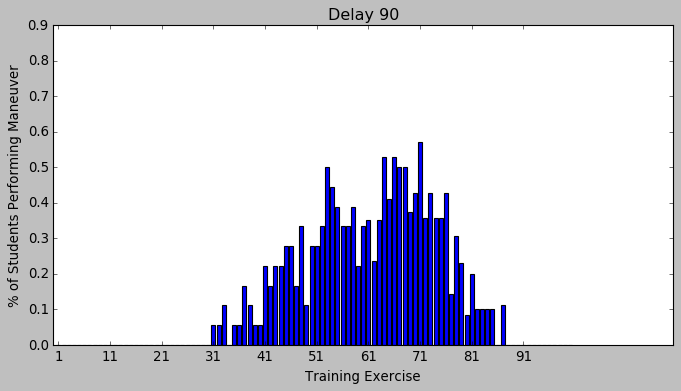

Delay 45
Delay45


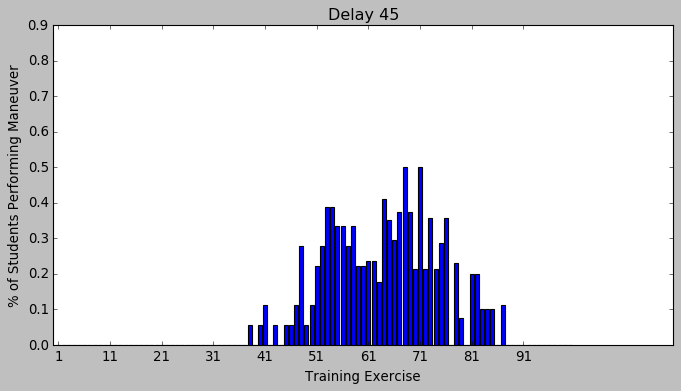

Hook Turn
HookTurn


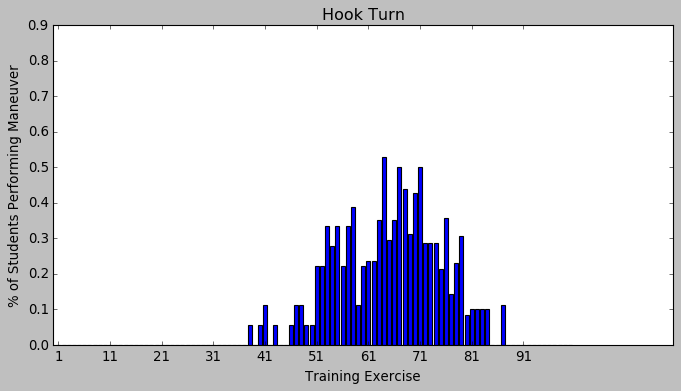

Shackle
Shackle


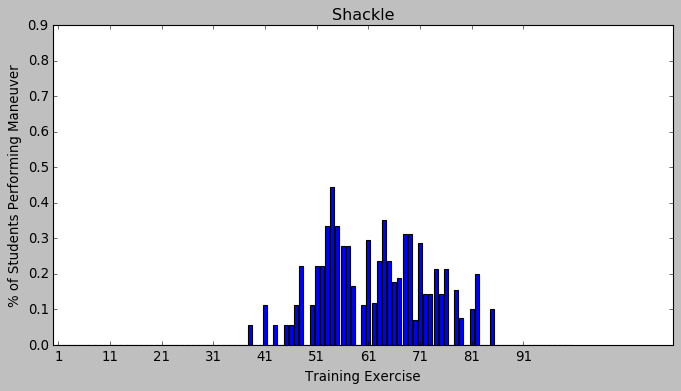

Cross Turn
CrossTurn


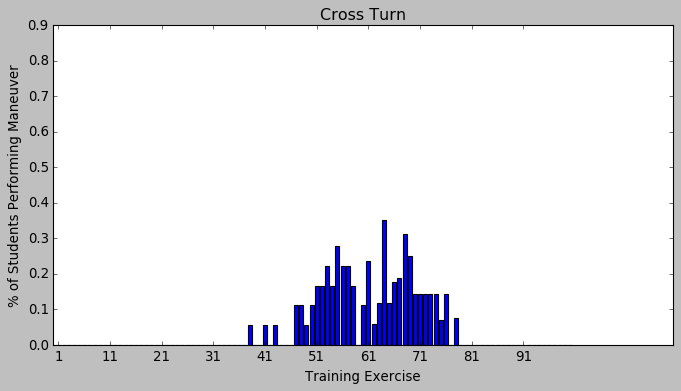

Fluid Turn
FluidTurn


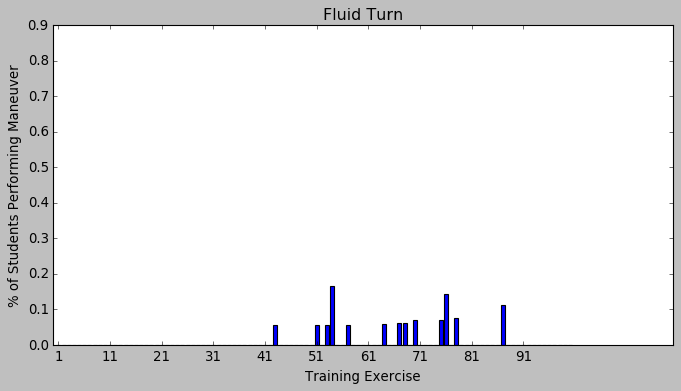

Tactical Rejoins
TacticalRejoins


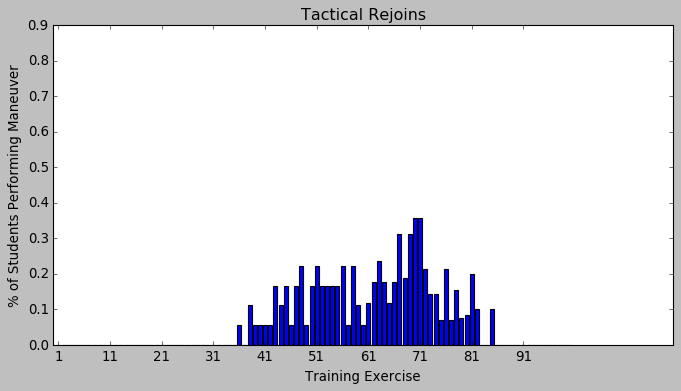

Fluid Maneuvering
FluidManeuvering


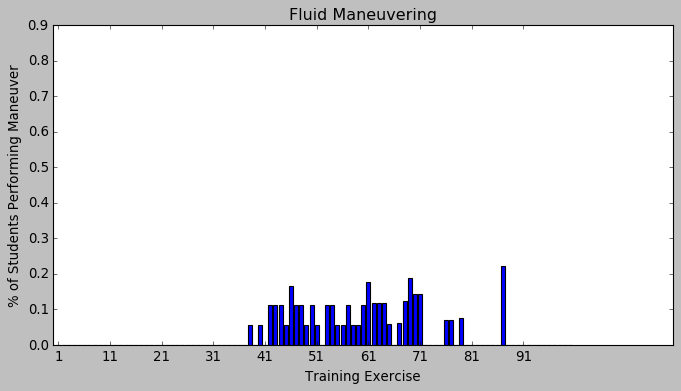

Tac Initial
TacInitial


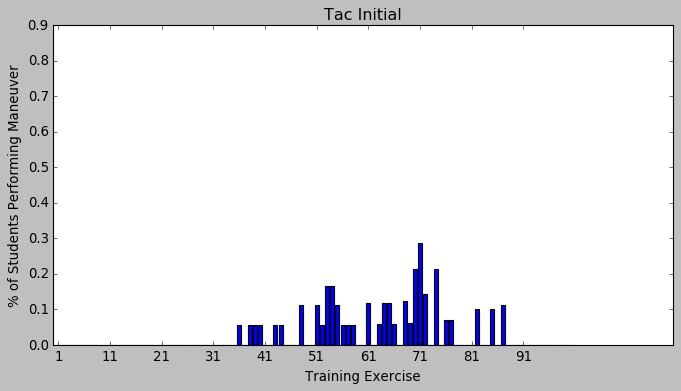

In [52]:
for index, count in maneuverPerc.iterrows():
    if index in tacticalFormationNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Course Mx
CourseMx


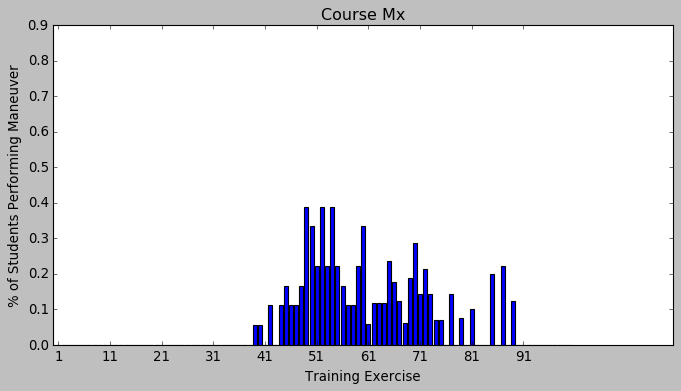

Course Entry
CourseEntry


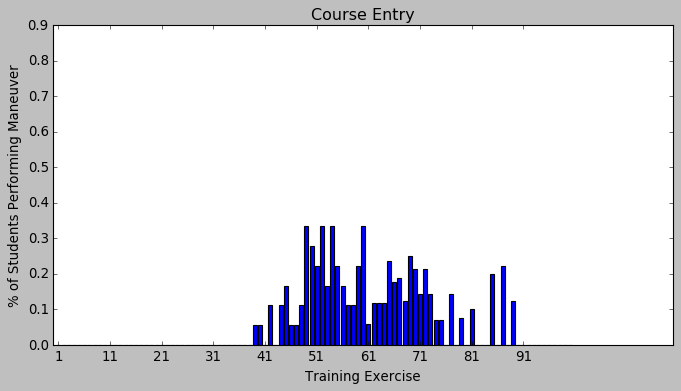

Time Control
TimeControl


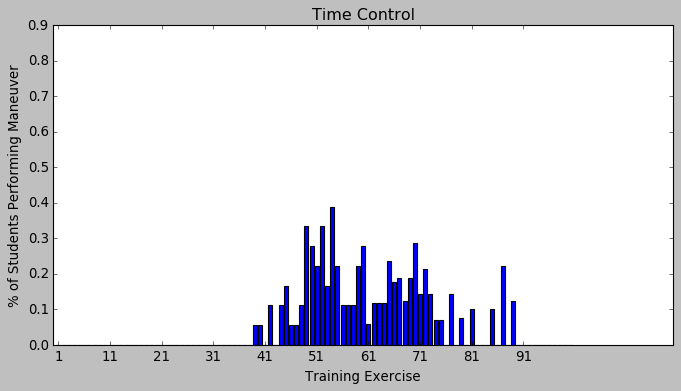

Altitude Control
AltitudeControl


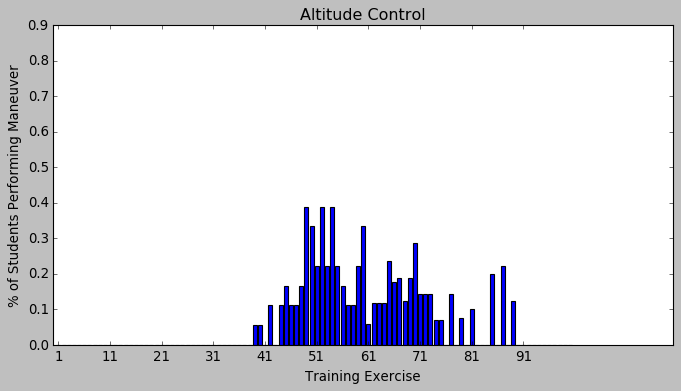

Checkpoint ID
CheckpointID


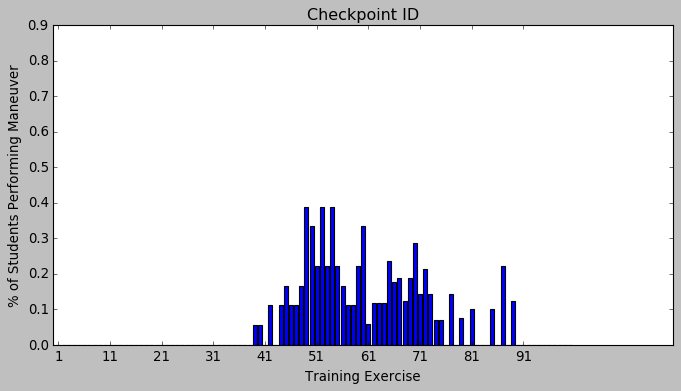

LL GPS Integration
LLGPSIntegration


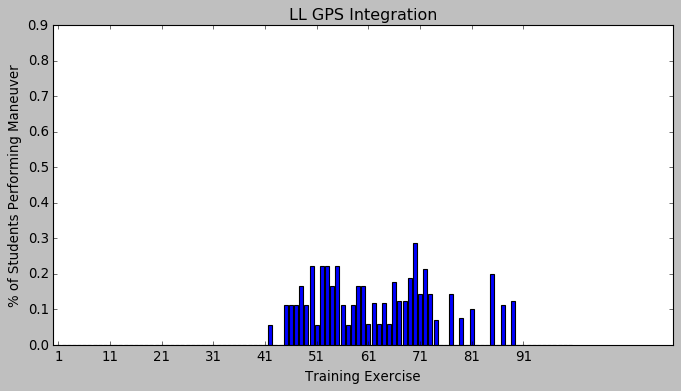

Tactical Maneuvering
TacticalManeuvering


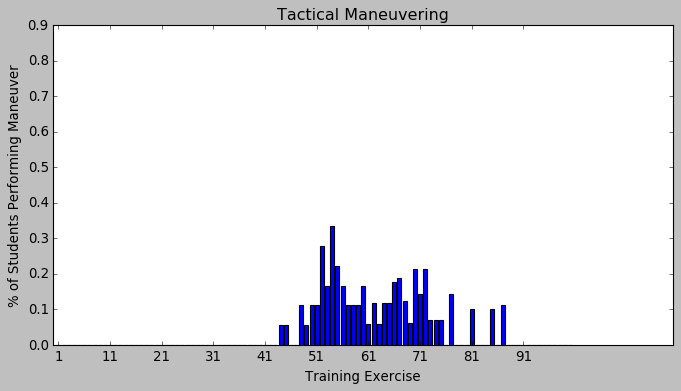

LL Lead Change
LLLeadChange


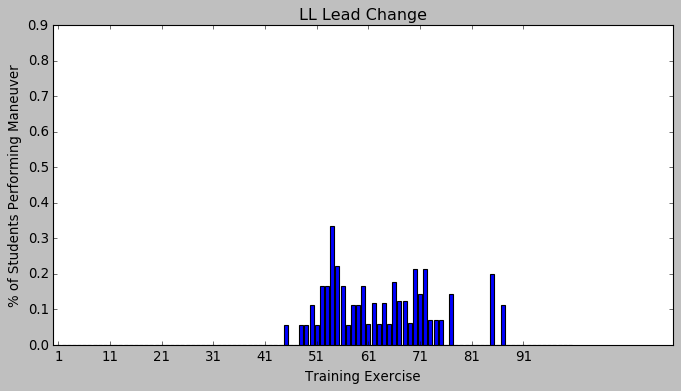

In [53]:
for index, count in maneuverPerc.iterrows():
    if index in lowLevelNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Four Ship Admin
FourShipAdmin


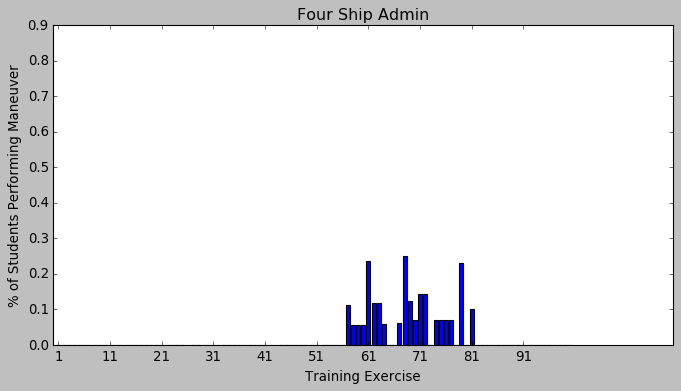

Fluid 4
Fluid4


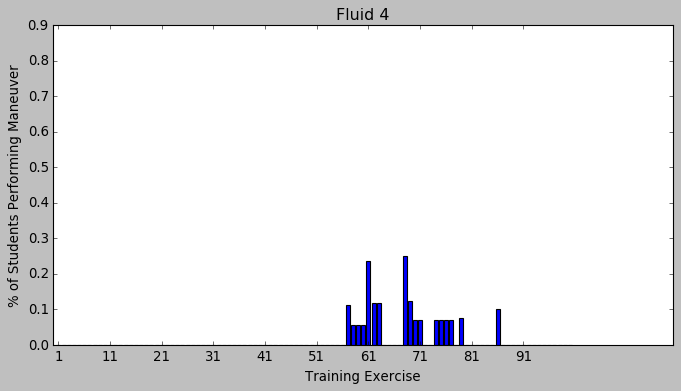

Box Formation
BoxFormation


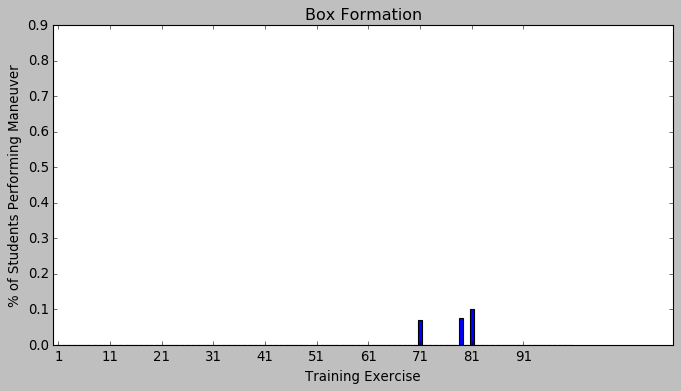

Offset Box
OffsetBox


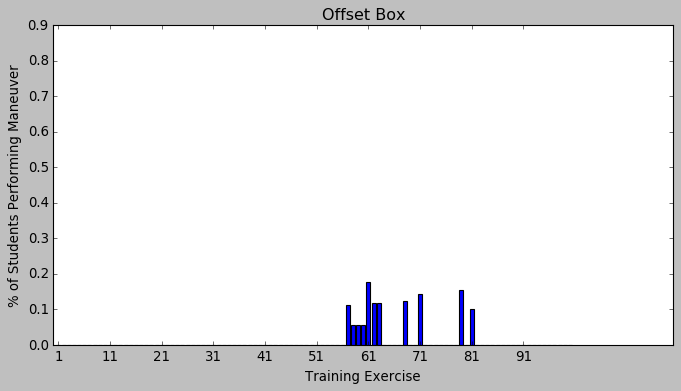

Wall
Wall


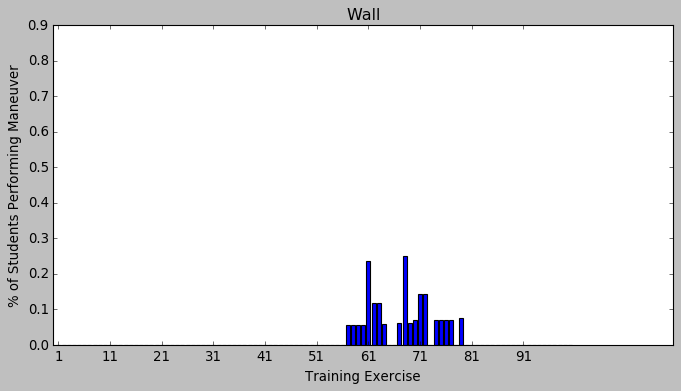

4-Ship Fingertip
4-ShipFingertip


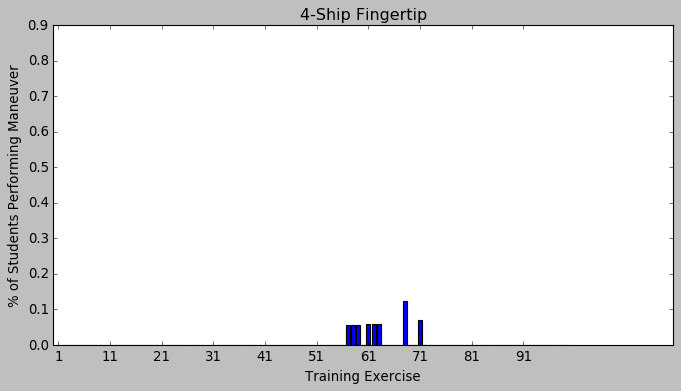

4-Ship Straight Ahead Rejoin
4-ShipStraightAheadRejoin


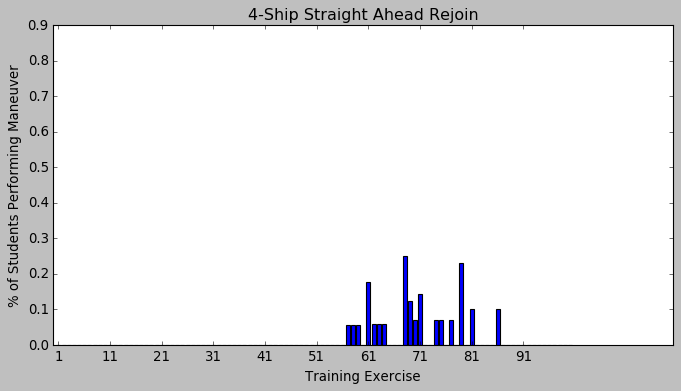

4-Ship Turning Rejoin
4-ShipTurningRejoin


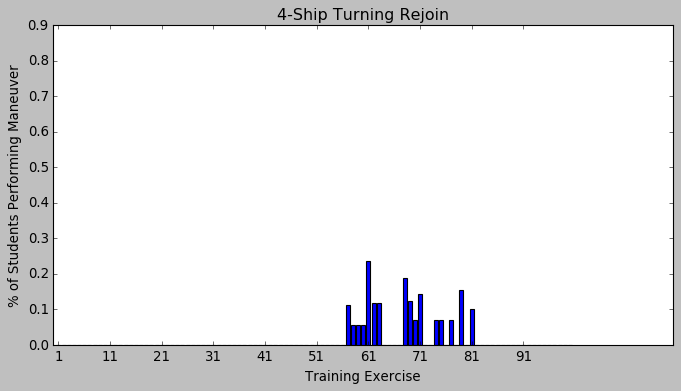

In [54]:
for index, count in maneuverPerc.iterrows():
    if index in fourShipFormationNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Heat to Guns Setup
HeattoGunsSetup


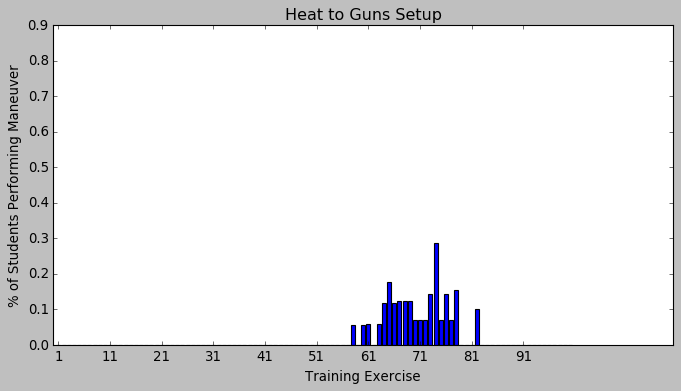

Heat to Guns Maneuvering 
HeattoGunsManeuvering


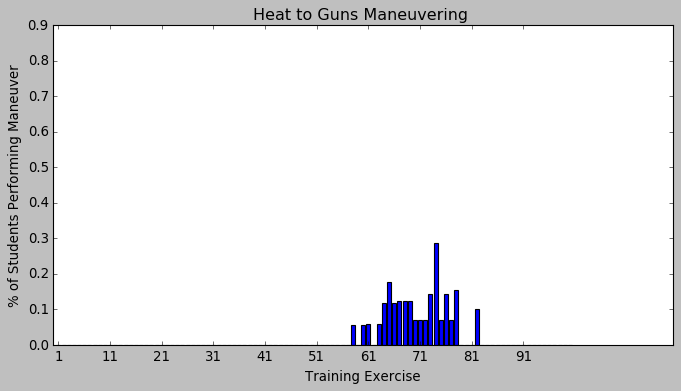

Fuel Awareness/Management
FuelAwarenessManagement


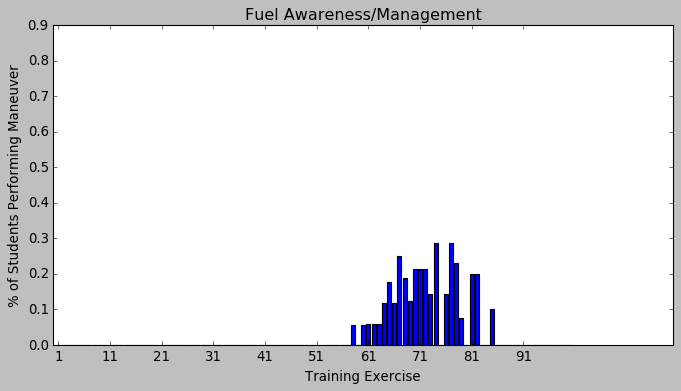

Advanced Handling
AdvancedHandling


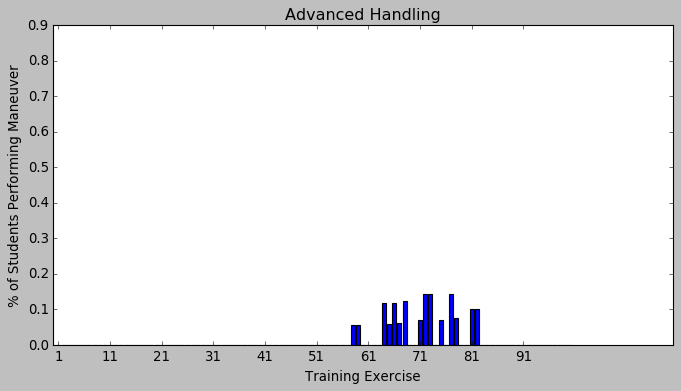

Perch Setups
PerchSetups


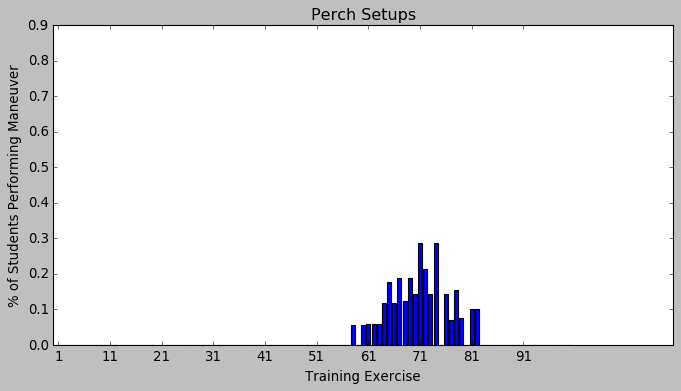

Maneuver Selection
ManeuverSelection


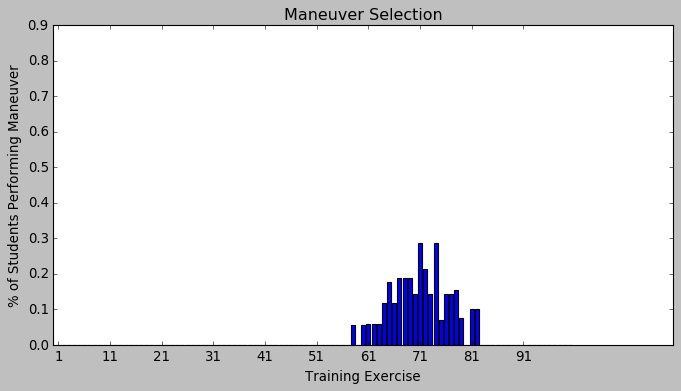

Offensive Fighter Mnvr Exec
OffensiveFighterMnvrExec


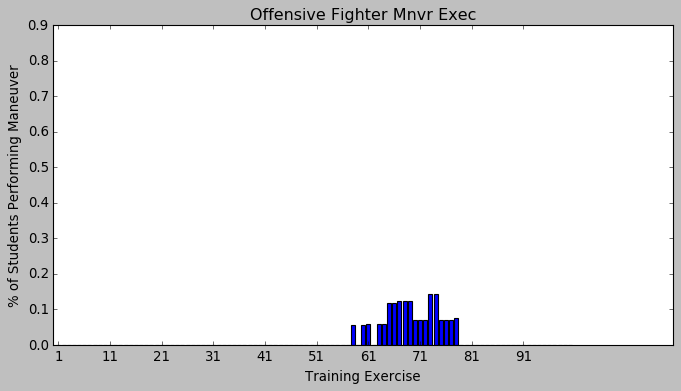

Defensive Fighter Mnvr Exec
DefensiveFighterMnvrExec


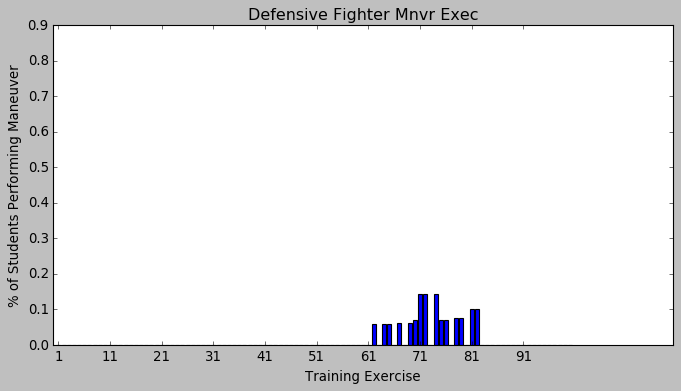

CZ Recognition
CZRecognition


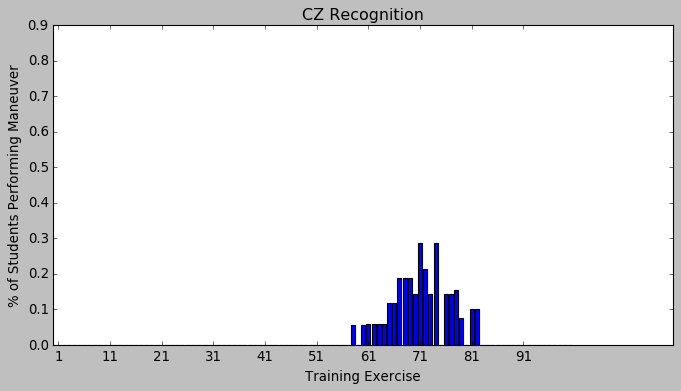

Air to Air Weapons Employ
AirtoAirWeaponsEmploy


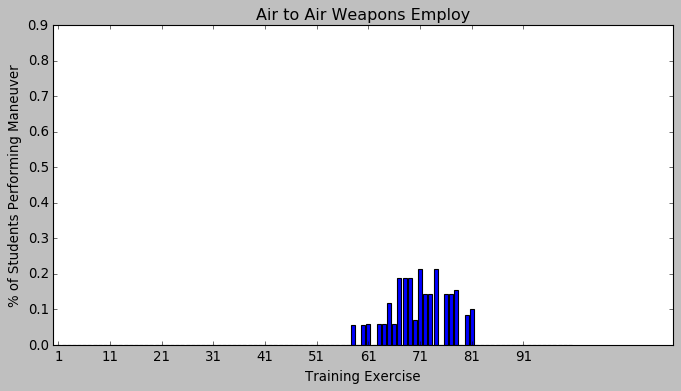

HA Lead Turn Exercise
HALeadTurnExercise


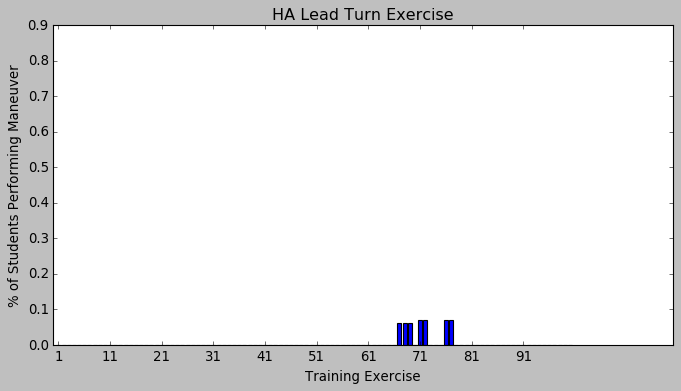

HA Butterfly Setups
HAButterflySetups


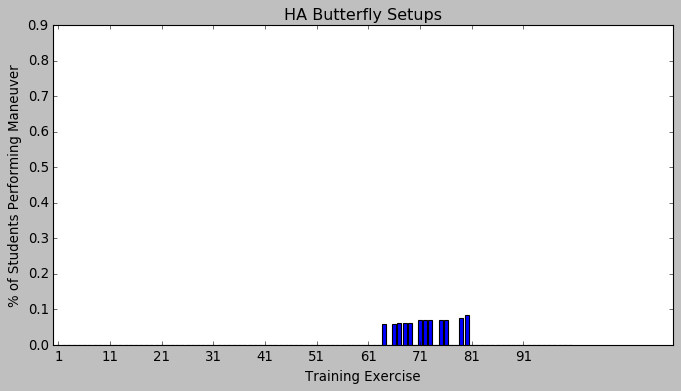

HA BFM Flt Analysis
HABFMFltAnalysis


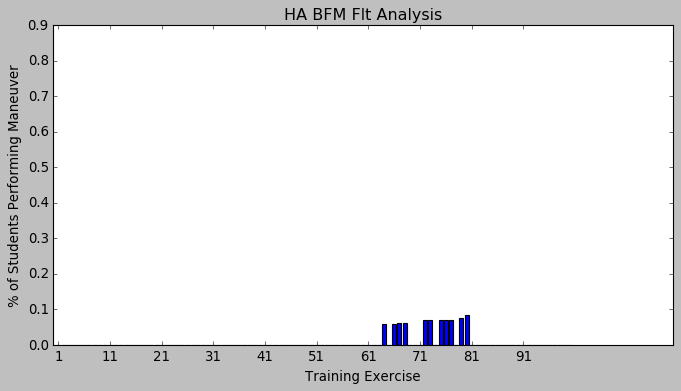

SA Conventional Range
SAConventionalRange


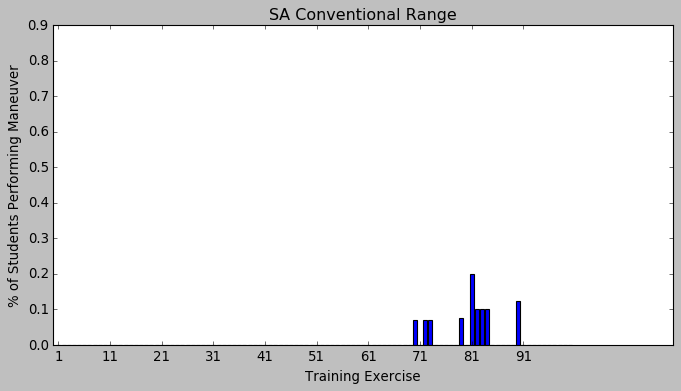

SA Tactical Range Proc
SATacticalRangeProc


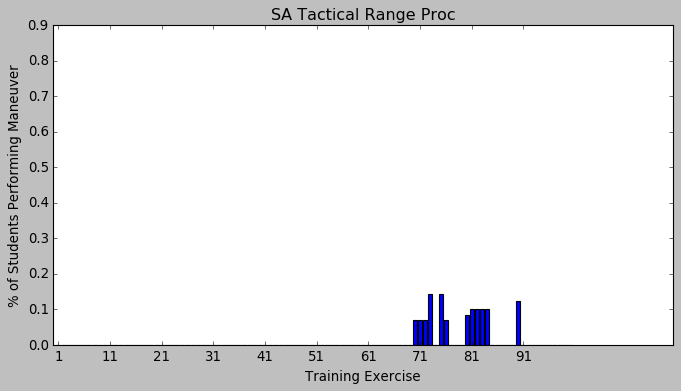

SA Safe-Excape Maneuver
SASafe-ExcapeManeuver


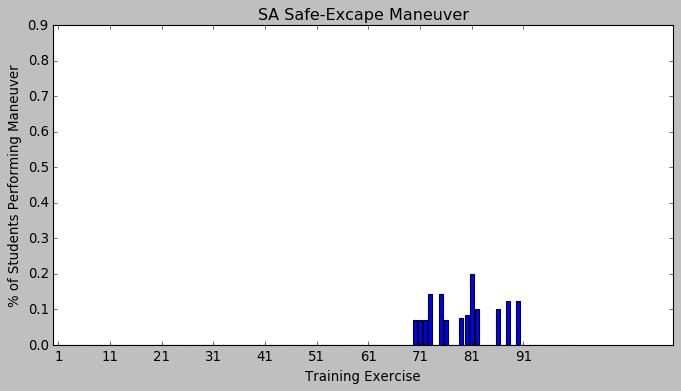

SA Threat Reaction
SAThreatReaction


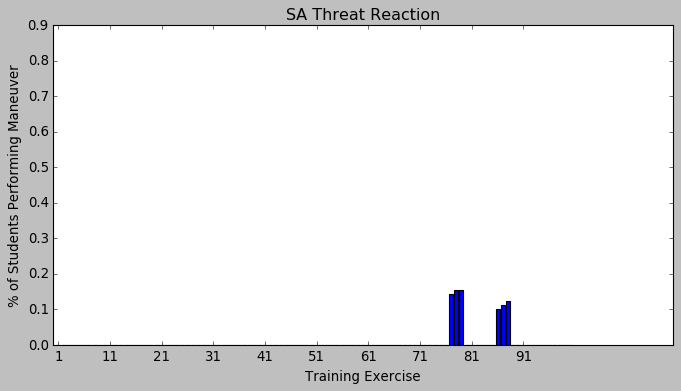

SA Weapons Employment
SAWeaponsEmployment


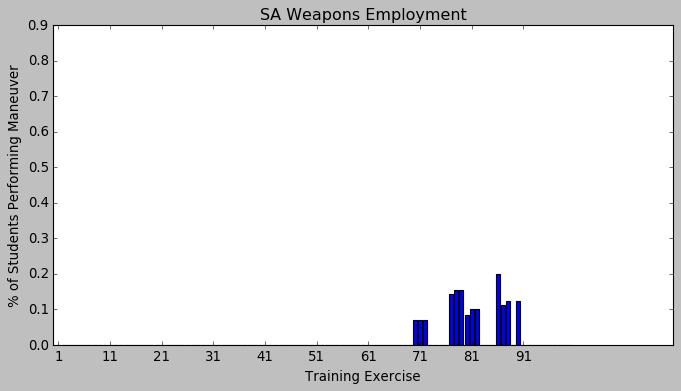

Air to Ground Error Analysis
AirtoGroundErrorAnalysis


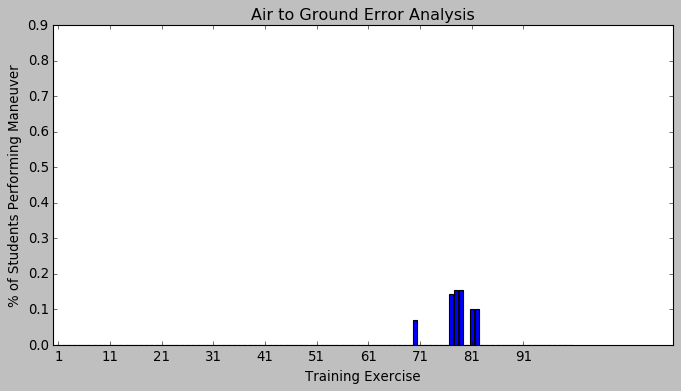

TACS/JFIRE Procedures
TACSJFIREProcedures


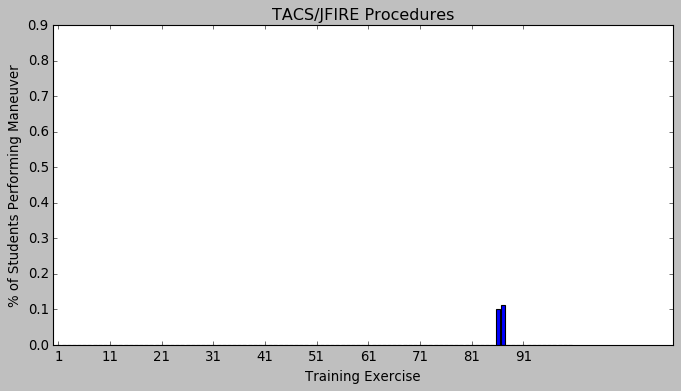

Air to Gnd 2-Ship Mutual Supt
AirtoGnd2-ShipMutualSupt


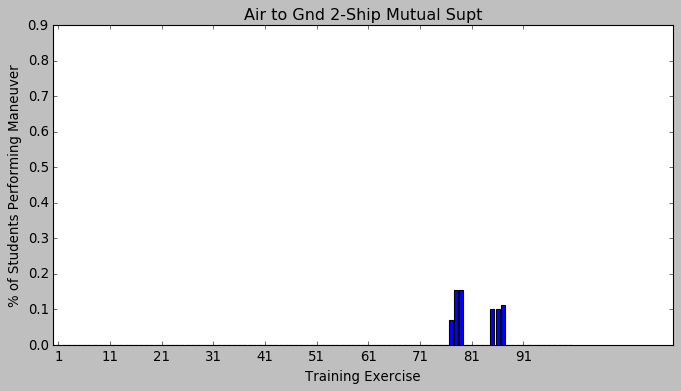

In [55]:
for index, count in maneuverPerc.iterrows():
    if index in cafIntroNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

Mission Management
MissionManagement


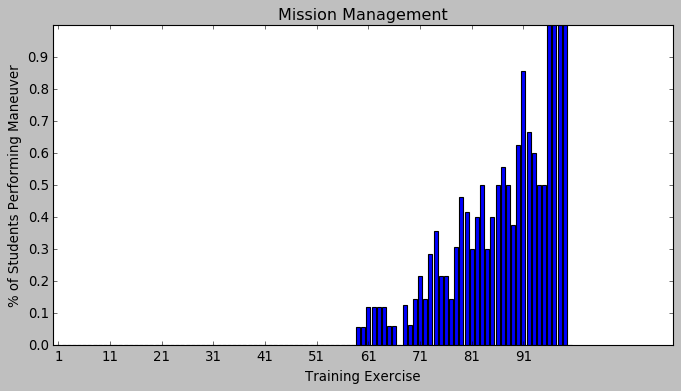

VFR Arrival
VFRArrival


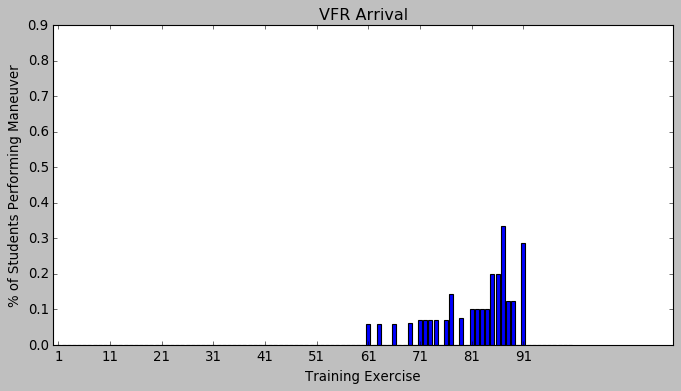

Tanker Procedures
TankerProcedures


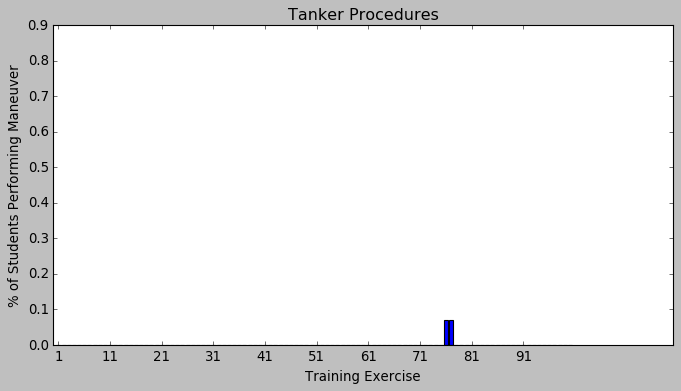

Reciever Procedures
RecieverProcedures


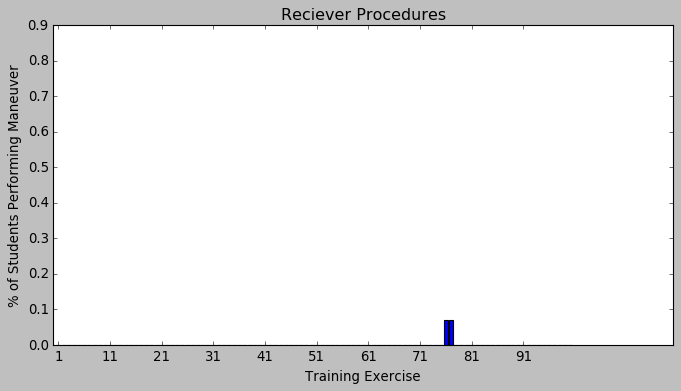

Airdrop Procedures
AirdropProcedures


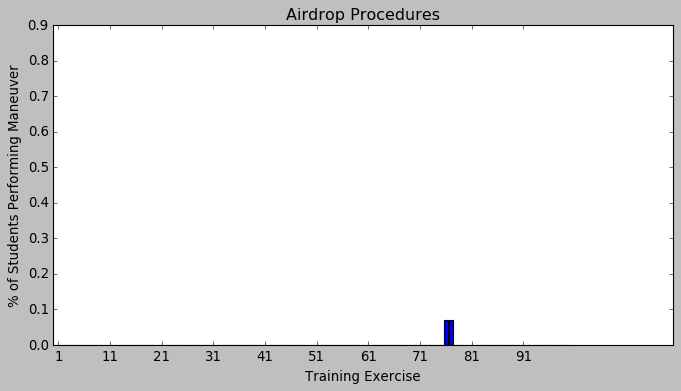

Crew Coordination
CrewCoordination


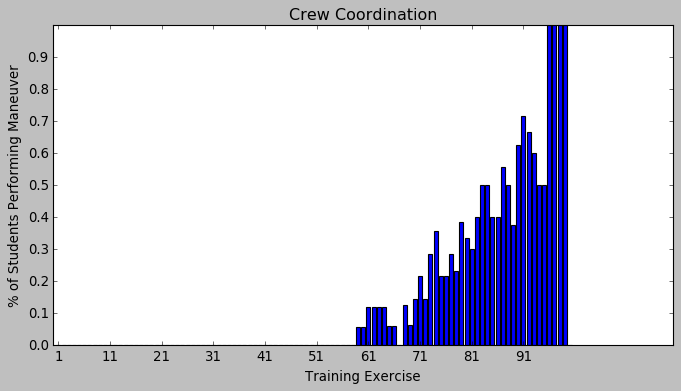

Single Engine Approach
SingleEngineApproach


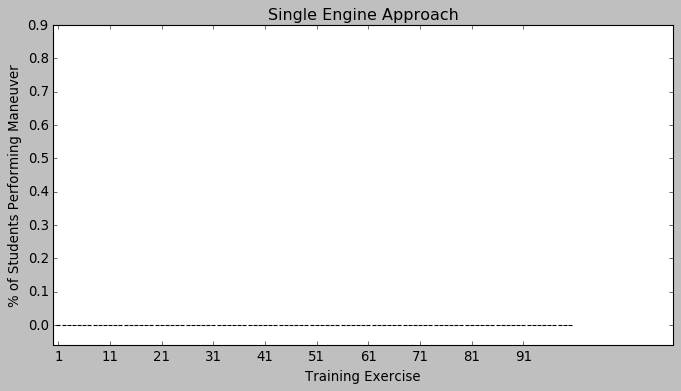

Single Engine GA/Missed Appch
SingleEngineGAMissedAppch


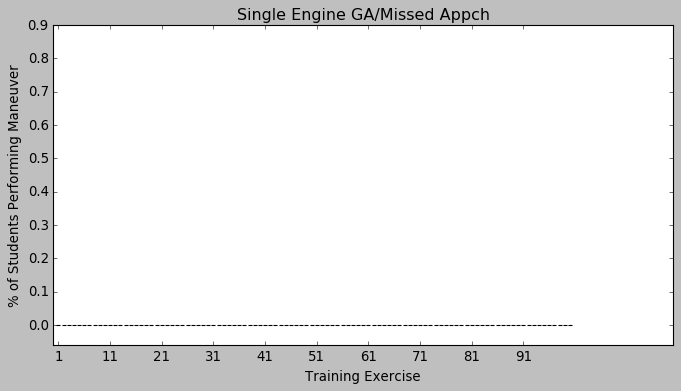

A/R Overrun
AROverrun


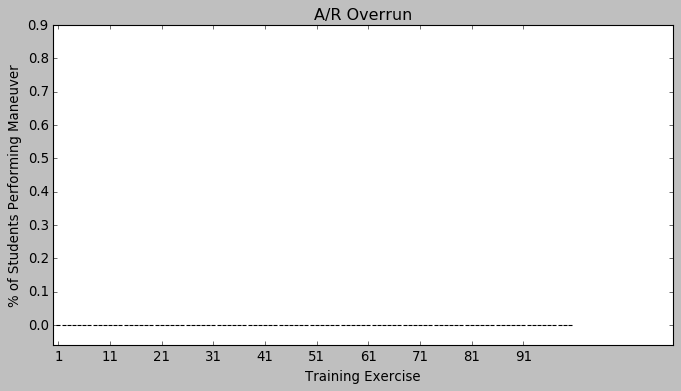

A/R Breakaway
ARBreakaway


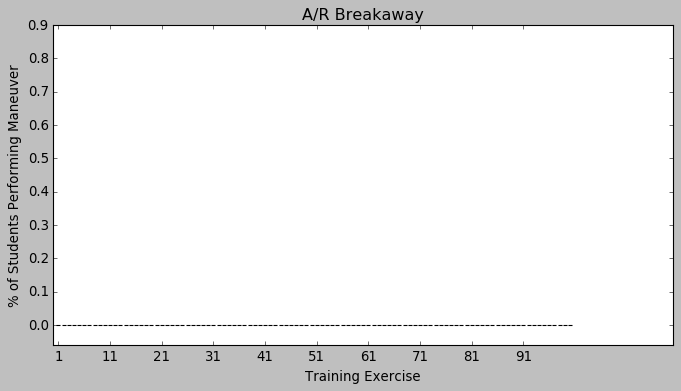

FD/AP Operations
FDAPOperations


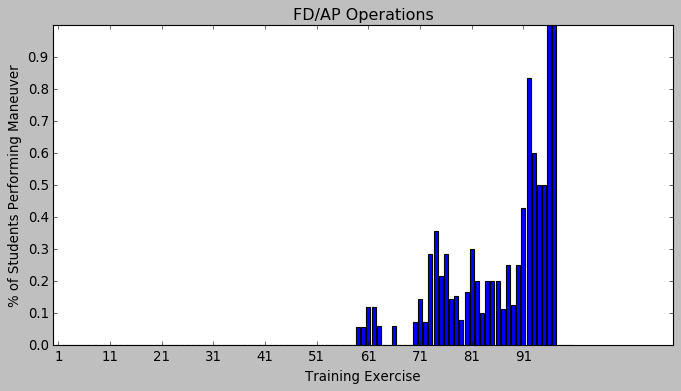

FMS Operations
FMSOperations


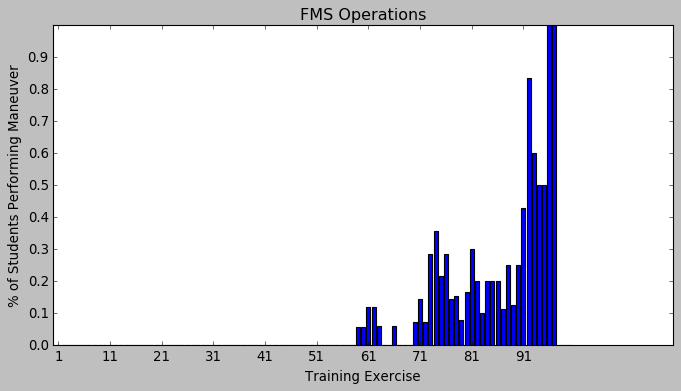

In [56]:
for index, count in maneuverPerc.iterrows():
    if index in mafIntroNames:
    #print(x)
    
        plt.figure(num=3, figsize=(10, 5), dpi=80)
        plt.bar(x,count)
        plt.xlabel('Training Exercise')
        plt.xticks(np.arange(min(x), max(x)+1, 10.0))
        plt.ylabel('% of Students Performing Maneuver')
        plt.yticks(np.arange(0, 1, .1))
        plt.title(index)
        conden = index.replace(' ','').replace('/','').replace(')','').replace('(','')
        print(index)
        print(conden)
        flag = 'manFreq_%s' % conden
        plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/%s.png' % flag)
        plt.show()

### Make scores a fraction of individual MIF for each maneuver to more appropriately track progress

In [57]:
#list of mifs in order
maneuverMIF = [4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,3,4,3,4,4,4,4,4,3,4,4,4,4,4,4,4,4,4,4,4,4,4,3,4,4,4,4,4,4,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,3,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,4,3,4,4,4,3,3,4,4,4,4,4,3,4,4,4,3,3,4,4,4,4,4,4,4,3,4,3,3,3,3,4,3]

print(sum(maneuverMIF))
print(sum(maneuverMIF[:95]))

#make df to reference 
maneuverMIF_df = pd.DataFrame([PTNdata1.iloc[:,3:-3].columns,maneuverMIF])
maneuverMIF_df.columns = maneuverMIF_df.iloc[0]
maneuverMIF_df.drop(maneuverMIF_df.index[0],inplace=True)
maneuverMIF_df


494
374


,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,...,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations
1,4,4,4,4,4,4,4,4,4,4,...,4,4,3,4,3,3,3,3,4,3


In [58]:
#convert to dictionary for easy adjustment and checking
maneuverMIF_dict = maneuverMIF_df.to_dict('r')
maneuverMIF_dict

[{'Mission Analysis/Products': 4,
  'Ground Ops': 4,
  'Takeoff': 4,
  'Departure': 4,
  'Basic Aircraft Control': 4,
  'Cross-Check': 4,
  'Enroute Descent / Recovery': 4,
  'Inflight Checks': 4,
  'Inflight Planning': 4,
  'Clearing / Visual Lookout': 4,
  'Communication': 4,
  'Risk Mgmt / Decision Making': 4,
  'Situational Awareness': 4,
  'Task Management': 4,
  'Emergency Procedures': 4,
  'General Knowledge': 4,
  'Overhead/Closed Pattern': 4,
  'Visual St-In': 4,
  'Landing': 4,
  'No-Flap Landing': 3,
  'Go-Around': 4,
  'Emergency Landing Pattern': 3,
  'G-Awareness': 4,
  'TP Stalls': 4,
  'Slow Flight': 4,
  'Power On Stalls': 4,
  'Contact Recoveries': 4,
  'Spin Recovery': 3,
  'Aileron Roll': 4,
  'Barrel Roll': 4,
  'Pitchback / Sliceback': 4,
  'Cloverleaf': 4,
  'Cuban Eight': 4,
  'Immelmann': 4,
  'Lazy Eight': 4,
  'Loop': 4,
  'Split S': 4,
  'Vertical S': 4,
  'Unusual Attitudes': 4,
  'Steep Turns': 4,
  'Intercept / Maintain Arc': 4,
  'Fix to Fix': 3,
  'Hold

In [59]:
#convert to fraction over individual mifs
PTNdata1_frac = PTNdata1.iloc[:,3:-3]/maneuverMIF
PTNdata1_frac = PTNdata1_frac.replace(np.nan,np.float64(0))
PTNdata1_frac.head()

,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,...,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations
0,0.25,0.5,0.50,0.25,0.50,0.25,0.5,0.25,0.25,0.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.50,0.5,0.50,0.50,0.50,0.25,0.5,0.25,0.50,0.25,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.25,0.5,0.25,0.25,0.25,0.25,0.5,0.25,0.25,0.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.50,0.5,0.75,0.50,0.50,0.50,0.5,0.50,0.50,0.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.50,0.5,0.50,0.50,0.50,0.50,0.5,0.25,0.50,0.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Metric Calculations

In [60]:
#expanding viewing capability
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [61]:
PTNdata1.iloc[:,3:-3] = PTNdata1_frac
PTNdata1.head()

,Student ID,Training Date,Flight/Sim #,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Heat to Guns Setup,Heat to Guns Maneuvering,Fuel Awareness/Management,Advanced Handling,Perch Setups,Maneuver Selection,Offensive Fighter Mnvr Exec,Defensive Fighter Mnvr Exec,CZ Recognition,Air to Air Weapons Employ,HA Lead Turn Exercise,HA Butterfly Setups,HA BFM Flt Analysis,SA Conventional Range,SA Tactical Range Proc,SA Safe-Excape Maneuver,SA Threat Reaction,SA Weapons Employment,Air to Ground Error Analysis,TACS/JFIRE Procedures,Air to Gnd 2-Ship Mutual Supt,Mission Management,VFR Arrival,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations,Device,Training Exercise,Total MIF
0,1,2018-04-02,Sim #2,0.25,0.5,0.50,0.25,0.50,0.25,0.5,0.25,0.25,0.50,0.25,0.25,0.25,0.25,0.50,0.50,0.50,0.50,0.50,0.0,0.25,0.0,0.0,0.5,0.5,0.5,0.00,0.000000,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,36
1,1,2018-04-03,Sim #3,0.50,0.5,0.50,0.50,0.50,0.25,0.5,0.25,0.50,0.25,0.25,0.25,0.25,0.25,0.50,0.50,0.00,0.00,0.50,0.0,0.50,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,0.50,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,49
2,1,2018-04-04,Flight #1,0.25,0.5,0.25,0.25,0.25,0.25,0.5,0.25,0.25,0.50,0.25,0.25,0.25,0.25,0.25,0.25,0.00,0.25,0.25,0.0,0.25,0.0,0.5,0.5,0.0,0.5,0.00,0.000000,0.5,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,57
3,1,2018-04-0

In [62]:

#define lengths of all categories
basicManeuverLength = len(basicManeuverNames)
patternsLength = len(patternsNames)
contactLength = len(contactNames)
instrumentLength = len(instrumentNames)
basicFormationLength = len(basicFormationNames)
tacticalFormationLength = len(tacticalFormationNames)
lowLevelLength = len(lowLevelNames)
fourShipFormationLength = len(fourShipFormationNames)
cafIntroLength = len(cafIntroNames)
mafIntroLength = len(mafIntroNames)

#make sure the sum includes all maneuvers
print([basicManeuverLength,patternsLength,contactLength,instrumentLength,basicFormationLength,tacticalFormationLength,lowLevelLength,fourShipFormationLength,cafIntroLength,mafIntroLength])

[16, 6, 15, 12, 21, 9, 8, 8, 21, 12]


In [63]:
#total number of maneuvers including maf/caf
print('total number of maneuvers including maf/caf:',sum([basicManeuverLength,patternsLength,contactLength,instrumentLength,basicFormationLength,tacticalFormationLength,lowLevelLength,fourShipFormationLength,cafIntroLength,mafIntroLength]))

#total number of maneuvers excluding maf/caf
print('total number of maneuvers excluding maf/caf:',sum([basicManeuverLength,patternsLength,contactLength,instrumentLength,basicFormationLength,tacticalFormationLength,lowLevelLength,fourShipFormationLength]))

total number of maneuvers including maf/caf: 128
total number of maneuvers excluding maf/caf: 95


In [64]:
firstManCol = 3 #first maneuver column is in column 4

#define column ranges for each maneuver category
basicManeuverRange = range(firstManCol,firstManCol + basicManeuverLength)
patternsRange = range(max(basicManeuverRange)+1,max(basicManeuverRange) + patternsLength)
contactRange = range(max(patternsRange)+1,max(patternsRange) + contactLength)
instrumentRange = range(max(contactRange)+1,max(contactRange)+instrumentLength)
basicFormationRange = range(max(instrumentRange)+1,max(instrumentRange)+basicFormationLength)
tacticalFormationRange = range(max(basicFormationRange)+1,max(basicFormationRange)+tacticalFormationLength)
lowLevelRange = range(max(tacticalFormationRange)+1,max(tacticalFormationRange)+lowLevelLength)
fourShipFormationRange = range(max(lowLevelRange)+1,max(lowLevelRange)+fourShipFormationLength)
cafIntroRange = range(max(fourShipFormationRange)+1,max(fourShipFormationRange)+cafIntroLength)
mafIntroRange = range(max(cafIntroRange)+1,max(cafIntroRange)+mafIntroLength)

#make sure ranges line up
print(basicManeuverRange,patternsRange,contactRange,instrumentRange,basicFormationRange,tacticalFormationRange,lowLevelRange,fourShipFormationRange,cafIntroRange,mafIntroRange)

range(3, 19) range(19, 24) range(24, 38) range(38, 49) range(49, 69) range(69, 77) range(77, 84) range(84, 91) range(91, 111) range(111, 122)


In [65]:
#define dictionary for value look up of column ranges

rangeDict = dict({
    
'RangebasicManeuver' : [min(basicManeuverRange),max(basicManeuverRange)+1],
'Rangepatterns' : [min(patternsRange),max(patternsRange)+1],
'Rangecontact' : [min(contactRange),max(contactRange)+1],
'Rangeinstrument'  : [min(instrumentRange),max(instrumentRange)+1],
'RangebasicFormation'  : [min(basicFormationRange),max(basicFormationRange)+1],
'RangetacticalFormation'  : [min(tacticalFormationRange),max(tacticalFormationRange)+1],
'RangelowLevel'  : [min(lowLevelRange),max(lowLevelRange)+1],
'RangefourShipFormation'  : [min(fourShipFormationRange),max(fourShipFormationRange)+1],
'RangecafIntro' : [min(cafIntroRange),max(cafIntroRange)+1],
'RangemafIntro'  : [min(mafIntroRange),max(mafIntroRange)+1],
})


In [66]:
#add column for FPS metric
PTNdata1['FPS'] = [0]*len(PTNdata1)

#PTNdata1.iloc[j,i] where j is training exercise number and i is training exercise between 3 and -3
PTNdata1.head()

,Student ID,Training Date,Flight/Sim #,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Heat to Guns Setup,Heat to Guns Maneuvering,Fuel Awareness/Management,Advanced Handling,Perch Setups,Maneuver Selection,Offensive Fighter Mnvr Exec,Defensive Fighter Mnvr Exec,CZ Recognition,Air to Air Weapons Employ,HA Lead Turn Exercise,HA Butterfly Setups,HA BFM Flt Analysis,SA Conventional Range,SA Tactical Range Proc,SA Safe-Excape Maneuver,SA Threat Reaction,SA Weapons Employment,Air to Ground Error Analysis,TACS/JFIRE Procedures,Air to Gnd 2-Ship Mutual Supt,Mission Management,VFR Arrival,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations,Device,Training Exercise,Total MIF,FPS
0,1,2018-04-02,Sim #2,0.25,0.5,0.50,0.25,0.50,0.25,0.5,0.25,0.25,0.50,0.25,0.25,0.25,0.25,0.50,0.50,0.50,0.50,0.50,0.0,0.25,0.0,0.0,0.5,0.5,0.5,0.00,0.000000,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,36,0
1,1,2018-04-03,Sim #3,0.50,0.5,0.50,0.50,0.50,0.25,0.5,0.25,0.50,0.25,0.25,0.25,0.25,0.25,0.50,0.50,0.00,0.00,0.50,0.0,0.50,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,0.50,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,49,0
2,1,2018-04-04,Flight #1,0.25,0.5,0.25,0.25,0.25,0.25,0.5,0.25,0.25,0.50,0.25,0.25,0.25,0.25,0.25,0.25,0.00,0.25,0.25,0.0,0.25,0.0,0.5,0.5,0.0,0.5,0.00,0.000000,0.5,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,57,0
3,1

In [67]:
#set weights for each category
basicManeuverWeight = 6
patternsWeight = 6
contactWeight = 6
instrumentWeight = 6
basicFormationWeight = 6
tacticalFormationWeight = 6
lowLevelWeight = 6
fourShipFormationWeight = 6
cafIntroWeight = 6
mafIntroWeight = 6

In [68]:
#define weight lists
categoryMIFweight = [basicManeuverWeight,patternsWeight,contactWeight,instrumentWeight,basicFormationWeight,tacticalFormationWeight,lowLevelWeight,fourShipFormationWeight,cafIntroWeight,mafIntroWeight]
categorySeenweight = [(x-3) for x in [basicManeuverWeight,patternsWeight,contactWeight,instrumentWeight,basicFormationWeight,tacticalFormationWeight,lowLevelWeight,fourShipFormationWeight,cafIntroWeight,mafIntroWeight]]


In [69]:
def check(mylist, val): 
    return(all(x == val for x in mylist)) 

In [70]:
#FINAL CALCULATIONS
for s in PTNdata1['Student ID'].unique():
    for j in PTNdata1['Training Exercise'].unique():
        
        #list of all points awarded
        manScorePoints = [0]*num_maneuvers
        
        for manNum,manScore in enumerate(PTNdata1.iloc[:,3:-4]):
            #maneuver has reached max mif AKA proficiency. adds 2.25 for improving.
            if PTNdata1[PTNdata1["Student ID"]==s][manScore][0:j].max()>=1:
                manScorePoints[manNum] = 5
            #maneuver has been seen but max grade 1. adds 1.5 for improving Scores in thirds to account for maneuvers with MIF of 3. 
            elif (PTNdata1[PTNdata1["Student ID"]==s][manScore][0:j].max()<=(1/3) and PTNdata1[PTNdata1["Student ID"]==s][manScore][0:j].max()>0):
                manScorePoints[manNum] = 1.5
            #maneuver ha been seen and max grade 2. adds 0.75 for improving.
            elif (PTNdata1[PTNdata1["Student ID"]==s][manScore][0:j].max()<=(2/3) and PTNdata1[PTNdata1["Student ID"]==s][manScore][0:j].max()>(1/3)):
                manScorePoints[manNum] = 2.25
            #maneuver has been seen and max grade 3. adds 0.5 for improving.
            elif (PTNdata1[PTNdata1["Student ID"]==s][manScore][0:j].max()<1 and PTNdata1[PTNdata1["Student ID"]==s][manScore][0:j].max()>=(2/3)):
                manScorePoints[manNum] = 2.75
                
        #boolean for categories in terms of maneuvers
        for catNum, catName in enumerate(categoryList):
            catSeen = [0]*len(categoryList)
            catMIF = [0]*len(categoryList)    

        #boolean if all maneuvers in a category have been seen, in terms of maneuvers 
            currentRange = 'Range%s' % catName

            if 0 in manScorePoints[rangeDict[currentRange][0]:rangeDict[currentRange][1]]:
                catSeen[catNum] = 0
            else:
                catSeen[catNum] = 1
                
        #boolean if all maneuvers in a category have maxed mif, in terms of maneuvers
            if (check(manScorePoints[rangeDict[currentRange][0]:rangeDict[currentRange][1]],1)):
                catMIF[catNum] = 1
            else:
                catMIF[catNum] = 0
                
        #calculate FPS score
        FPScalc = sum([categoryMIFweight[x]*catMIF[x] for x in range(len(catMIF))]) + sum([categorySeenweight[x]*catSeen[x] for x in range(len(catSeen))]) + sum(manScorePoints)
        
        #insert score in correct spot in data table
        PTNdata1.loc[(PTNdata1['Student ID']==s)&(PTNdata1['Training Exercise']==j),'FPS']= FPScalc
        
    print('Student ID', s, 'FPS scores calculated')
        

Student ID 1 FPS scores calculated
Student ID 2 FPS scores calculated
Student ID 3 FPS scores calculated
Student ID 4 FPS scores calculated
Student ID 5 FPS scores calculated
Student ID 7 FPS scores calculated
Student ID 8 FPS scores calculated
Student ID 9 FPS scores calculated
Student ID 10 FPS scores calculated
Student ID 11 FPS scores calculated
Student ID 12 FPS scores calculated
Student ID 13 FPS scores calculated
Student ID 14 FPS scores calculated
Student ID 15 FPS scores calculated
Student ID 16 FPS scores calculated
Student ID 17 FPS scores calculated
Student ID 18 FPS scores calculated
Student ID 19 FPS scores calculated


### Calculate Max FPS score

In [71]:
#calculate max FPS score excluding maf and caf maneuvers
#list of all points awarded
maxScorePoints = [5]*(num_maneuvers-len(cafIntroNames)-len(mafIntroNames))

#boolean for categories in terms of maneuvers
for catNum, catName in enumerate(categoryList):
    catSeen = [1]*(len(categoryList) -2)
    catMIF = [1]*(len(categoryList) -2)

#calculate FPS score
maxFPScalc_stand = sum([categoryMIFweight[x]*catMIF[x] for x in range(len(catMIF))]) + sum([categorySeenweight[x]*catSeen[x] for x in range(len(catSeen))]) + sum(maxScorePoints)
print('maximum standard FPS score is: ',maxFPScalc_stand)

maximum standard FPS score is:  547


In [72]:
#calculate mac FPS score excluding caf maneuvers
#list of all points awarded
maxScorePoints = [5]*(num_maneuvers-len(cafIntroNames))

#boolean for categories in terms of maneuvers
for catNum, catName in enumerate(categoryList):
    catSeen = [1]*(len(categoryList) -1)
    catMIF = [1]*(len(categoryList) -1) 
    
#calculate FPS score
maxFPScalc_maf = sum([categoryMIFweight[x]*catMIF[x] for x in range(len(catMIF))]) + sum([categorySeenweight[x]*catSeen[x] for x in range(len(catSeen))]) + sum(maxScorePoints)
print('maximum maf FPS score is: ',maxFPScalc_maf)

maximum maf FPS score is:  616


In [73]:
#Calculate max FPS score with maf and caf maneuvers
#list of all points awarded
maxScorePoints = [5]*num_maneuvers

#boolean for categories in terms of maneuvers
for catNum, catName in enumerate(categoryList):
    catSeen = [0]*len(categoryList)
    catMIF = [0]*len(categoryList)    

#boolean if all maneuvers in a category have been seen, in terms of maneuvers 
    currentRange = 'Range%s' % catName

    if 0 in maxScorePoints[rangeDict[currentRange][0]:rangeDict[currentRange][1]]:
        catSeen[catNum] = 0
    else:
        catSeen[catNum] = 1

#boolean if all maneuvers in a category have maxed mif, in terms of maneuvers
    if (check(maxScorePoints[rangeDict[currentRange][0]:rangeDict[currentRange][1]],1)):
        catMIF[catNum] = 1
    else:
        catMIF[catNum] = 0

#calculate FPS score
maxFPScalc_caf = sum([categoryMIFweight[x]*catMIF[x] for x in range(len(catMIF))]) + sum([categorySeenweight[x]*catSeen[x] for x in range(len(catSeen))]) + sum(maxScorePoints)
print('maximum caf FPS score is: ',maxFPScalc_caf)

maximum caf FPS score is:  643


### Calculate max MIF scores

In [74]:
#max possible total mif score excluding maf and caf
maxMIFcalc_stand = sum(maneuverMIF[0:-(len(mafIntroNames)+len(cafIntroNames))])
print(maxMIFcalc_stand)

#max possible total mif score excluding caf
maxMIFcalc_maf = sum(maneuverMIF[0:-len(cafIntroNames)])
print(maxMIFcalc_maf)


#max possible total mif score
maxMIFcalc_caf = sum(maneuverMIF)
print(maxMIFcalc_caf)

374
419
494


### Save data frames

In [75]:
PTNdata1.head()

,Student ID,Training Date,Flight/Sim #,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Heat to Guns Setup,Heat to Guns Maneuvering,Fuel Awareness/Management,Advanced Handling,Perch Setups,Maneuver Selection,Offensive Fighter Mnvr Exec,Defensive Fighter Mnvr Exec,CZ Recognition,Air to Air Weapons Employ,HA Lead Turn Exercise,HA Butterfly Setups,HA BFM Flt Analysis,SA Conventional Range,SA Tactical Range Proc,SA Safe-Excape Maneuver,SA Threat Reaction,SA Weapons Employment,Air to Ground Error Analysis,TACS/JFIRE Procedures,Air to Gnd 2-Ship Mutual Supt,Mission Management,VFR Arrival,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations,Device,Training Exercise,Total MIF,FPS
0,1,2018-04-02,Sim #2,0.25,0.5,0.50,0.25,0.50,0.25,0.5,0.25,0.25,0.50,0.25,0.25,0.25,0.25,0.50,0.50,0.50,0.50,0.50,0.0,0.25,0.0,0.0,0.5,0.5,0.5,0.00,0.000000,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,36,44.25
1,1,2018-04-03,Sim #3,0.50,0.5,0.50,0.50,0.50,0.25,0.5,0.25,0.50,0.25,0.25,0.25,0.25,0.25,0.50,0.50,0.00,0.00,0.50,0.0,0.50,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.5,0.5,0.5,0.0,0.0,0.0,0.0,0.0,0.50,0.0,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,49,57.75
2,1,2018-04-04,Flight #1,0.25,0.5,0.25,0.25,0.25,0.25,0.5,0.25,0.25,0.50,0.25,0.25,0.25,0.25,0.25,0.25,0.00,0.25,0.25,0.0,0.25,0.0,0.5,0.5,0.0,0.5,0.00,0.000000,0.5,0.0,0.0,0.25,0.25,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.25,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,

In [76]:
#Export final scores to CSV file 
PTNdata1_final = PTNdata1.drop('Flight/Sim #',axis = 1)
PTNdata1_final.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_mif.csv')

#Export final mif ratios to CSV file
PTNdata1_final.iloc[:,2:-4] = PTNdata1_final.iloc[:,2:-4]*maneuverMIF
PTNdata1_final.to_csv(r'/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Python Files/PTNdata1_master.csv')

In [77]:
PTNdata1_final.head()

,Student ID,Training Date,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Heat to Guns Setup,Heat to Guns Maneuvering,Fuel Awareness/Management,Advanced Handling,Perch Setups,Maneuver Selection,Offensive Fighter Mnvr Exec,Defensive Fighter Mnvr Exec,CZ Recognition,Air to Air Weapons Employ,HA Lead Turn Exercise,HA Butterfly Setups,HA BFM Flt Analysis,SA Conventional Range,SA Tactical Range Proc,SA Safe-Excape Maneuver,SA Threat Reaction,SA Weapons Employment,Air to Ground Error Analysis,TACS/JFIRE Procedures,Air to Gnd 2-Ship Mutual Supt,Mission Management,VFR Arrival,Tanker Procedures,Reciever Procedures,Airdrop Procedures,Crew Coordination,Single Engine Approach,Single Engine GA/Missed Appch,A/R Overrun,A/R Breakaway,FD/AP Operations,FMS Operations,Device,Training Exercise,Total MIF,FPS
0,1,2018-04-02,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,36,44.25
1,1,2018-04-03,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,49,57.75
2,1,2018-04-04,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,57,67.50
3,1,2018-04-06,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,3.0,3.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,2

### Graphing MIF Superscore By Training Exercise

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


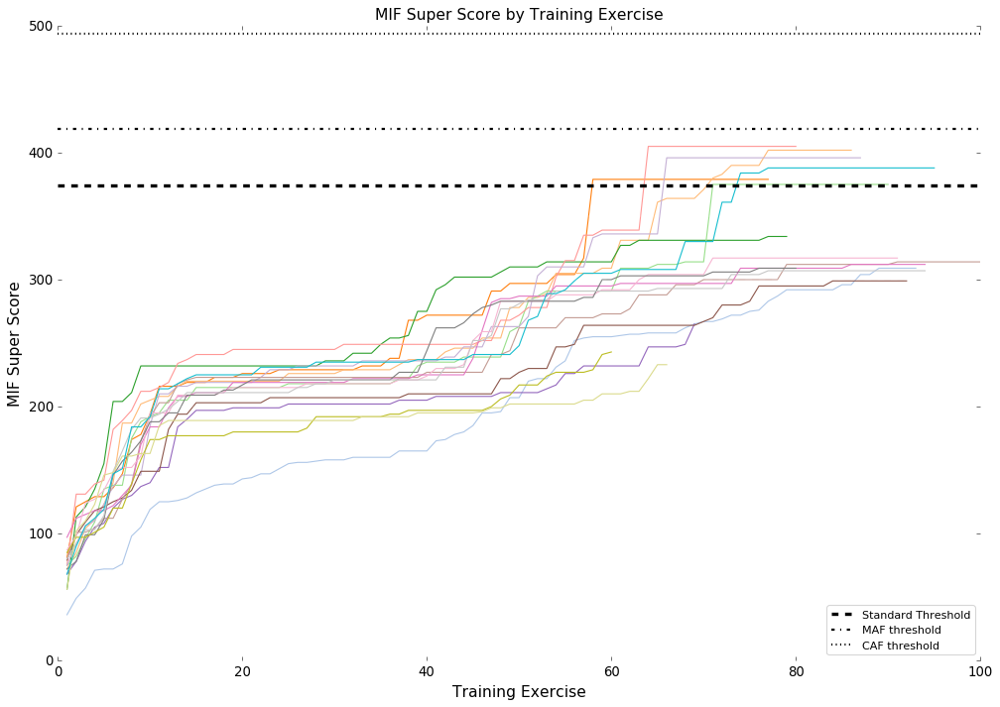

In [78]:
clr = plt.get_cmap('Set1')

# These are the "Tableau 20" colors as RGB.    
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]    
  
# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = (r / 255., g / 255., b / 255.)  

plt.figure(num=1, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='w')

for j in range(1,totalStudents + 1):
    x = PTNdata1_final[PTNdata1_final['Student ID']== j]['Training Exercise']
    y = PTNdata1_final[PTNdata1_final['Student ID']== j]['Total MIF']
    plt.plot(x,y, color=tableau20[j])
    #plt.plot(x,y, color=tableau20[j], label ='student%s'%j) #if i want to label student in legend

#plot threshold lines
Standardline = plt.axhline(y=maxMIFcalc_stand, color='black', linestyle='--', lw=3, label = 'Standard Threshold') 
MAFline = plt.axhline(y=maxMIFcalc_maf, color='black', linestyle='-.', lw=2, label = 'MAF Threshold') 
CAFline = plt.axhline(y=maxMIFcalc_caf, color='black', linestyle=':', lw=2, label = 'CAF Threshold')

# get rid of grid lines
ax = plt.subplot(111)    
ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False) 

# Provide tick lines across the plot to help your viewers trace along    
# the axis ticks. Make sure that the lines are light and small so they    
# don't obscure the primary data lines.    
for y in range(50, 401, 50):    
    plt.plot(range(0, 100), [y] * len(range(0, 100)), "--", lw=0.3, color="w", alpha=0.5)
    
    
#get rid of left margin
plt.margins(x=0)

#change style to negative(black)
#plt.style.use('dark_background')
plt.style.use('default')
plt.figure(1).patch.set_facecolor('xkcd:white')
plt.gca().set_facecolor('xkcd:white')

#basic labels
plt.title('MIF Super Score by Training Exercise', fontsize = 14)
plt.ylabel('MIF Super Score', fontsize = 14,color = 'black')
plt.xlabel('Training Exercise', fontsize = 14,color = 'black')
plt.legend([Standardline, MAFline, CAFline],['Standard Threshold','MAF threshold', 'CAF threshold'])
plt.savefig("/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/MIF-by-TrainingExercise-w.png", bbox_inches="tight")
plt.show()

### FPS by Training Exercise

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


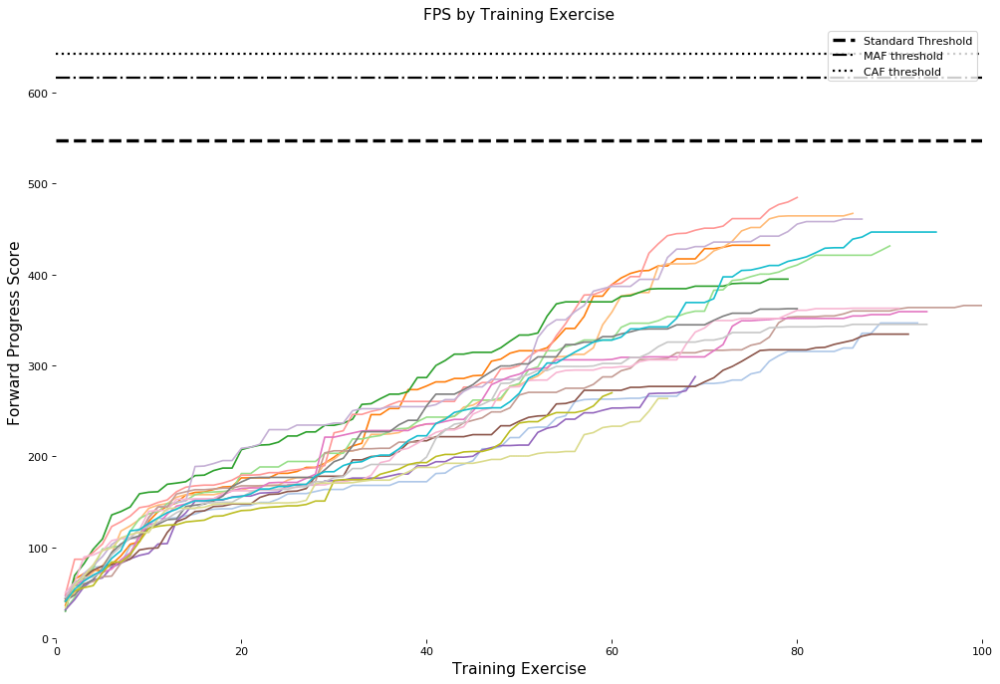

In [79]:
clr = plt.get_cmap('Set1')

# These are the "Tableau 20" colors as RGB.    
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]    
  
# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = (r / 255., g / 255., b / 255.)  

plt.figure(num=3, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='w')

for j in range(1,totalStudents + 1):
    x = PTNdata1_final[PTNdata1_final['Student ID']== j]['Training Exercise']
    y = PTNdata1_final[PTNdata1_final['Student ID']== j]['FPS']
    plt.plot(x,y, color=tableau20[j])
    #plt.plot(x,y, color=tableau20[j], label ='student%s'%j) #if i want to label student in legend

#plot threshold lines
Standardline = plt.axhline(y=maxFPScalc_stand , color='black', linestyle='--', lw=3, label = 'Standard Threshold') 
MAFline = plt.axhline(y=maxFPScalc_maf, color='black', linestyle='-.', lw=2, label = 'MAF Threshold') 
CAFline = plt.axhline(y=maxFPScalc_caf, color='black', linestyle=':', lw=2, label = 'CAF Threshold')

# get rid of grid lines
ax = plt.subplot(111)    
ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False) 

# Provide tick lines across the plot to help your viewers trace along    
# the axis ticks. Make sure that the lines are light and small so they    
# don't obscure the primary data lines.    
for y in range(50, 401, 50):    
    plt.plot(range(0, 100), [y] * len(range(0, 100)), "--", lw=0.3, color="w", alpha=0.5)
    
    
#get rid of left margin
plt.margins(x=0)

#change style to negative(black)
#plt.style.use('dark_background')
plt.style.use('default')
plt.figure(3).patch.set_facecolor('xkcd:white')
plt.gca().set_facecolor('xkcd:white')

#basic labels
plt.title('FPS by Training Exercise', fontsize = 14)
plt.ylabel('Forward Progress Score', fontsize = 14,color = 'black')
plt.xlabel('Training Exercise', fontsize = 14,color = 'black')
plt.legend([Standardline, MAFline, CAFline],['Standard Threshold','MAF threshold', 'CAF threshold'])
#plt.savefig("/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Course Work/Thesis Work/Visuals/FPS-by-TrainingExercise-w.png", bbox_inches="tight")
plt.show()

# Recalculate MIF and FPS scores excluding MAF and CAF

# Calculating the total MIF for each student at each training exercise

In [113]:
excludingMAFCAF = PTNdata1_final.drop(cafIntroNames + mafIntroNames, axis = 1)
excludingMAFCAF.head()

,Student ID,Training Date,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Device,Training Exercise,Total MIF,FPS
0,1,2018-04-02,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,36,44.25
1,1,2018-04-03,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,49,57.75
2,1,2018-04-04,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,57,67.50
3,1,2018-04-06,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,3.0,3.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,4,71,78.25
4,1,2018-04-06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,5,72,79.00


In [114]:
########## write function for calculating MIFS and create MIF column for each student ########################

# total students in class
totalStudents = len(excludingMAFCAF['Student ID'].unique())+1

#create new column for total MIF
excludingMAFCAF['Total MIF'] = [0]*len(excludingMAFCAF)

# ##########################################################################
# ####################### replace with cleaner code if time ###########################
# ##########################################################################
#create individual dataframe for every student
for numStud in range(1,6): 
    value = excludingMAFCAF[excludingMAFCAF['Student ID'] == numStud]
    exec ("student%s=value" % (numStud))
print(type(student1))


for numStud in range(7,totalStudents+1): 
    value = excludingMAFCAF[excludingMAFCAF['Student ID'] == numStud]
    exec ("student%s=value" % (numStud))
print(type(student7))
    

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


In [115]:
student1.head()

,Student ID,Training Date,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Device,Training Exercise,Total MIF,FPS
0,1,2018-04-02,1.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,1.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,0,44.25
1,1,2018-04-03,2.0,2.0,2.0,2.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,0,57.75
2,1,2018-04-04,1.0,2.0,1.0,1.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,3,0,67.50
3,1,2018-04-06,2.0,2.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,3.0,3.0,0.0,3.0,0.0,0.0,0.0,2.0,2.0,2.0,0.0,3.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,4,0,78.25
4,1,2018-04-06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,2.0,2.0,2.0,2.0,1.0,1.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,5,0,79.00


In [125]:
###################################### replace this with cleaner code ############################################
#create mif column for each student

for i in range(0,len(student1)):
    MIF=0
    for col in student1.columns[:-2] :
        if type(student1[col][i]) == np.float64 or type(student1[col][i]) == float:
            if any(student1[col][0:i+1].notnull()): 
                MIF = MIF + int(np.nanmax(student1[col][0:i+1].values))
                #print(col, MIF)

    student1.iloc[i,-2] = MIF
print(1) 
######################################################################################################   
#for row in range(0,len(student2)):
ind = 0 
for i in student2.reset_index(drop = True).index:
    MIF=0
    for col in student2.columns[:-2] :
        if type(student2[col][i]) == np.float64 or type(student2[col][i]) == float:
            if any(student2[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student2[col][0:i+1].values))
                #print(col, MIF)
                
    student2.iloc[ind,-2] = MIF
    ind = ind + 1

print(2)   

######################################################################################################   
ind = 0 
for i in student3.index:
    MIF=0
    for col in student3.columns[:-2] :
        if type(student3[col][i]) == np.float64 or type(student3[col][i]) == float:
            if any(student3[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student3[col][0:i+1].values))
                #print(col, MIF)
                
    student3.iloc[ind,-2] = MIF
    ind = ind + 1

print(3)     
######################################################################################################   
ind = 0 
for i in student4.index:
    MIF=0
    for col in student4.columns[:-2] :
        if type(student4[col][i]) == np.float64 or type(student4[col][i]) == float:
            if any(student4[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student4[col][0:i+1].values))
                #print(col, MIF)
                
    student4.iloc[ind,-2] = MIF
    ind = ind + 1

print(4)    
######################################################################################################   
ind = 0 
for i in student5.index:
    MIF=0
    for col in student5.columns[:-2] :
        if type(student5[col][i]) == np.float64 or type(student5[col][i]) == float:
            if any(student5[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student5[col][0:i+1].values))
                #print(col, MIF)
                
    student5.iloc[ind,-2] = MIF
    ind = ind + 1
print(5)    
######################################################################################################   
# ind = 0 
# for i in student6.index:
#     MIF=0
#     for col in student6.columns :
#         if type(student6[col][i]) == np.float64 or type(student6[col][i]) == float:
#             if any(student6[col][0:ind+1].notnull()): 
#                 MIF = MIF + int(np.nanmax(student6[col][0:i+1].values))
#                 #print(col, MIF)
                
#     student6.iloc[ind,-1] = MIF
#     ind = ind + 1
# print(6)     
######################################################################################################   
ind = 0 
for i in student7.index:
    MIF=0
    for col in student7.columns[:-2] :
        if type(student7[col][i]) == np.float64 or type(student7[col][i]) == float:
            if any(student7[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student7[col][0:i+1].values))
                #print(col, MIF)
                
    student7.iloc[ind,-2] = MIF
    ind = ind + 1

print(7)     
######################################################################################################   
ind = 0 
for i in student8.index:
    MIF=0
    for col in student8.columns[:-2] :
        if type(student8[col][i]) == np.float64 or type(student8[col][i]) == float:
            if any(student8[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student8[col][0:i+1].values))
                #print(col, MIF)
                
    student8.iloc[ind,-2] = MIF
    ind = ind + 1
print(8)    
######################################################################################################   
ind = 0 
for i in student9.index:
    MIF=0
    for col in student9.columns[:-2] :
        if type(student9[col][i]) == np.float64 or type(student9[col][i]) == float:
            if any(student9[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student9[col][0:i+1].values))
                #print(col, MIF)
                
    student9.iloc[ind,-2] = MIF
    ind = ind + 1
print(9)     
######################################################################################################   
ind = 0 
for i in student10.index:
    MIF=0
    for col in student10.columns[:-2] :
        if type(student10[col][i]) == np.float64 or type(student10[col][i]) == float:
            if any(student10[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student10[col][0:i+1].values))
                #print(col, MIF)
                
    student10.iloc[ind,-2] = MIF
    ind = ind + 1
print(10)     
######################################################################################################   
ind = 0 
for i in student11.index:
    MIF=0
    for col in student11.columns[:-2] :
        if type(student11[col][i]) == np.float64 or type(student11[col][i]) == float:
            if any(student11[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student11[col][0:i+1].values))
                #print(col, MIF)
                
    student11.iloc[ind,-2] = MIF
    ind = ind + 1
print(11)     
######################################################################################################   
ind = 0 
for i in student12.index:
    MIF=0
    for col in student12.columns[:-2] :
        if type(student12[col][i]) == np.float64 or type(student12[col][i]) == float:
            if any(student12[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student12[col][0:i+1].values))
                #print(col, MIF)
                
    student12.iloc[ind,-2] = MIF
    ind = ind + 1
print(12)     
######################################################################################################   
ind = 0 
for i in student13.index:
    MIF=0
    for col in student13.columns[:-2] :
        if type(student13[col][i]) == np.float64 or type(student13[col][i]) == float:
            if any(student13[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student13[col][0:i+1].values))
                #print(col, MIF)
                
    student13.iloc[ind,-2] = MIF
    ind = ind + 1
print(13)     
######################################################################################################   
ind = 0 
for i in student14.index:
    MIF=0
    for col in student14.columns[:-2] :
        if type(student14[col][i]) == np.float64 or type(student14[col][i]) == float:
            if any(student14[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student14[col][0:i+1].values))
                #print(col, MIF)
                
    student14.iloc[ind,-2] = MIF
    ind = ind + 1
print(14)     
######################################################################################################   
ind = 0 
for i in student15.index:
    MIF=0
    for col in student15.columns[:-2] :
        if type(student15[col][i]) == np.float64 or type(student15[col][i]) == float:
            if any(student15[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student15[col][0:i+1].values))
                #print(col, MIF)
                
    student15.iloc[ind,-2] = MIF
    ind = ind + 1
print(15)     
######################################################################################################   
ind = 0 
for i in student16.index:
    MIF=0
    for col in student16.columns[:-2] :
        if type(student16[col][i]) == np.float64 or type(student16[col][i]) == float:
            if any(student16[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student16[col][0:i+1].values))
                #print(col, MIF)
                
    student16.iloc[ind,-2] = MIF
    ind = ind + 1
print(16)     
######################################################################################################   
ind = 0 
for i in student17.index:
    MIF=0
    for col in student17.columns[:-2] :
        if type(student17[col][i]) == np.float64 or type(student17[col][i]) == float:
            if any(student17[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student17[col][0:i+1].values))
                #print(col, MIF)
                
    student17.iloc[ind,-2] = MIF
    ind = ind + 1
print(17)     
######################################################################################################   
ind = 0 
for i in student18.index:
    MIF=0
    for col in student18.columns[:-2] :
        if type(student18[col][i]) == np.float64 or type(student18[col][i]) == float:
            if any(student18[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student18[col][0:i+1].values))
                #print(col, MIF)
                
    student18.iloc[ind,-2] = MIF
    ind = ind + 1
print(18) 
######################################################################################################   
ind = 0 
for i in student19.index:
    MIF=0
    for col in student19.columns[:-2] :
        if type(student19[col][i]) == np.float64 or type(student19[col][i]) == float:
            if any(student19[col][0:ind+1].notnull()): 
                MIF = MIF + int(np.nanmax(student19[col][0:i+1].values))
                #print(col, MIF)
                
    student19.iloc[ind,-2] = MIF
    ind = ind + 1
print(19) 


1


KeyError: 0

In [117]:
student19.head()

,Student ID,Training Date,Mission Analysis/Products,Ground Ops,Takeoff,Departure,Basic Aircraft Control,Cross-Check,Enroute Descent / Recovery,Inflight Checks,Inflight Planning,Clearing / Visual Lookout,Communication,Risk Mgmt / Decision Making,Situational Awareness,Task Management,Emergency Procedures,General Knowledge,Overhead/Closed Pattern,Visual St-In,Landing,No-Flap Landing,Go-Around,Emergency Landing Pattern,G-Awareness,TP Stalls,Slow Flight,Power On Stalls,Contact Recoveries,Spin Recovery,Aileron Roll,Barrel Roll,Pitchback / Sliceback,Cloverleaf,Cuban Eight,Immelmann,Lazy Eight,Loop,Split S,Vertical S,Unusual Attitudes,Steep Turns,Intercept / Maintain Arc,Fix to Fix,Holding,Full Procedure Approach,Non-Precision Final,Precision Final,Circling Approach,Missed Approach,Night Landing,Wing Takeoff,Interval Takeoff,Instrument Trail,G-Warmup / Awareness,Lead Platform,Pitchout (Both),Fingertip (Wing),Route (Wing),Fighting Wing (Wing),Straight Ahead Rejoin,Turning Rejoin,Overshoot,Echelon (Wing),Breakout (Wing),Lost Wingman (Both),Extended Trail (Wing),Position Change,Formation Approach (Both),Formation Landing (Both),Battle Damage Check,Flt Integrity / Wingman Consideration,Delay 90,Delay 45,Hook Turn,Shackle,Cross Turn,Fluid Turn,Tactical Rejoins,Fluid Maneuvering,Tac Initial,Course Mx,Course Entry,Time Control,Altitude Control,Checkpoint ID,LL GPS Integration,Tactical Maneuvering,LL Lead Change,Four Ship Admin,Fluid 4,Box Formation,Offset Box,Wall,4-Ship Fingertip,4-Ship Straight Ahead Rejoin,4-Ship Turning Rejoin,Device,Training Exercise,Total MIF,FPS
1433,19,2018-04-04,1.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,1,237,43.50
1434,19,2018-04-05,2.0,2.0,2.0,2.0,1.0,1.0,1.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,2,237,54.00
1435,19,2018-04-09,2.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,S,3,237,66.75
1436,19,2018-04-09,1.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,2.0,2.0,1.0,2.0,1.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,4,237,71.25
1437,19,2018-04-10,1.0,1.0,1.0,2.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,1.0,1.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,F,5,237,75.00


In [118]:
#individually assign total MIFS

TM1 = np.array(student1["Total MIF"])
TM2 = np.array(student2["Total MIF"])
TM3 = np.array(student3["Total MIF"])
TM4 = np.array(student4["Total MIF"])
TM5 = np.array(student5["Total MIF"])

TM7 = np.array(student7["Total MIF"])
TM8 = np.array(student8["Total MIF"])
TM9 = np.array(student9["Total MIF"])
TM10 = np.array(student10["Total MIF"])
TM11 = np.array(student11["Total MIF"])
TM12 = np.array(student12["Total MIF"])
TM13 = np.array(student13["Total MIF"])
TM14 = np.array(student14["Total MIF"])
TM15 = np.array(student15["Total MIF"])
TM16 = np.array(student16["Total MIF"])
TM17 = np.array(student17["Total MIF"])
TM18 = np.array(student18["Total MIF"])
TM19 = np.array(student19["Total MIF"])

In [119]:
TM3

array([337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337,
       337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337,
       337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337,
       337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337,
       337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337,
       337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337, 337,
       337, 337, 337, 337, 337, 337, 337, 337])

In [120]:
#combine total mifs in correct order order and add to main dataset
# ALLTotalMIF = np.concatenate((TM1, TM10, TM11, TM12, TM13, TM14, TM15, TM16, TM17, TM18, TM19,
#        TM2, TM3, TM4, TM5, TM6, TM7, TM8, TM9))

ALLTotalMIF = np.concatenate((TM1, TM2, TM3, TM4, TM5, TM7, TM8, TM9, TM10, TM11,
       TM12, TM13, TM14, TM15, TM16, TM17, TM18, TM19))
print(len(excludingMAFCAF['Total MIF']),len(ALLTotalMIF))
excludingMAFCAF['Total MIF'] = ALLTotalMIF

1502 1502


In [121]:
ALLTotalMIF

array([ 36,  49,  57, ..., 237, 237, 237])

In [122]:


#FINAL CALCULATIONS
for s in excludingMAFCAF['Student ID'].unique():
    for j in excludingMAFCAF['Training Exercise'].unique():
        
        #list of all points awarded
        manScorePoints = [0]*(num_maneuvers - len(mafIntroNames) - len(cafIntroNames))
        
        for manNum,manScore in enumerate(excludingMAFCAF.iloc[:,3:-37]):
            #maneuver has reached max mif AKA proficiency. adds 2.25 for improving.
            if excludingMAFCAF[excludingMAFCAF["Student ID"]==s][manScore][0:j].max()>=1:
                manScorePoints[manNum] = 5
            #maneuver has been seen but max grade 1. adds 1.5 for improving Scores in thirds to account for maneuvers with MIF of 3. 
            elif (excludingMAFCAF[excludingMAFCAF["Student ID"]==s][manScore][0:j].max()<=(1/3) and excludingMAFCAF[excludingMAFCAF["Student ID"]==s][manScore][0:j].max()>0):
                manScorePoints[manNum] = 1.5
            #maneuver ha been seen and max grade 2. adds 0.75 for improving.
            elif (excludingMAFCAF[excludingMAFCAF["Student ID"]==s][manScore][0:j].max()<=(2/3) and excludingMAFCAF[excludingMAFCAF["Student ID"]==s][manScore][0:j].max()>(1/3)):
                manScorePoints[manNum] = 2.25
            #maneuver has been seen and max grade 3. adds 0.5 for improving.
            elif (excludingMAFCAF[excludingMAFCAF["Student ID"]==s][manScore][0:j].max()<1 and excludingMAFCAF[excludingMAFCAF["Student ID"]==s][manScore][0:j].max()>=(2/3)):
                manScorePoints[manNum] = 2.75
                
        #boolean for categories in terms of maneuvers
        for catNum, catName in enumerate(categoryList[:-2]):
            catSeen = [0]*len(categoryList)
            catMIF = [0]*len(categoryList)    

        #boolean if all maneuvers in a category have been seen, in terms of maneuvers 
            currentRange = 'Range%s' % catName

            if 0 in manScorePoints[rangeDict[currentRange][0]:rangeDict[currentRange][1]]:
                catSeen[catNum] = 0
            else:
                catSeen[catNum] = 1
                
        #boolean if all maneuvers in a category have maxed mif, in terms of maneuvers
            if (check(manScorePoints[rangeDict[currentRange][0]:rangeDict[currentRange][1]],1)):
                catMIF[catNum] = 1
            else:
                catMIF[catNum] = 0
                
        #calculate FPS score
        FPScalc = sum([categoryMIFweight[x]*catMIF[x] for x in range(len(catMIF))]) + sum([categorySeenweight[x]*catSeen[x] for x in range(len(catSeen))]) + sum(manScorePoints)
        
        #insert score in correct spot in data table
        excludingMAFCAF.loc[(excludingMAFCAF['Student ID']==s)&(excludingMAFCAF['Training Exercise']==j),'FPS']= FPScalc
        
    print('Student ID', s, 'FPS scores calculated')
        

Student ID 1 FPS scores calculated
Student ID 2 FPS scores calculated
Student ID 3 FPS scores calculated
Student ID 4 FPS scores calculated
Student ID 5 FPS scores calculated
Student ID 7 FPS scores calculated
Student ID 8 FPS scores calculated
Student ID 9 FPS scores calculated
Student ID 10 FPS scores calculated
Student ID 11 FPS scores calculated
Student ID 12 FPS scores calculated
Student ID 13 FPS scores calculated
Student ID 14 FPS scores calculated
Student ID 15 FPS scores calculated
Student ID 16 FPS scores calculated
Student ID 17 FPS scores calculated
Student ID 18 FPS scores calculated
Student ID 19 FPS scores calculated


### Graphing MIF Superscore By Training Exercise Excluding MAF and CAF

### FPS by Training Exercise Excluding MAF and CAF

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:27: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


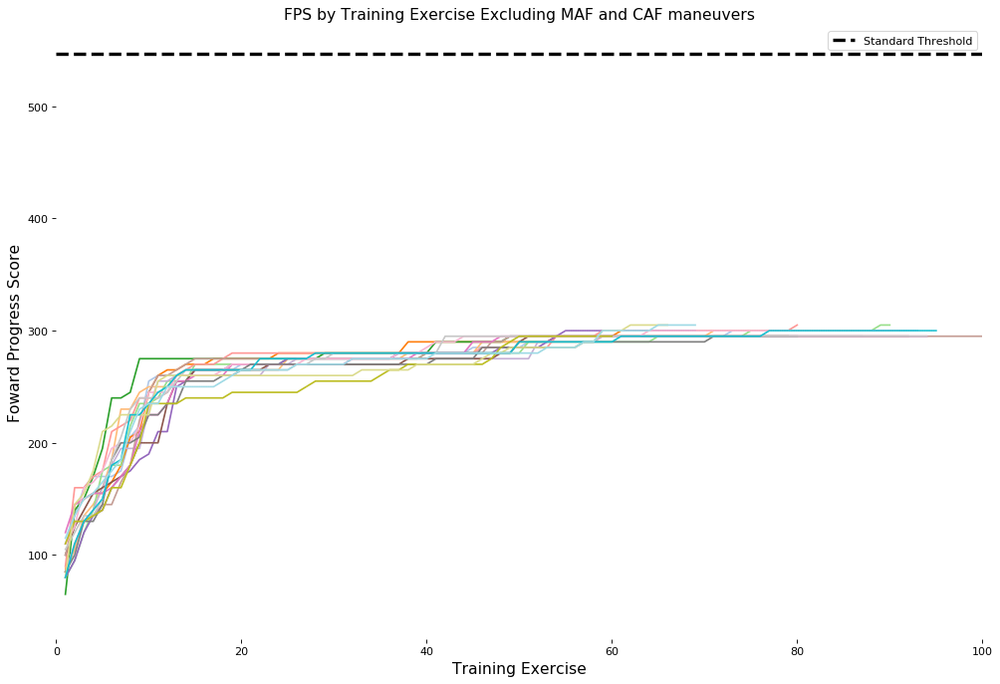

In [126]:
clr = plt.get_cmap('Set1')

# These are the "Tableau 20" colors as RGB.    
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]    
  
# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = (r / 255., g / 255., b / 255.)  

plt.figure(num=4, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='w')

for j in range(1,totalStudents + 1):
    x = excludingMAFCAF[excludingMAFCAF['Student ID']== j]['Training Exercise']
    y = excludingMAFCAF[excludingMAFCAF['Student ID']== j]['FPS']
    plt.plot(x,y, color=tableau20[j])
    #plt.plot(x,y, color=tableau20[j], label ='student%s'%j) #if i want to label student in legend

#plot threshold lines
Standardline = plt.axhline(y=maxFPScalc_stand, color='black', linestyle='--', lw=3, label = 'Standard Threshold') 

# get rid of grid lines
ax = plt.subplot(111)    
ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False) 

# Provide tick lines across the plot to help your viewers trace along    
# the axis ticks. Make sure that the lines are light and small so they    
# don't obscure the primary data lines.    
for y in range(50, 501, 50):    
    plt.plot(range(0, 100), [y] * len(range(0, 100)), "--", lw=0.3, color="w", alpha=0.5)
    
    
#get rid of left margin
plt.margins(x=0)

#change style to negative(black)
#plt.style.use('dark_background')
plt.style.use('default')
plt.figure(4).patch.set_facecolor('xkcd:white')
plt.gca().set_facecolor('xkcd:white')

#basic labels
plt.title('FPS by Training Exercise Excluding MAF and CAF maneuvers', fontsize = 14)
plt.ylabel('Foward Progress Score', fontsize = 14,color = 'black')
plt.xlabel('Training Exercise', fontsize = 14,color = 'black')
plt.legend([Standardline],['Standard Threshold'])
plt.savefig("/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/FPS-by-TrainingExercise-wo.png", bbox_inches="tight")
plt.show()

### Trends in Maneuver Introduction

Shoes that there is no specific order for maneuvers to be introduced, so all maneuvers can be weighted the same in FPS calculations.

In [127]:
#gets names of columns that dont have 0 values in the rows. 
def non_zero(row, columns):
    return list(columns[~(row == 0)])

In [ ]:
trendsDict = dict([(key,[]) for key in PTNdata1["Student ID"].unique()])
print(trendsDict)

In [ ]:
#change i to change student id
i = 16
studentTrack = PTNdata1[PTNdata1['Student ID']== i]
#studentTrack.head(15)

In [ ]:
#put choice trends into seperate data frames for each student ID

for stud in PTNdata1["Student ID"].unique():
    
    studentTrack = PTNdata1[PTNdata1['Student ID']== stud]

    choiceTrends = pd.DataFrame(columns = ['Training Exercise','# Total Maneuvers Used','# Current Maneuvers Used','# New Maneuvers Introduced', '# Used Maneuvers performed', 'New from Past 1','Deleted from past 1', 'New from Past 2','Deleted from past 2','New from Past 3','Deleted from past 3'])

    usedManTotal = [] #all maneuvers used at that point

    for j in studentTrack['Training Exercise'].unique():

        currentMans = list(studentTrack[studentTrack['Training Exercise'] == j].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j].iloc[:,3:-4].columns), axis=1))

        if j == 1:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))

            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])

            choiceTrends = choiceTrends.append({'Training Exercise': j ,'# Total Maneuvers Used': len(usedManTotal),'# Current Maneuvers Used': len(currentMans[0]),'# New Maneuvers Introduced': newManIntro, '# Used Maneuvers performed': 0,  'New from Past 1': np.nan, 'Deleted from past 1': np.nan,'New from Past 2': np.nan, 'Deleted from past 2': np.nan, 'New from Past 3': np.nan, 'Deleted from past 3': np.nan}, ignore_index=True)

        if j == 2:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))
            #print(newManIntro)
            usedManPerf = len([x for x in currentMans[0] if x in usedManTotal])

            last1 = list(studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].columns), axis=1))
            #print(last1)
            newPast1 = [x for x in currentMans[0] if x not in last1[0]]  #list of maneuvers that were not in last flight
            delPast1 = [x for x in last1[0] if x not in currentMans[0]] #list of maneuvers that were in last flight but not current flight

            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])

            choiceTrends = choiceTrends.append({'Training Exercise': j ,'# Total Maneuvers Used': len(usedManTotal),'# Current Maneuvers Used': len(currentMans[0]),'# New Maneuvers Introduced': newManIntro, '# Used Maneuvers performed': usedManPerf,  'New from Past 1': len(newPast1), 'Deleted from past 1': len(delPast1),'New from Past 2': np.nan, 'Deleted from past 2': np.nan, 'New from Past 3': np.nan, 'Deleted from past 3': np.nan}, ignore_index=True)

        if j == 3:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))
            #print(newManIntro)
            usedManPerf = len([x for x in currentMans[0] if x in usedManTotal])

            last1 = list(studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].columns), axis=1))
            #print(last1)
            newPast1 = [x for x in currentMans[0] if x not in last1[0]]  #list of maneuvers that were not in last flight
            delPast1 = [x for x in last1[0] if x not in currentMans[0]] #list of maneuvers that were in last flight but not current flight

            last2indy = list(studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].columns), axis=1))
            last2 = list(set(x for l in last2indy for x in l)) #list of all maneuvers in last 2 flights
            #print(last2)
            newPast2 = [x for x in currentMans[0] if x not in last2] #list of maneuvers that were not in last 2 flights
            #print(newPast2[0])
            delPast2 = [x for x in last2 if x not in currentMans[0]] #list of maneuvers that were in any of last 2 flights but not current flight
            #print(delPast2)

            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])

            choiceTrends = choiceTrends.append({'Training Exercise': j ,'# Total Maneuvers Used': len(usedManTotal),'# Current Maneuvers Used': len(currentMans[0]),'# New Maneuvers Introduced': newManIntro, '# Used Maneuvers performed': usedManPerf,  'New from Past 1': len(newPast1), 'Deleted from past 1': len(delPast1),'New from Past 2': len(newPast2), 'Deleted from past 2': len(delPast2), 'New from Past 3': np.nan, 'Deleted from past 3': np.nan}, ignore_index=True)

        if j > 3:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))
            #print(newManIntro)
            usedManPerf = len([x for x in currentMans[0] if x in usedManTotal])

            last1 = list(studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].columns), axis=1))
            #print(last1)
            newPast1 = [x for x in currentMans[0] if x not in last1[0]]  #list of maneuvers that were not in last flight
            delPast1 = [x for x in last1[0] if x not in currentMans[0]] #list of maneuvers that were in last flight but not current flight

            last2indy = list(studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].columns), axis=1))
            last2 = list(set(x for l in last2indy for x in l)) #list of all maneuvers in last 2 flights
            #print(last2)
            newPast2 = [x for x in currentMans[0] if x not in last2] #list of maneuvers that were not in last 2 flights
            delPast2 = [x for x in last2 if x not in currentMans[0]] #list of maneuvers that were in any of last 2 flights but not current flight

            last3indy = list(studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-3)].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-3)].iloc[:,3:-4].columns), axis=1))
            last3 = list(set(x for l in last3indy for x in l)) #list of all maneuvers in last 3 flights
            #print(last3)
            newPast3 = [x for x in currentMans[0] if x not in last3]  #list of maneuvers that were not in last 3 flights
            delPast3 = [x for x in last3 if x not in currentMans[0]] #list of maneuvers that were in any of last 3 flight but not current flight


            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])

            choiceTrends = choiceTrends.append({'Training Exercise': j ,'# Total Maneuvers Used': len(usedManTotal),'# Current Maneuvers Used': len(currentMans[0]),'# New Maneuvers Introduced': newManIntro, '# Used Maneuvers performed': usedManPerf,  'New from Past 1': len(newPast1), 'Deleted from past 1': len(delPast1),'New from Past 2': len(newPast2), 'Deleted from past 2': len(delPast2), 'New from Past 3': len(newPast3), 'Deleted from past 3': len(delPast3)}, ignore_index=True)
    choiceTrends = choiceTrends.reset_index().values.tolist()
    trendsDict[stud].append(choiceTrends)

In [ ]:
dfs = [x[0] for x in trendsDict.values()]
#dfs[1].split()
dfs = [pd.DataFrame(x).iloc[:,1:].reset_index(drop = True) for x in dfs]

#dfs[0]

#Takes the avg of each row-col coordinate in all of the datafr
avgChoiceTrends = pd.concat([each.stack() for each in dfs],axis=1).apply(lambda x:round(x.mean(),1),axis=1).unstack()
avgChoiceTrends = avgChoiceTrends.rename({1: 'Training Exercise',2:'# Total Events Used',3:'# Current Events Used',4:'# New Events Introduced', 5: '# Used Events Performed', 6: 'New From Past 1', 7:'Deleted From Past 1' , 8:'New From Past 2', 9:'Deleted From Past 2', 10:'New From Past 3', 11: 'Deleted From Past 3'},axis = 'columns')
avgChoiceTrends.style.hide_index()
avgChoiceTrends.to_excel('avgChoiceTrends.xlsx')

from pandas.plotting import table
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import six



def render_mpl_table(data, col_width=2.8, row_height=0.4, font_size=10,
                     header_color='#40466e', row_colors=['#f1f1f2', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, **kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold')
            #cell.set_text_props(weight='bold', color='w')
            #cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
        if k[1] < header_columns:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

render_mpl_table(avgChoiceTrends)
plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/avgChoiceTrends.png',bbox_inches="tight")

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
img=mpimg.imread('avgChoiceTrends.png')
imgplot = plt.imshow(img)

In [ ]:
intrOrder = [] #for each student, this is a nested list of the order in which maneuvers were introduced

for i in PTNdata1['Student ID'].unique():

    studentTrack = PTNdata1[PTNdata1['Student ID']== i]

    usedManTotal = [] #all maneuvers used at that point
    usedManOrder = [] #maneuvers and order that they were introduced
    order = 1 #initialize to first maneuver introduced
    
    for j in studentTrack['Training Exercise'].unique():

        currentMans = list(studentTrack[studentTrack['Training Exercise'] == j].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j].iloc[:,3:-4].columns), axis=1))
        if j == 1:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))
            
            if len([x for x in currentMans[0] if x not in usedManTotal]) > 0:
                usedManOrder.extend([[order,[x for x in currentMans[0] if x not in usedManTotal]]])
                order+=1
            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])

            

        if j == 2:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))
            #print(newManIntro)
            usedManPerf = len([x for x in currentMans[0] if x in usedManTotal])

            last1 = list(studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].columns), axis=1))
            #print(last1)
            newPast1 = [x for x in currentMans[0] if x not in last1[0]]  #list of maneuvers that were not in last flight
            delPast1 = [x for x in last1[0] if x not in currentMans[0]] #list of maneuvers that were in last flight but not current flight
            
            if len([x for x in currentMans[0] if x not in usedManTotal]) > 0:    
                usedManOrder.extend([[order,[x for x in currentMans[0] if x not in usedManTotal]]])
                order+=1
            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])
            
        if j == 3:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))
            usedManPerf = len([x for x in currentMans[0] if x in usedManTotal])

            last1 = list(studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].columns), axis=1))
            newPast1 = [x for x in currentMans[0] if x not in last1[0]]  #list of maneuvers that were not in last flight
            delPast1 = [x for x in last1[0] if x not in currentMans[0]] #list of maneuvers that were in last flight but not current flight

            last2indy = list(studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].columns), axis=1))
            last2 = list(set(x for l in last2indy for x in l)) #list of all maneuvers in last 2 flight
            newPast2 = [x for x in currentMans[0] if x not in last2] #list of maneuvers that were not in last 2 flights
            delPast2 = [x for x in last2 if x not in currentMans[0]] #list of maneuvers that were in any of last 2 flights but not current flight
            
            if len([x for x in currentMans[0] if x not in usedManTotal]) > 0:
                usedManOrder.extend([[order,[x for x in currentMans[0] if x not in usedManTotal]]])
                order+=1
            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])
            
        if j > 3:

            newManIntro = len(list(x for x in currentMans[0] if x not in usedManTotal))
            usedManPerf = len([x for x in currentMans[0] if x in usedManTotal])

            last1 = list(studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[studentTrack['Training Exercise'] == j-1].iloc[:,3:-4].columns), axis=1))
            newPast1 = [x for x in currentMans[0] if x not in last1[0]]  #list of maneuvers that were not in last flight
            delPast1 = [x for x in last1[0] if x not in currentMans[0]] #list of maneuvers that were in last flight but not current flight

            last2indy = list(studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-2)].iloc[:,3:-4].columns), axis=1))
            last2 = list(set(x for l in last2indy for x in l)) #list of all maneuvers in last 2 flights
            newPast2 = [x for x in currentMans[0] if x not in last2] #list of maneuvers that were not in last 2 flights
            delPast2 = [x for x in last2 if x not in currentMans[0]] #list of maneuvers that were in any of last 2 flights but not current flight

            last3indy = list(studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-3)].iloc[:,3:-4].apply(lambda x: non_zero(x, studentTrack[(studentTrack['Training Exercise'] <= j-1) & (studentTrack['Training Exercise'] >= j-3)].iloc[:,3:-4].columns), axis=1))
            last3 = list(set(x for l in last3indy for x in l)) #list of all maneuvers in last 3 flights
            newPast3 = [x for x in currentMans[0] if x not in last3]  #list of maneuvers that were not in last 3 flights
            delPast3 = [x for x in last3 if x not in currentMans[0]] #list of maneuvers that were in any of last 3 flight but not current flight
            
            if len([x for x in currentMans[0] if x not in usedManTotal]) > 0:
                usedManOrder.extend([[order,[x for x in currentMans[0] if x not in usedManTotal]]])
                order+=1
            usedManTotal.extend([x for x in currentMans[0] if x not in usedManTotal])

    intrOrder.extend([usedManOrder])

In [ ]:
orderDict = { i : intrOrder[0][i-1][1] for i in range(1,len(intrOrder[0]))}
orderDict

In [ ]:
#list(PTNdata1_final.iloc[:,3:-4].columns.values)
intrOrder[1]   

In [ ]:
PTNdata1_final.head(10)

# look at average amount of time to get to 1,2,3,4 for all events

In [ ]:
data = pd.read_csv(PTNdata1Path)
data = data.iloc[0:, 1:] #get rid of row just counting overall observation
data.head()

In [ ]:
# avgTimeToMIF = pd.DataFrame(np.nan,columns = data.iloc[:,3:-4].columns, index = [1,2,3,4])
# timeToMIF = pd.DataFrame(np.nan,columns = data.iloc[:,3:-4].columns, index = [1,2,3,4])

# timeToMIF

In [ ]:
# for stud in data['Student ID'].unique():
#     df = data[data['Student ID'] == stud].iloc[:,3:-4]
#     for grade in range(1,5):
#         for col in df.columns:
#             #for each column in df, find the first occurence of grade and place it in corresponding column of new data frame. 
#             first = (df[col].values == grade).argmax()
#             timeToMIF[col][grade] = first
        
# avgTimeToMIF = avgTimeToMIF.add(timeToMIF,fill_value = 0)
    
# #FIND WAY TO SEE IF STUDENTS NEVER GET TO MIF. MAYBE CALCUALTE COUNTS FOR HOW MANY STUDENTS GET TO EACH LEVEL FOR EACH FLIGHT EVENT. MAKE DATAFRAME SAME SHAPE AS AVGTIMETOMIF AND THEN DIVIDE BY IT
# avgTimeToMIF = avgTimeToMIF/len(data['Student ID'].unique())
# avgTimeToMIF

# Stats for how often it takes students to reach MIF in every Event

In [ ]:
reachMIF = pd.DataFrame(np.nan,columns = data.iloc[:,3:-3].columns, index = np.arange(1,19,1))


In [ ]:
i = 1
for stud in data['Student ID'].unique():
    df = data[data['Student ID'] == stud].iloc[:,3:-3]
    for col in df.columns:
        count = (df[col].values == maneuverMIF_df[col].values[0]).argmax()
        reachMIF[col][i] = count
    i+=1
reachMIF = reachMIF.replace(0,np.nan)
reachMIF

In [ ]:
statsMIF = pd.DataFrame(np.nan,columns = ['Min','Median','Mean','Max'], index = data.iloc[:,3:-3].columns)

In [ ]:
for col in reachMIF.columns:
    minMIF = np.nanmin(reachMIF[col])
    medMIF = np.nanmedian(reachMIF[col])
    meanMIF = np.nanmean(reachMIF[col])
    maxMIF = np.nanmax(reachMIF[col])
    statsMIF['Min'][col] = minMIF
    statsMIF['Median'][col] = medMIF
    statsMIF['Mean'][col] = round(meanMIF)
    statsMIF['Max'][col] = maxMIF

statsMIF.to_excel('statsMIF.xlsx')
statsMIF.head()

## Average Statistics for how long it takes to get to MIF

In [ ]:
def render_mpl_table(data, col_width=1.5, row_height=0.4, font_size=10,
                     header_color='#40466e', row_colors=['#f1f1f2', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, rowLabels = data.index,**kwargs)

    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)

    for k, cell in six.iteritems(mpl_table._cells):
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold')
            #cell.set_text_props(weight='bold', color='w')
            #cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
        if k[1] < header_columns:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax
render_mpl_table(statsMIF)
plt.savefig('/Users/nickcforrest/Documents/My Documents/Education/AFIT/AFIT WORK/Thesis Work/Visuals/statsMIF.png',bbox_inches="tight")



In [ ]:
img=mpimg.imread('statsMIF.png')
imgplot = plt.imshow(img)

## 